# Dateset web-scraping & analysis

## The notebook about web-scraping, analysis and feature engineering of Russian day-ahead electricity market prices dataset is located [here.](https://github.com/Backgammonian/Machine-Learning-Tasks/blob/main/Time%20series/Russian%20Day-Ahead%20Electricity%20Market%20Price%20Web-Scraping.ipynb)

# Forecasting using cross-validation

## Prepared dataset lookup

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sb
import numpy as np

df_sup = pd.read_csv('electricity_price_hourly_supplier.csv', index_col = 'date')
df_con = pd.read_csv('electricity_price_hourly_consumer.csv', index_col = 'date')

In [3]:
df_sup

,supplier_price,year,quarter,month,week_of_year,day,day_of_year,day_of_week,hour
date,,,,,,,,,
2019-05-27 00:00:00+00:00,949.90,2019,2,5,22,27,147,0,0
2019-05-27 01:00:00+00:00,942.20,2019,2,5,22,27,147,0,1
2019-05-27 02:00:00+00:00,952.14,2019,2,5,22,27,147,0,2
2019-05-27 03:00:00+00:00,944.93,2019,2,5,22,27,147,0,3
2019-05-27 04:00:00+00:00,966.00,2019,2,5,22,27,147,0,4
...,...,...,...,...,...,...,...,...,...
2024-05-27 19:00:00+00:00,1227.36,2024,2,5,22,27,148,0,19
2024-05-27 20:00:00+00:00,1010.99,2024,2,5,22,27,148,0,20
2024-05-27 21:00:00+00:00,936.12,2024,2,5,22,27,148,0,21


In [4]:
df_con

,consumer_price,year,quarter,month,week_of_year,day,day_of_year,day_of_week,hour
date,,,,,,,,,
2019-05-27 00:00:00+00:00,977.14,2019,2,5,22,27,147,0,0
2019-05-27 01:00:00+00:00,963.62,2019,2,5,22,27,147,0,1
2019-05-27 02:00:00+00:00,973.13,2019,2,5,22,27,147,0,2
2019-05-27 03:00:00+00:00,968.37,2019,2,5,22,27,147,0,3
2019-05-27 04:00:00+00:00,990.70,2019,2,5,22,27,147,0,4
...,...,...,...,...,...,...,...,...,...
2024-05-27 19:00:00+00:00,1296.07,2024,2,5,22,27,148,0,19
2024-05-27 20:00:00+00:00,1097.29,2024,2,5,22,27,148,0,20
2024-05-27 21:00:00+00:00,1002.35,2024,2,5,22,27,148,0,21


## Let's rearrange datasets

In [5]:
df_sup = df_sup[['year', 'quarter', 'month', 'week_of_year', 'day_of_year', 'day_of_week', 'day', 'hour', 'supplier_price']]
df_con = df_con[['year', 'quarter', 'month', 'week_of_year', 'day_of_year', 'day_of_week', 'day', 'hour', 'consumer_price']]

In [6]:
df_sup.to_csv('electricity_price_hourly_supplier_fix.csv', index = True)
df_con.to_csv('electricity_price_hourly_consumer_fix.csv', index = True)

### Saving fixed datasets

In [2]:
import pandas as pd

df_sup = pd.read_csv('electricity_price_hourly_supplier_fix.csv', index_col = 'date')
df_con = pd.read_csv('electricity_price_hourly_consumer_fix.csv', index_col = 'date')

In [3]:
df_sup

,year,quarter,month,week_of_year,day_of_year,day_of_week,day,hour,supplier_price
date,,,,,,,,,
2019-05-27 00:00:00+00:00,2019,2,5,22,147,0,27,0,949.90
2019-05-27 01:00:00+00:00,2019,2,5,22,147,0,27,1,942.20
2019-05-27 02:00:00+00:00,2019,2,5,22,147,0,27,2,952.14
2019-05-27 03:00:00+00:00,2019,2,5,22,147,0,27,3,944.93
2019-05-27 04:00:00+00:00,2019,2,5,22,147,0,27,4,966.00
...,...,...,...,...,...,...,...,...,...
2024-05-27 19:00:00+00:00,2024,2,5,22,148,0,27,19,1227.36
2024-05-27 20:00:00+00:00,2024,2,5,22,148,0,27,20,1010.99
2024-05-27 21:00:00+00:00,2024,2,5,22,148,0,27,21,936.12


In [9]:
df_con

,year,quarter,month,week_of_year,day_of_year,day_of_week,day,hour,consumer_price
date,,,,,,,,,
2019-05-27 00:00:00+00:00,2019,2,5,22,147,0,27,0,977.14
2019-05-27 01:00:00+00:00,2019,2,5,22,147,0,27,1,963.62
2019-05-27 02:00:00+00:00,2019,2,5,22,147,0,27,2,973.13
2019-05-27 03:00:00+00:00,2019,2,5,22,147,0,27,3,968.37
2019-05-27 04:00:00+00:00,2019,2,5,22,147,0,27,4,990.70
...,...,...,...,...,...,...,...,...,...
2024-05-27 19:00:00+00:00,2024,2,5,22,148,0,27,19,1296.07
2024-05-27 20:00:00+00:00,2024,2,5,22,148,0,27,20,1097.29
2024-05-27 21:00:00+00:00,2024,2,5,22,148,0,27,21,1002.35


## Price plot

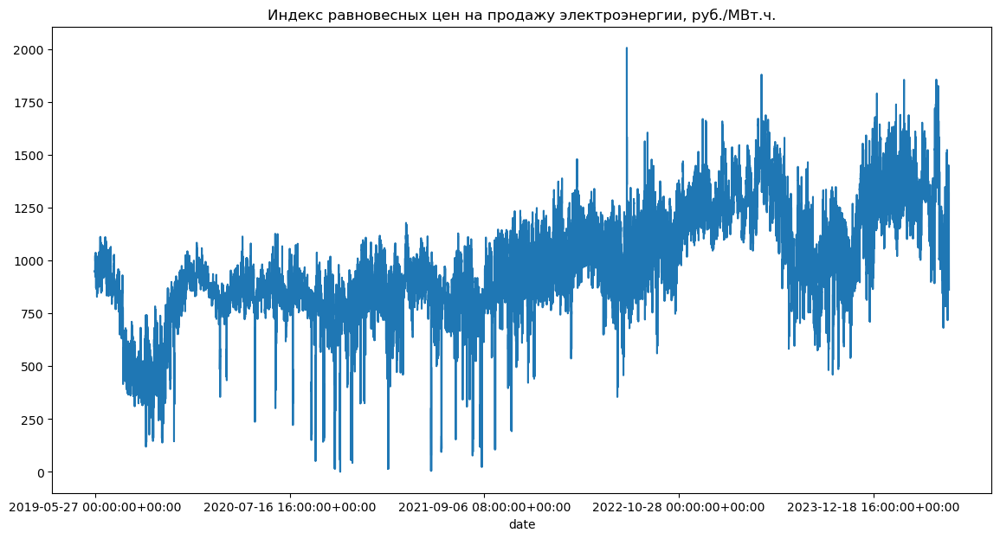

In [3]:
plt.figure(figsize = (14, 7))
df_sup['supplier_price'].plot()
plt.title('Индекс равновесных цен на продажу электроэнергии, руб./МВт.ч.')
plt.show()

## Price distribution

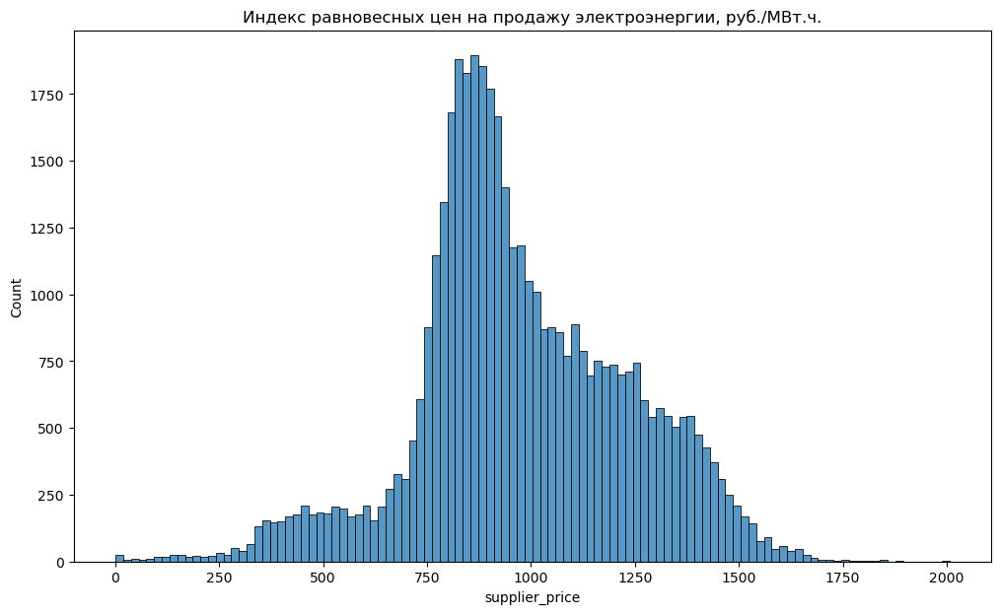

In [4]:
plt.figure(figsize = (12, 7))
plt.title('Индекс равновесных цен на продажу электроэнергии, руб./МВт.ч.')
sb.histplot(df_sup['supplier_price'])
plt.show()

## Statistical tests for normality of distribution

In [4]:
from scipy import stats as st
import statsmodels.api as sm

def run_tests_for_normality(data, alpha = 0.05):
    statistic, p_value = st.normaltest(data)
    if p_value > alpha:
        result = 'Normal'
    else:
        result = 'NOT Normal'
    print(f"D'Agostino & Pearson: {result:>11s}")
    print(statistic)
    print()
    
    statistic, pvalue = st.jarque_bera(data)
    if pvalue > alpha:
        result = 'Normal'
    else:
        result = 'NOT Normal'
    print(f'Jarque-Bera: {result:>20s}')
    print(statistic)
    print()

    ksstat, pvalue = sm.stats.diagnostic.kstest_normal(data)
    if pvalue > alpha:
        result = 'Normal'
    else:
        result = 'NOT Normal'
    print(f'Kolmogorov-Smirnov: {result:>13s}')
    print(ksstat)
    print()

    ksstat, pvalue = sm.stats.diagnostic.lilliefors(data)
    if pvalue > alpha:
        result = 'Normal'
    else:
        result = 'NOT Normal'
    print(f'Lilliefors: {result:>21s}')
    print(ksstat)
    print()

    statistic, pvalue = st.shapiro(data)
    if pvalue > alpha:
        result = 'Normal'
    else:
        result = 'NOT Normal'
    print(f'Shapiro-Wilk: {result:>19s}')
    print(statistic)
    print()

    result = st.anderson(data)
    idx = np.where(result.significance_level == alpha * 100)
    if result.statistic < result.critical_values[idx]:
        verdict = 'Normal'
    else:
        verdict = 'NOT Normal'
    print(f'Anderson–Darling: {verdict:>15s}')
    print(result.statistic)
    print()
    
def show_probability_plot(data):
    st.probplot(data, dist = 'norm', plot = plt)
    plt.show()
    
def show_quantile_quantile_plot(data):
    sm.qqplot(data, line = '45')
    plt.show()

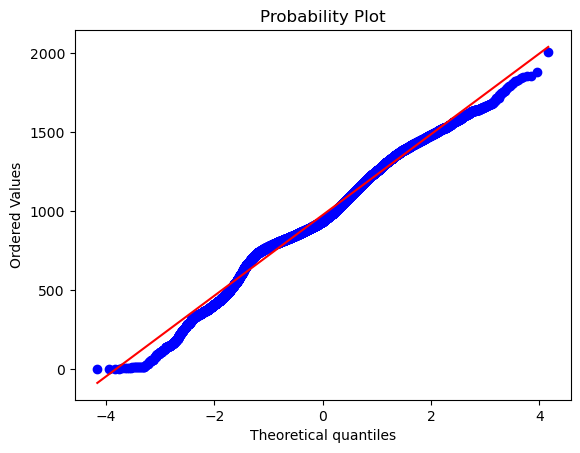

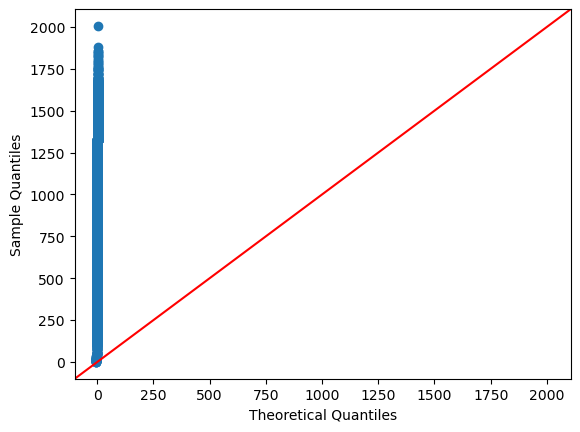

D'Agostino & Pearson:  NOT Normal
132.41352354071472

Jarque-Bera:           NOT Normal
169.63672190328668

Kolmogorov-Smirnov:    NOT Normal
0.061964345409667804

Lilliefors:            NOT Normal
0.061964345409667804

Shapiro-Wilk:          NOT Normal
0.9839980006217957

Anderson–Darling:      NOT Normal
299.56824790379324



C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\scipy\stats\_morestats.py:1816: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")


In [6]:
show_probability_plot(df_sup['supplier_price'])
show_quantile_quantile_plot(df_sup['supplier_price'])
run_tests_for_normality(df_sup['supplier_price'])

## Price outliers check

In [8]:
from scipy import stats
import numpy as np

def remove_outliers(df, column):
    q_low = df[column].quantile(0.01)
    q_high = df[column].quantile(0.99)
    return df[(df[column] < q_high) & (df[column] > q_low)]

def remove_outliers_z_score(df, column):
    result = df.copy()
    result['z_score'] = stats.zscore(df[column])
    result = result.loc[result['z_score'].abs() <= 3]
    return result

In [9]:
df1 = remove_outliers(df_sup, 'supplier_price')
df2 = remove_outliers_z_score(df_sup, 'supplier_price')

print(f'Outliers count (1st and 99th quantiles): {len(df_sup) - len(df1)} ({(len(df_sup) - len(df1)) * 100.0 / len(df_sup)}%)')
print(f'Outliers count (Z-score): {len(df_sup) - len(df2)} ({(len(df_sup) - len(df2)) * 100.0 / len(df_sup)}%)')

Outliers count (1st and 99th quantiles): 878 (2.00127644055434%)
Outliers count (Z-score): 190 (0.43307804522246535%)


In [10]:
df_sup[(df_sup['supplier_price'] < 10)]

,supplier_price,year,quarter,month,week_of_year,day,day_of_year,day_of_week,hour
date,,,,,,,,,
2020-11-01 20:00:00+00:00,0.45,2020,4,11,44,1,306,6,20
2020-11-01 21:00:00+00:00,0.99,2020,4,11,44,1,306,6,21
2020-11-01 22:00:00+00:00,0.46,2020,4,11,44,1,306,6,22
2020-11-01 23:00:00+00:00,0.46,2020,4,11,44,1,306,6,23
2021-05-15 01:00:00+00:00,6.00,2021,2,5,19,15,135,5,1
2021-05-15 02:00:00+00:00,4.51,2021,2,5,19,15,135,5,2
2021-05-15 20:00:00+00:00,4.43,2021,2,5,19,15,135,5,20
2021-05-15 22:00:00+00:00,4.56,2021,2,5,19,15,135,5,22
2021-05-15 23:00:00+00:00,6.90,2021,2,5,19,15,135,5,23


## What the difference between consumer and supplier prices looks like?

In [24]:
sup_prices = df_sup['supplier_price']
con_prices = df_con['consumer_price']
result = con_prices - sup_prices
#result = sup_prices - con_prices
result

date
2019-05-27 00:00:00+00:00    27.24
2019-05-27 01:00:00+00:00    21.42
2019-05-27 02:00:00+00:00    20.99
2019-05-27 03:00:00+00:00    23.44
2019-05-27 04:00:00+00:00    24.70
                             ...  
2024-05-27 19:00:00+00:00    68.71
2024-05-27 20:00:00+00:00    86.30
2024-05-27 21:00:00+00:00    66.23
2024-05-27 22:00:00+00:00    56.47
2024-05-27 23:00:00+00:00    49.31
Length: 43872, dtype: float64

In [25]:
result.describe()

count    43872.000000
mean        69.016620
std         34.340587
min        -10.920000
25%         44.380000
50%         60.080000
75%         85.030000
max        316.420000
dtype: float64

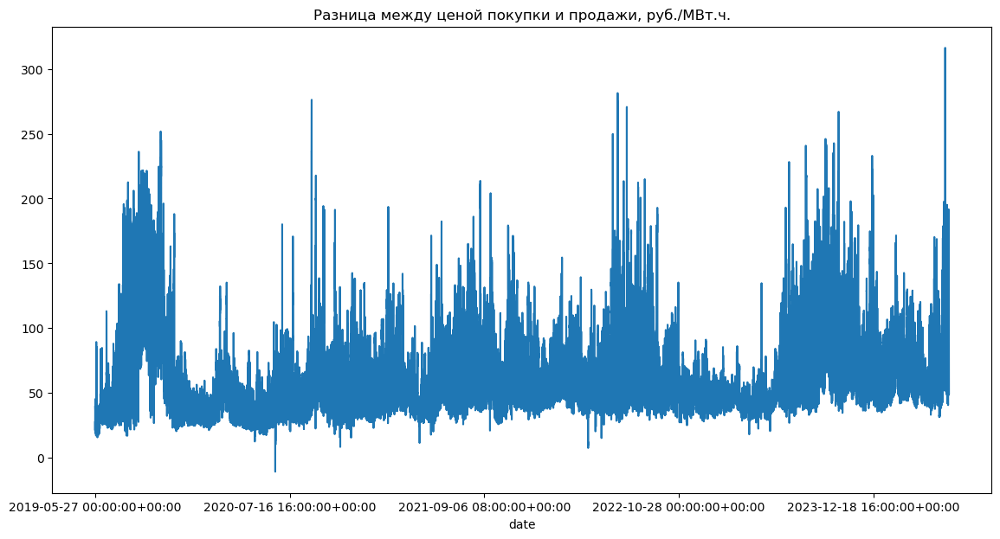

In [26]:
plt.figure(figsize = (14, 7))
result.plot()
plt.title('Разница между ценой покупки и продажи, руб./МВт.ч.')
plt.show()

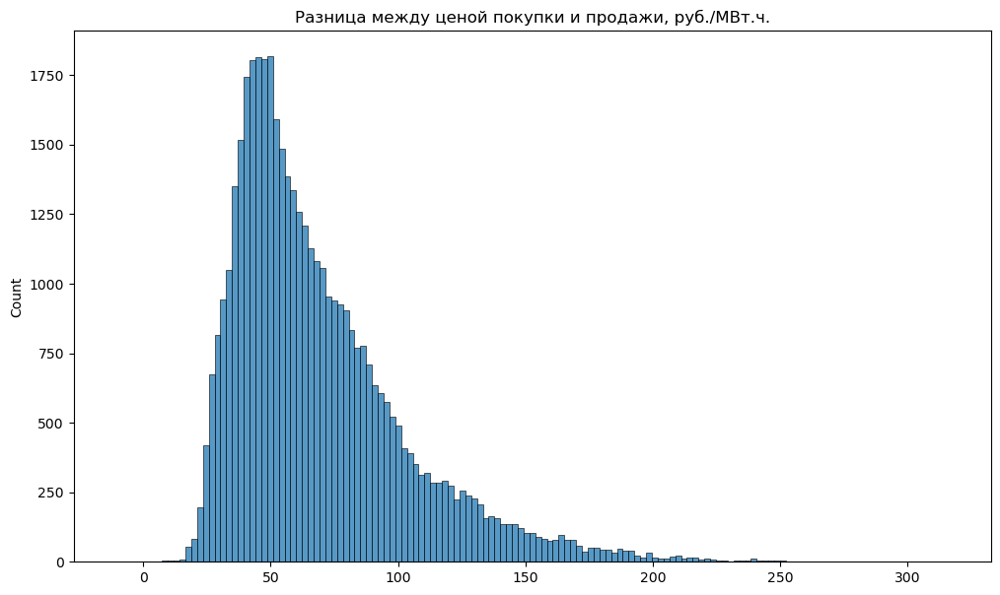

In [27]:
plt.figure(figsize = (12, 7))
plt.title('Разница между ценой покупки и продажи, руб./МВт.ч.')
sb.histplot(result)
plt.show()

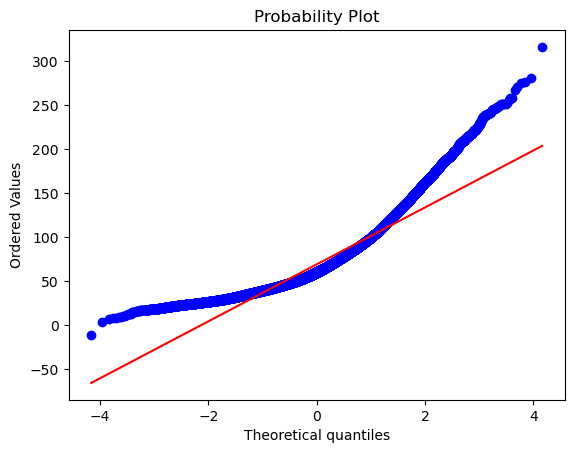

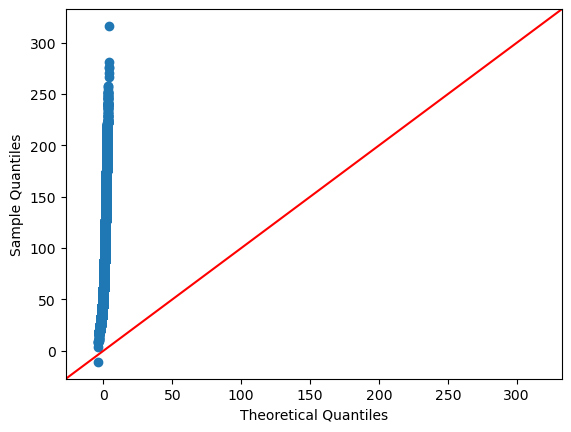

D'Agostino & Pearson:  NOT Normal
11270.28306369284

Jarque-Bera:           NOT Normal
27207.632642061715

Kolmogorov-Smirnov:    NOT Normal
0.10703842360700944

Lilliefors:            NOT Normal
0.10703842360700944

Shapiro-Wilk:          NOT Normal
0.8900027275085449

Anderson–Darling:      NOT Normal
1240.7804617619186



C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\scipy\stats\_morestats.py:1816: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")


In [28]:
show_probability_plot(result)
show_quantile_quantile_plot(result)
run_tests_for_normality(result)

## Train & test split

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sb
import numpy as np

df_sup = pd.read_csv('electricity_price_hourly_supplier_fix.csv', index_col = 'date')
df_sup

,year,quarter,month,week_of_year,day_of_year,day_of_week,day,hour,supplier_price
date,,,,,,,,,
2019-05-27 00:00:00+00:00,2019,2,5,22,147,0,27,0,949.90
2019-05-27 01:00:00+00:00,2019,2,5,22,147,0,27,1,942.20
2019-05-27 02:00:00+00:00,2019,2,5,22,147,0,27,2,952.14
2019-05-27 03:00:00+00:00,2019,2,5,22,147,0,27,3,944.93
2019-05-27 04:00:00+00:00,2019,2,5,22,147,0,27,4,966.00
...,...,...,...,...,...,...,...,...,...
2024-05-27 19:00:00+00:00,2024,2,5,22,148,0,27,19,1227.36
2024-05-27 20:00:00+00:00,2024,2,5,22,148,0,27,20,1010.99
2024-05-27 21:00:00+00:00,2024,2,5,22,148,0,27,21,936.12


In [20]:
rows_count = len(df_sup)
proportion = 0.80
train_count = int(rows_count * proportion)
test_count = rows_count - train_count
df_train = df_sup[:train_count].copy()
df_test = df_sup[train_count:train_count + test_count].copy()
print(f'Train: {len(df_train)}')
print(f'Test: {len(df_test)}')

Train: 35097
Test: 8775


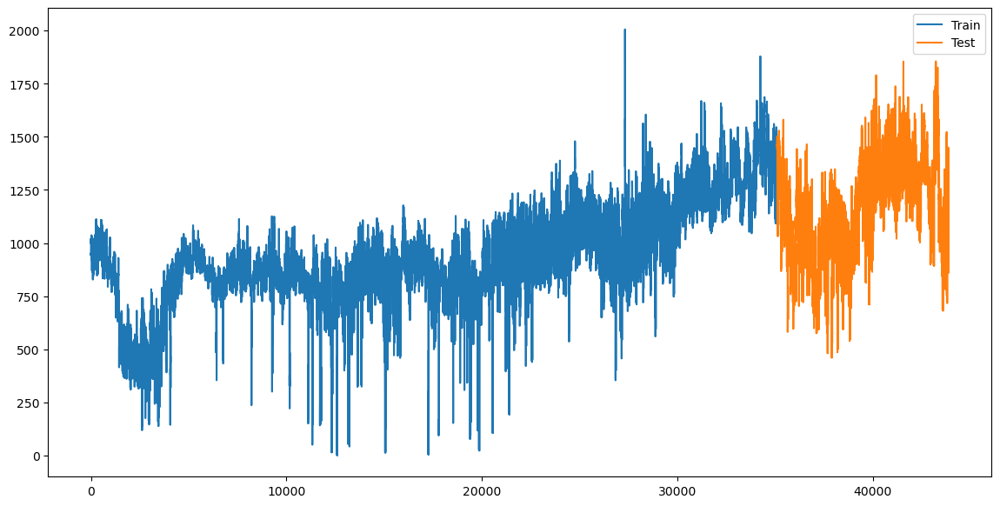

In [21]:
x1 = np.linspace(0, len(df_train), len(df_train))
x2 = np.linspace(len(df_train), len(df_train) + len(df_test), len(df_test))
plt.figure(figsize = (14, 7))
plt.plot(x1, df_train['supplier_price'].tolist())
plt.plot(x2, df_test['supplier_price'].tolist())
plt.legend(['Train', 'Test'])
plt.show()

## Extrapolation

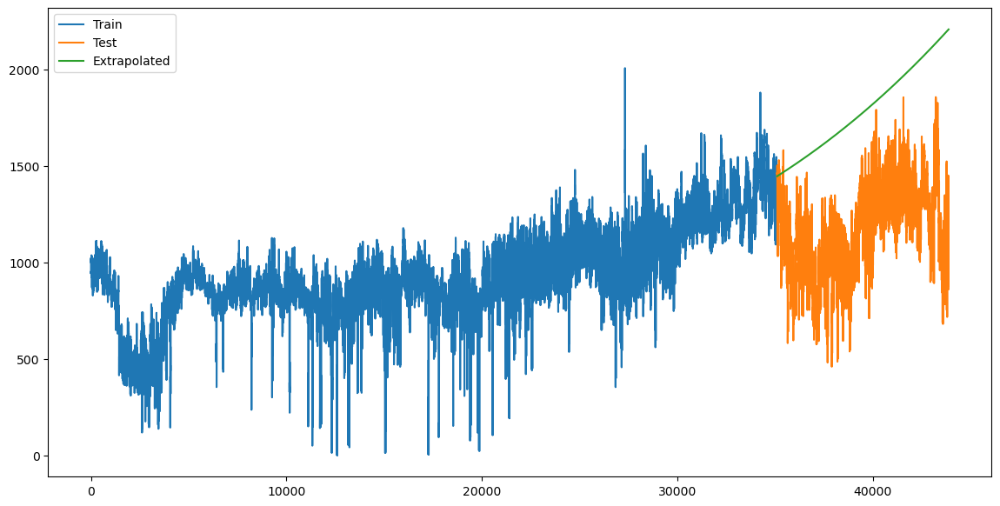

In [33]:
x1 = np.linspace(0, len(df_train), len(df_train))
x2 = np.linspace(len(df_train), len(df_train) + len(df_test), len(df_test))
y1 = df_train['supplier_price'].tolist()
y2 = df_test['supplier_price'].tolist()
p = np.polyfit(x1, y1, 3)
y_extrapolated = np.polyval(p, x2)

plt.figure(figsize = (14, 7))
plt.plot(x1, y1)
plt.plot(x2, y2)
plt.plot(x2, y_extrapolated)
plt.legend(['Train', 'Test', 'Extrapolated'])
plt.show()

## Functions, variables & constants listing

In [2]:
from scipy import stats as st
import statsmodels.api as sm

def run_tests_for_normality(data, alpha = 0.05):
    statistic, p_value = st.normaltest(data)
    if p_value > alpha:
        result = 'Normal'
    else:
        result = 'NOT Normal'
    print(f"D'Agostino & Pearson: {result:>11s}")
    print(statistic)
    print()
    
    statistic, pvalue = st.jarque_bera(data)
    if pvalue > alpha:
        result = 'Normal'
    else:
        result = 'NOT Normal'
    print(f'Jarque-Bera: {result:>20s}')
    print(statistic)
    print()

    ksstat, pvalue = sm.stats.diagnostic.kstest_normal(data)
    if pvalue > alpha:
        result = 'Normal'
    else:
        result = 'NOT Normal'
    print(f'Kolmogorov-Smirnov: {result:>13s}')
    print(ksstat)
    print()

    ksstat, pvalue = sm.stats.diagnostic.lilliefors(data)
    if pvalue > alpha:
        result = 'Normal'
    else:
        result = 'NOT Normal'
    print(f'Lilliefors: {result:>21s}')
    print(ksstat)
    print()

    statistic, pvalue = st.shapiro(data)
    if pvalue > alpha:
        result = 'Normal'
    else:
        result = 'NOT Normal'
    print(f'Shapiro-Wilk: {result:>19s}')
    print(statistic)
    print()

    result = st.anderson(data)
    idx = np.where(result.significance_level == alpha * 100)
    if result.statistic < result.critical_values[idx]:
        verdict = 'Normal'
    else:
        verdict = 'NOT Normal'
    print(f'Anderson–Darling: {verdict:>15s}')
    print(result.statistic)
    print()
    
def show_probability_plot(data):
    st.probplot(data, dist = 'norm', plot = plt)
    plt.show()
    
def show_quantile_quantile_plot(data):
    sm.qqplot(data, line = '45')
    plt.show()

In [3]:
from sklearn.model_selection import TimeSeriesSplit
import numpy as np
from sklearn.metrics import r2_score as r2, mean_squared_error as mse
from sklearn.metrics import mean_absolute_error as mae, mean_absolute_percentage_error as mape

def smape(y_true, y_pred):
    absolute_diff = np.abs(y_true - y_pred)
    sum_absolute = np.abs(y_true) + np.abs(y_pred)
    mask = sum_absolute != 0
    score = np.mean(200 * (absolute_diff[mask] / sum_absolute[mask]))
    return score

In [4]:
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import seaborn as sb

def show_regression_chart(y, prediction, sort = True):
    t = pd.DataFrame({'prediction': prediction, 'y': y})
    if sort:
        t.sort_values(by = ['y'], inplace = True)
    plt.figure(figsize = (10, 6))
    plt.plot(t['y'].tolist(), label = 'expected')
    plt.plot(t['prediction'].tolist(), label = 'prediction')
    plt.ylabel('output')
    plt.legend()
    plt.xticks(rotation = 45)
    plt.show()
    
def show_error_histogram(y_true, y_pred):
    plt.title('Error histogram')
    sb.histplot(y_true - y_pred)
    plt.show()

In [ ]:
import random
import numpy as np

RANDOM_STATE = 42
np.random.seed(RANDOM_STATE)
random.seed(RANDOM_STATE)

In [5]:
NUM_OF_SPLITS = 10
LATEST_PRED_AMOUNT = 300
TARGET_COLUMN = 'supplier_price'

df_train = df_sup.copy()
results = {
    'r2' : [],
    'mse' : [],
    'rmse' : [],
    'mae' : [],
    'mape' : [],
    'smape' : []
}

## Prediction

### ML models

In [6]:
from sklearn.dummy import DummyRegressor
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import BayesianRidge
from sklearn.linear_model import PassiveAggressiveRegressor
from sklearn.linear_model import SGDRegressor
from sklearn.svm import SVR
from sklearn.svm import LinearSVR
from sklearn.neighbors import KNeighborsRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import ExtraTreesRegressor
from sklearn.ensemble import BaggingRegressor
from sklearn.ensemble import AdaBoostRegressor
from sklearn.ensemble import HistGradientBoostingRegressor
from xgboost import XGBRegressor
from catboost import CatBoostRegressor

In [38]:
class ConstantRegressor:
    def __init__(self):
        self.constant = 0
        self.is_fit = False

    def fit(self, x_train, y_train):
        if len(x_train) != len(y_train):
            raise Exception('Train and test sequences have different lengths!')
        self.constant = y_train.iloc[0][0]
        self.is_fit = True

    def predict(self, x_test):
        if self.is_fit == False:
            raise Exception('Predictor was not trained!')
        return np.array([self.constant] * len(x_test))

    
class DriftRegressor:
    def __init__(self):
        self.y_0 = 0
        self.y_1 = 0
        self.is_fit = False
        
    def fit(self, x_train, y_train):
        if len(x_train) != len(y_train):
            raise Exception('Train and test sequences have different lengths!')
        self.y_0 = y_train.iloc[0][0]
        self.y_1 = y_train.iloc[-1][0]
        self.is_fit = True
        
    def predict(self, x_test):
        if self.is_fit == False:
            raise Exception('Predictor was not trained!')
        output = []
        if len(x_test) <= 1:
            output.append(self.y_0)
            return output
        x_0 = 0
        x_1 = len(x_test)
        l = abs(x_1 - x_0)
        dy = (self.y_1 - self.y_0) / l
        y = self.y_0
        i = 1
        while i <= l:
            output.append(y)
            y += dy
            i += 1
        return np.array(output)

In [8]:
models = []
models.append(('Naive', ConstantRegressor()))
models.append(('Drift', DriftRegressor()))
models.append(('Average', DummyRegressor(strategy = 'mean')))
models.append(('LR', LinearRegression(fit_intercept = False)))
models.append(('Bayesian R.', BayesianRidge(fit_intercept = False)))
models.append(('PAR', PassiveAggressiveRegressor(
    max_iter = 100, 
    random_state = RANDOM_STATE, 
    tol = 1e-3, 
    fit_intercept = False)))
models.append(('SGD', SGDRegressor(random_state = RANDOM_STATE, shuffle = False, fit_intercept = False)))
models.append(('SVR', SVR(max_iter = 100)))
models.append(('Lin. SVR', LinearSVR(max_iter = 100, random_state = RANDOM_STATE, fit_intercept = False)))
models.append(('KNN', KNeighborsRegressor(n_neighbors = 20, n_jobs = -1)))
models.append(('CART', DecisionTreeRegressor(random_state = RANDOM_STATE)))
models.append(('RF', RandomForestRegressor(n_jobs = -1, random_state = RANDOM_STATE, bootstrap = False)))
models.append(('RF w/Bootstrap', RandomForestRegressor(n_jobs = -1, random_state = RANDOM_STATE, bootstrap = True)))
models.append(('XT', ExtraTreesRegressor(n_jobs = -1, random_state = RANDOM_STATE, bootstrap = False)))
models.append(('XT w/Bootstrap', ExtraTreesRegressor(n_jobs = -1, random_state = RANDOM_STATE, bootstrap = True)))
models.append(('BAG', BaggingRegressor(n_jobs = -1, random_state = RANDOM_STATE, bootstrap = False)))
models.append(('BAG w/Bootstrap', BaggingRegressor(n_jobs = -1, random_state = RANDOM_STATE, bootstrap = True)))
models.append(('ADA', AdaBoostRegressor(random_state = RANDOM_STATE)))
models.append(('HGBoost', HistGradientBoostingRegressor(random_state = RANDOM_STATE)))
models.append(('XGBoost', XGBRegressor(tree_method = 'gpu_hist', verbosity = 0, random_state = RANDOM_STATE)))
models.append(('CatBoost', CatBoostRegressor(
    random_seed = RANDOM_STATE,
    loss_function = 'RMSE',
    eval_metric = 'MAE',
    od_type = 'Iter',
    od_wait = 20,
    task_type = 'GPU',
    logging_level = 'Silent')))

----------------
Naive model...
Fold #1...
Fold #2...
Fold #3...
Fold #4...
Fold #5...
Fold #6...
Fold #7...
Fold #8...
Fold #9...
Fold #10...


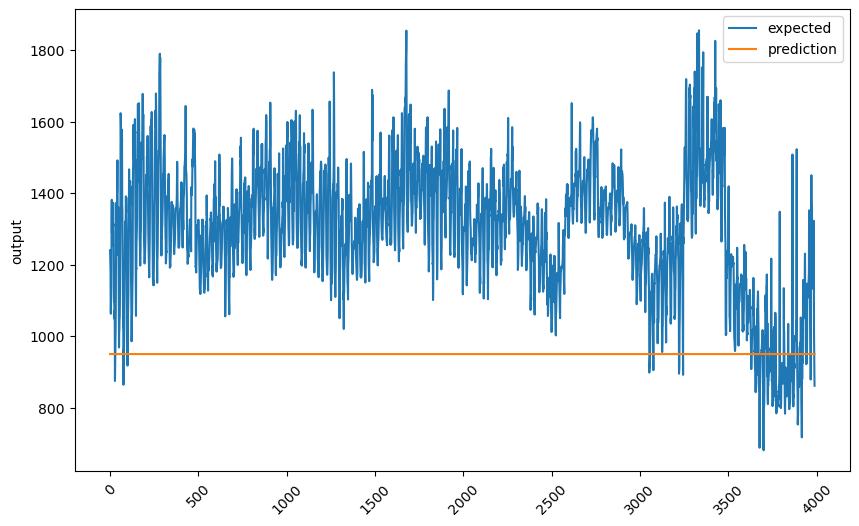

Last 300 values:


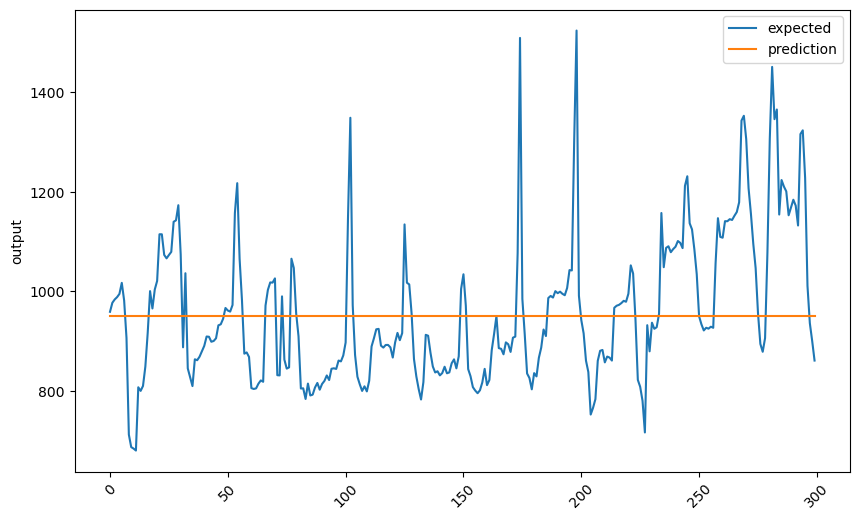

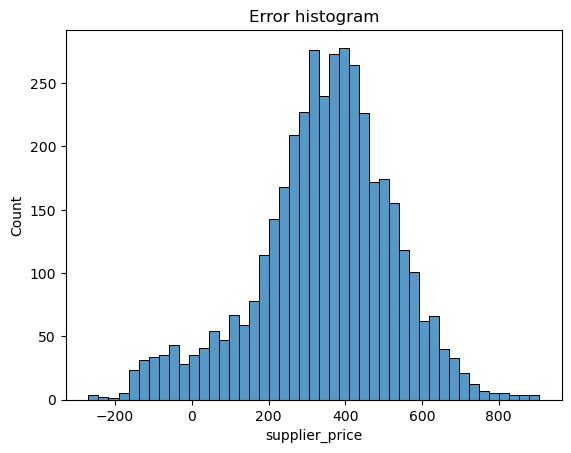

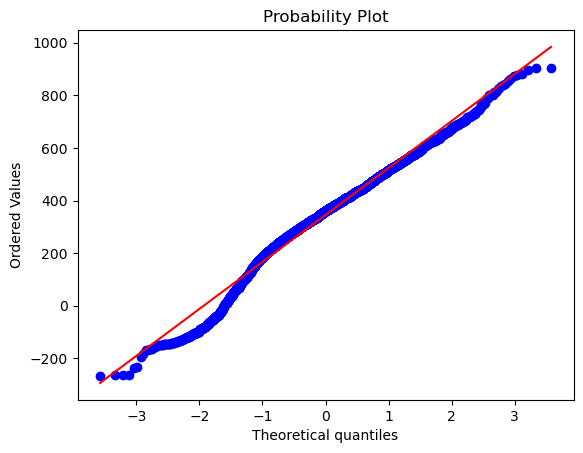

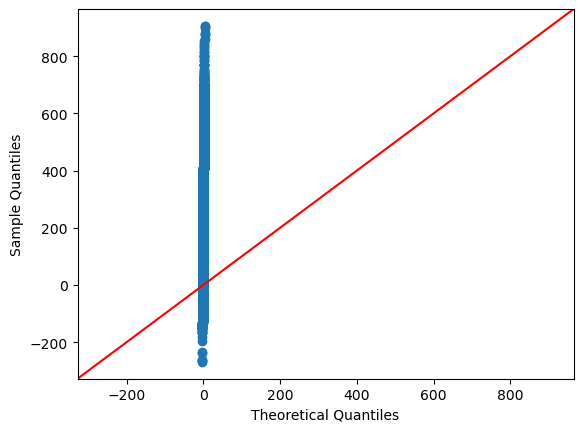

----------
Statistical test for normality of residuals:
----------

D'Agostino & Pearson:  NOT Normal
154.10422573371375

Jarque-Bera:           NOT Normal
178.8932490894559

Kolmogorov-Smirnov:    NOT Normal
0.05401860602165731

Lilliefors:            NOT Normal
0.05401860602165731

Shapiro-Wilk:          NOT Normal
0.9814963340759277

Anderson–Darling:      NOT Normal
22.4632843862546

Done!

----------------
Drift model...
Fold #1...
Fold #2...
Fold #3...
Fold #4...
Fold #5...
Fold #6...
Fold #7...
Fold #8...
Fold #9...
Fold #10...


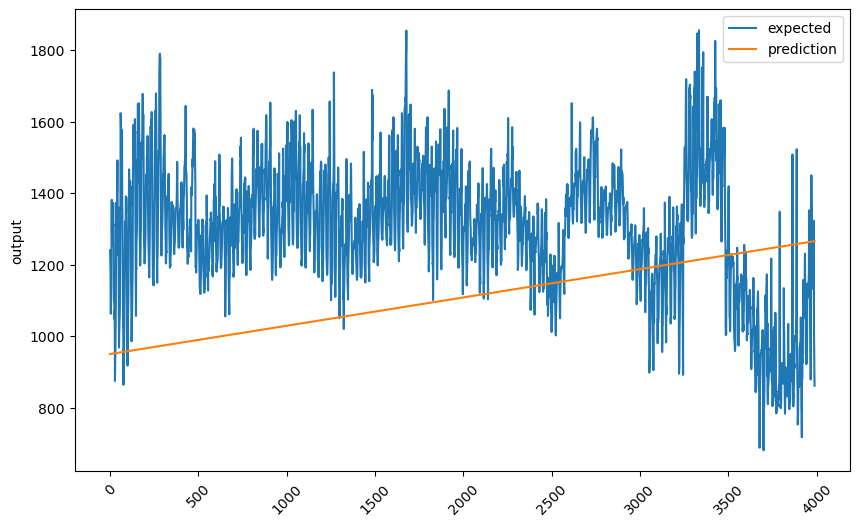

Last 300 values:


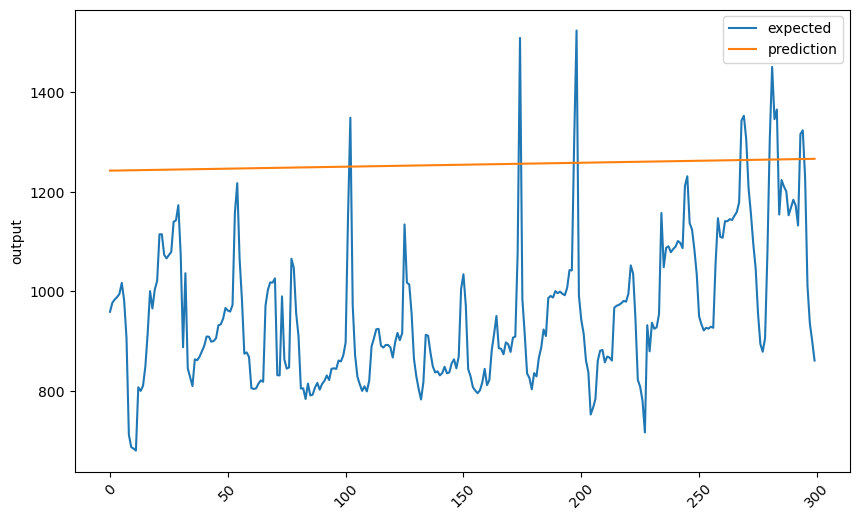

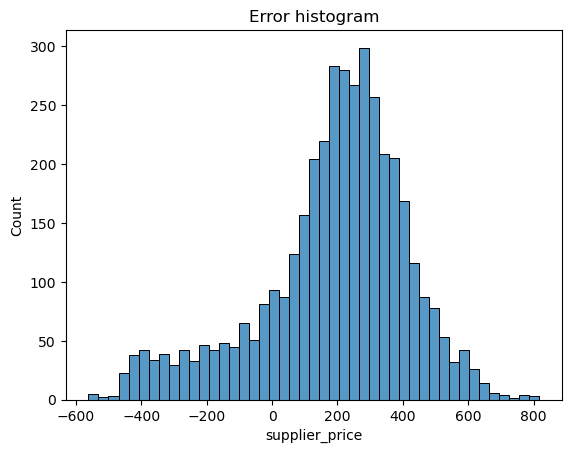

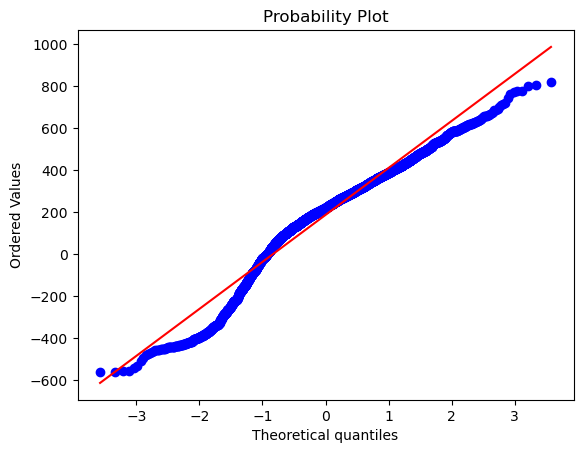

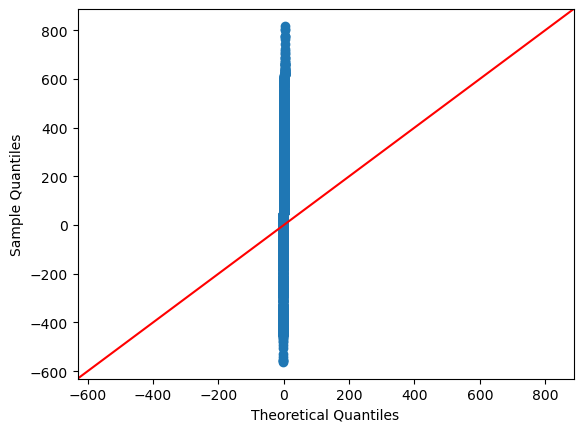

----------
Statistical test for normality of residuals:
----------

D'Agostino & Pearson:  NOT Normal
350.6806577923812

Jarque-Bera:           NOT Normal
452.3173403854416

Kolmogorov-Smirnov:    NOT Normal
0.09273461273477818

Lilliefors:            NOT Normal
0.09273461273477818

Shapiro-Wilk:          NOT Normal
0.9544594287872314

Anderson–Darling:      NOT Normal
61.03226163370937

Done!

----------------
Average model...
Fold #1...
Fold #2...
Fold #3...
Fold #4...
Fold #5...
Fold #6...
Fold #7...
Fold #8...
Fold #9...
Fold #10...


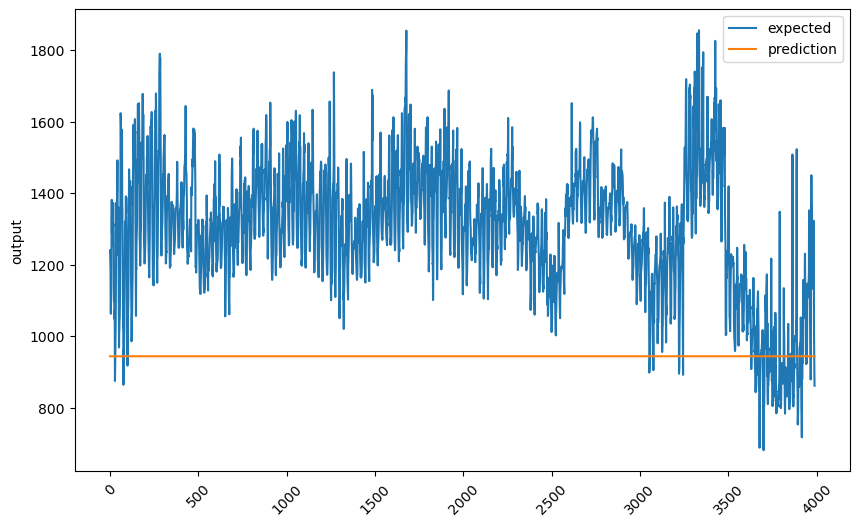

Last 300 values:


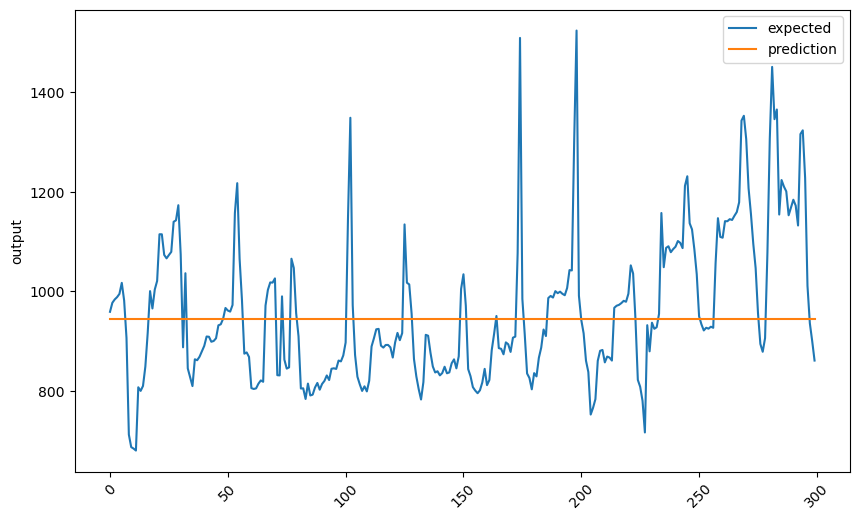

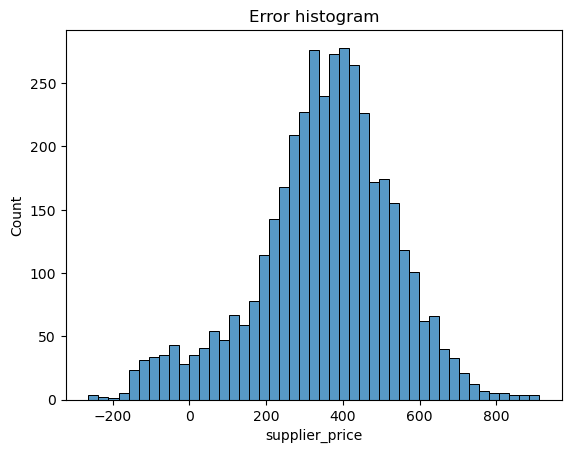

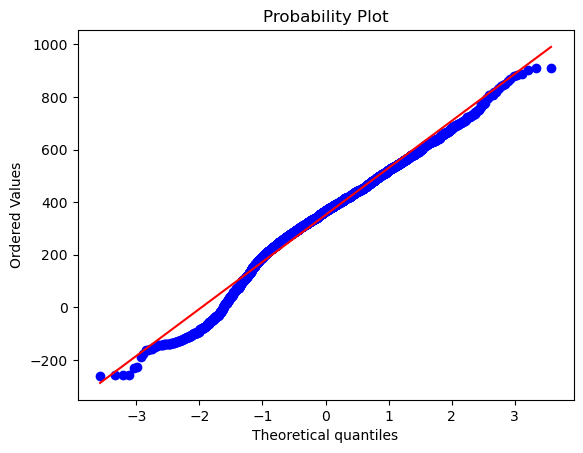

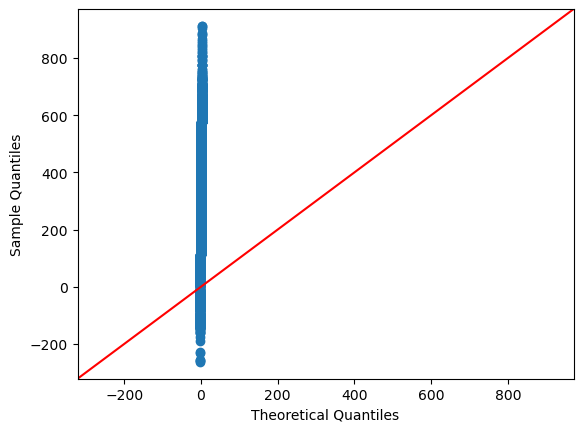

----------
Statistical test for normality of residuals:
----------

D'Agostino & Pearson:  NOT Normal
154.10422573371375

Jarque-Bera:           NOT Normal
178.8932490894559

Kolmogorov-Smirnov:    NOT Normal
0.05401860602165731

Lilliefors:            NOT Normal
0.05401860602165731

Shapiro-Wilk:          NOT Normal
0.9814963340759277

Anderson–Darling:      NOT Normal
22.4632843862546

Done!

----------------
LR model...
Fold #1...
Fold #2...
Fold #3...
Fold #4...
Fold #5...
Fold #6...
Fold #7...
Fold #8...
Fold #9...
Fold #10...


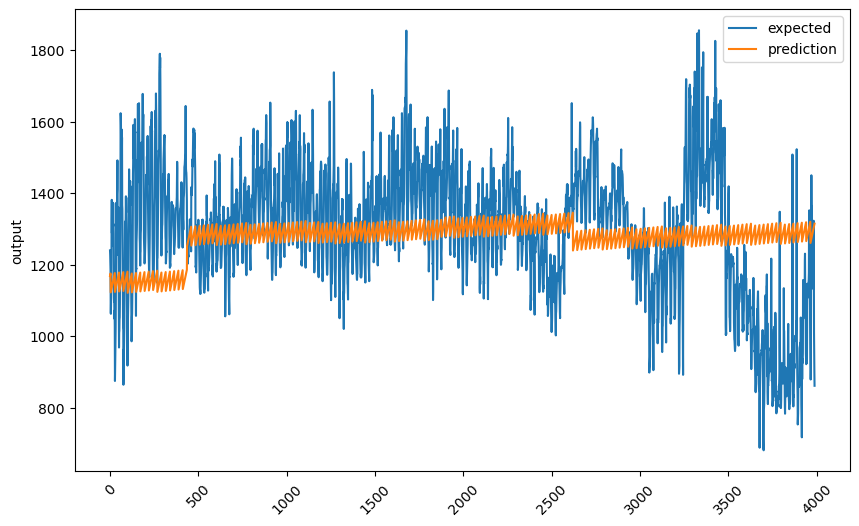

Last 300 values:


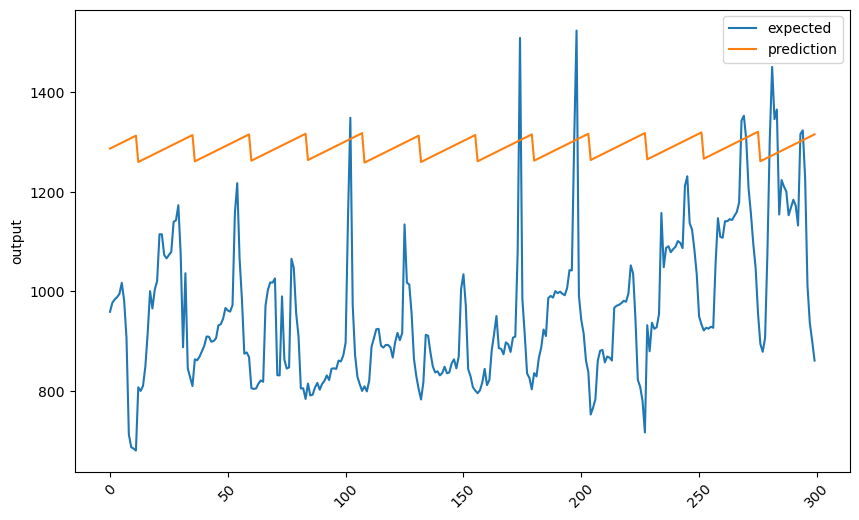

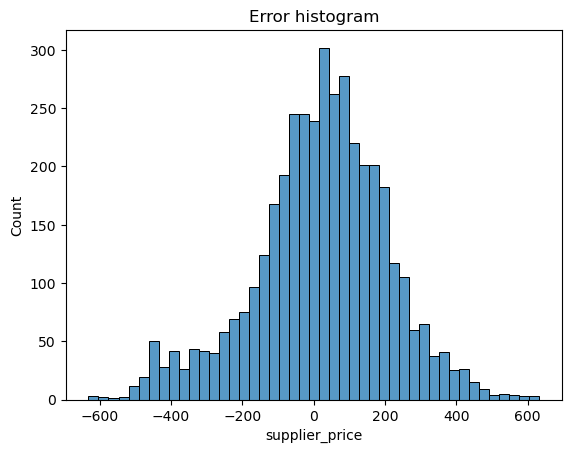

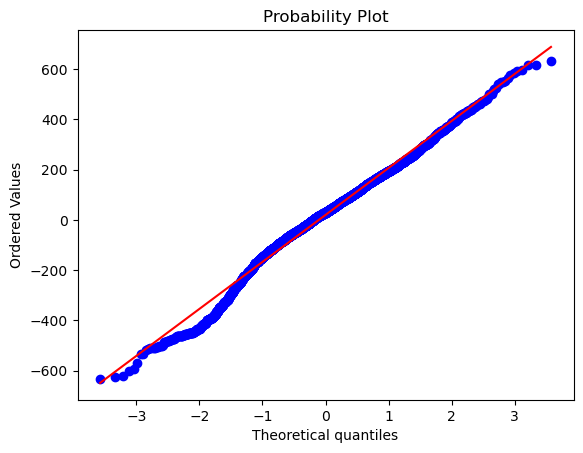

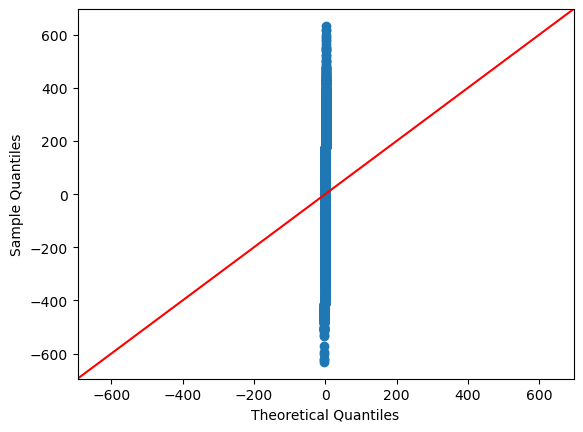

----------
Statistical test for normality of residuals:
----------

D'Agostino & Pearson:  NOT Normal
95.00715263431603

Jarque-Bera:           NOT Normal
109.76765778996398

Kolmogorov-Smirnov:    NOT Normal
0.045940424907237765

Lilliefors:            NOT Normal
0.045940424907237765

Shapiro-Wilk:          NOT Normal
0.9875595569610596

Anderson–Darling:      NOT Normal
15.395963971853234

Done!

----------------
Bayesian R. model...
Fold #1...
Fold #2...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expec

Fold #3...
Fold #4...
Fold #5...
Fold #6...
Fold #7...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expec

Fold #8...
Fold #9...
Fold #10...


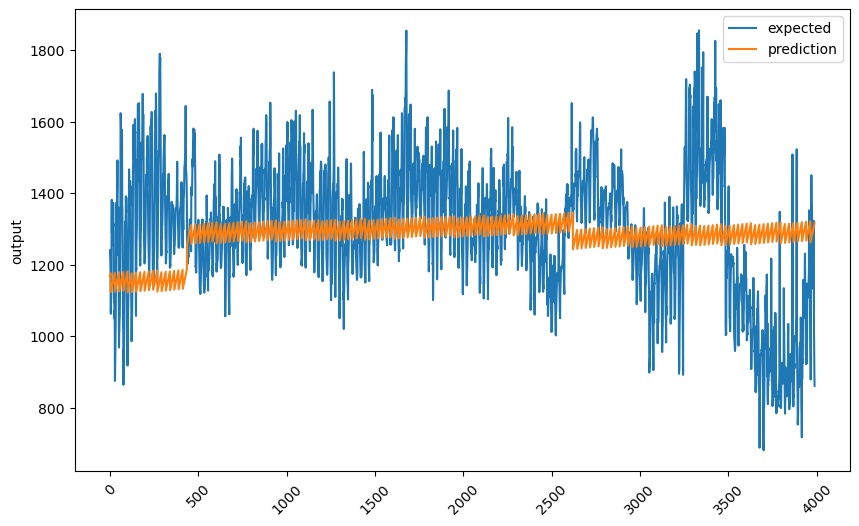

Last 300 values:


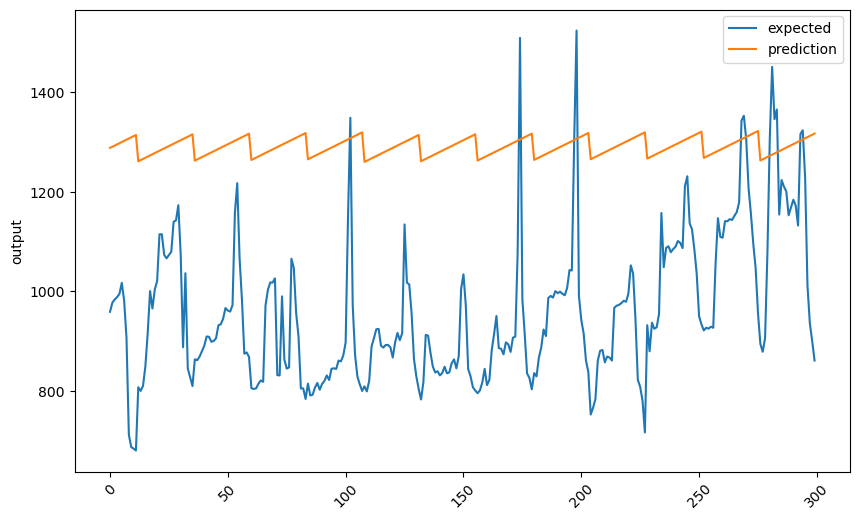

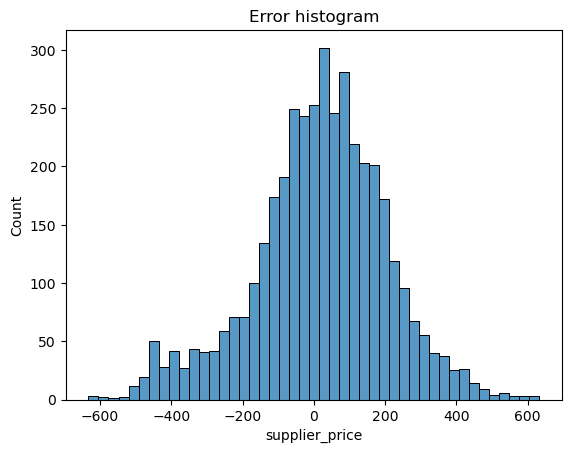

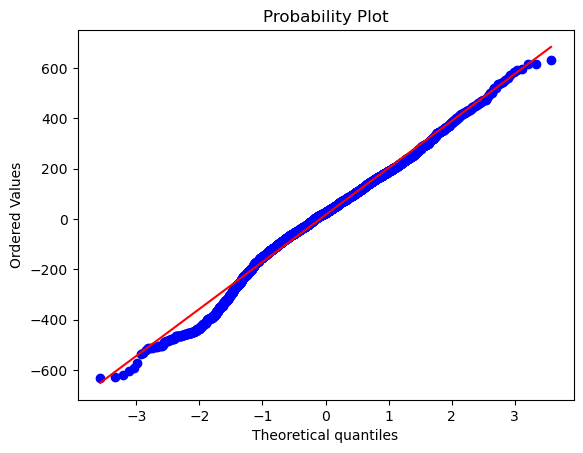

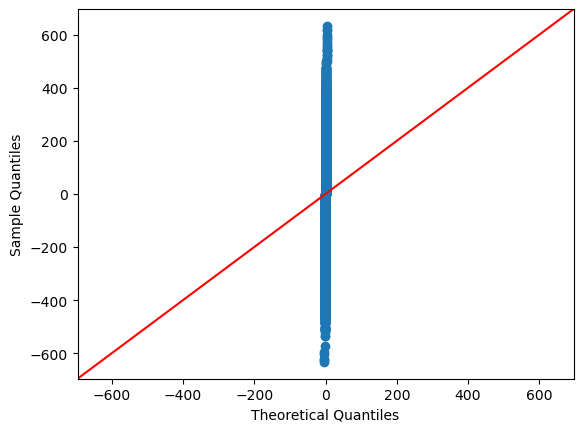

----------
Statistical test for normality of residuals:
----------

D'Agostino & Pearson:  NOT Normal
89.67197250269152

Jarque-Bera:           NOT Normal
103.94300335392201

Kolmogorov-Smirnov:    NOT Normal
0.044655823860305255

Lilliefors:            NOT Normal
0.044655823860305255

Shapiro-Wilk:          NOT Normal
0.9880505800247192

Anderson–Darling:      NOT Normal
14.794721110006776

Done!

----------------
PAR model...
Fold #1...
Fold #2...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Fold #3...
Fold #4...
Fold #5...
Fold #6...
Fold #7...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expec

Fold #8...
Fold #9...
Fold #10...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


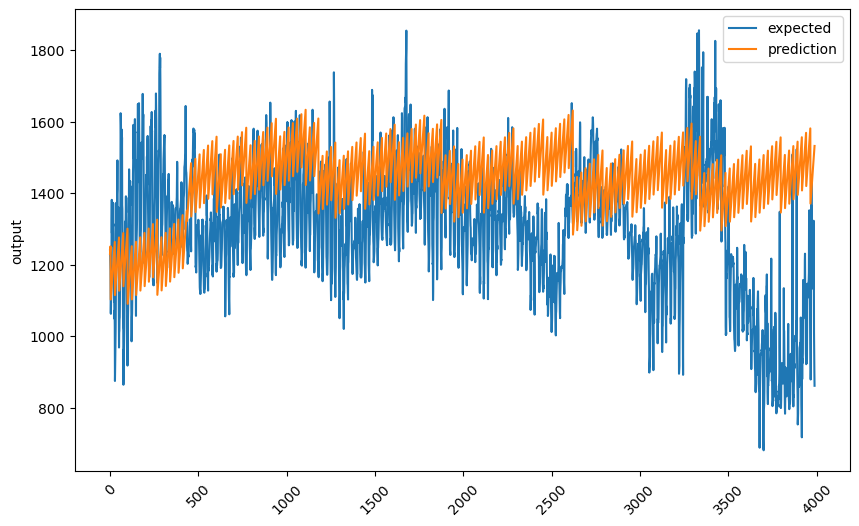

Last 300 values:


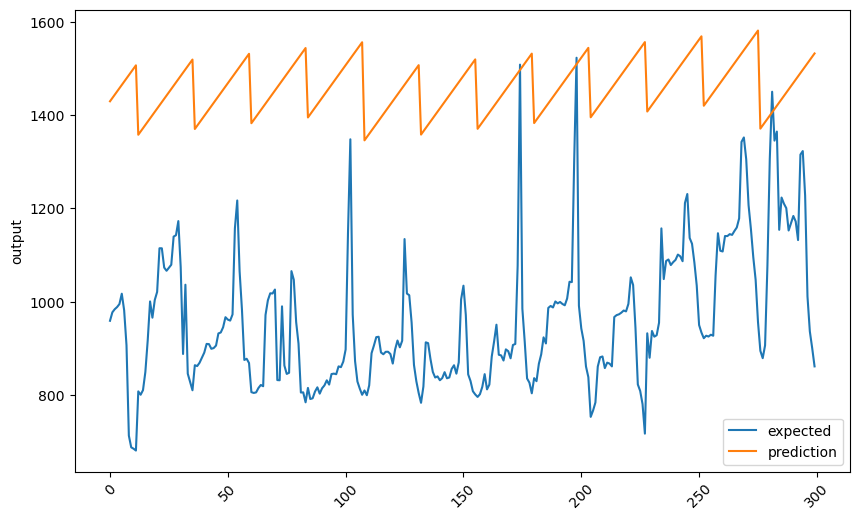

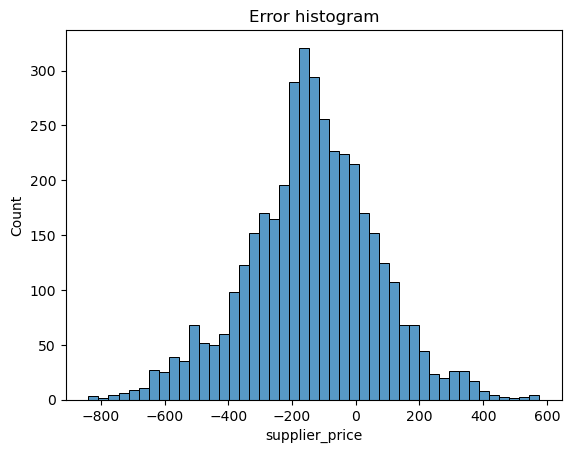

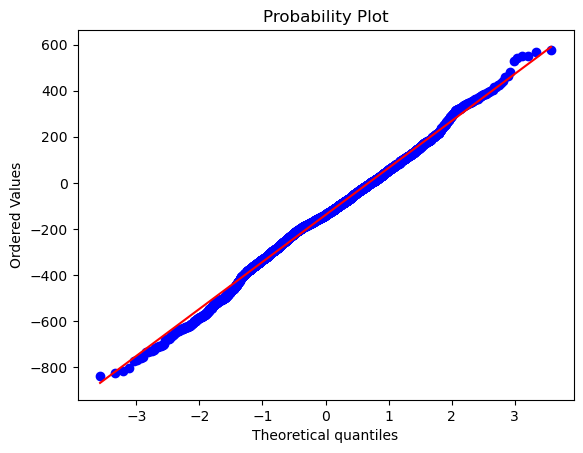

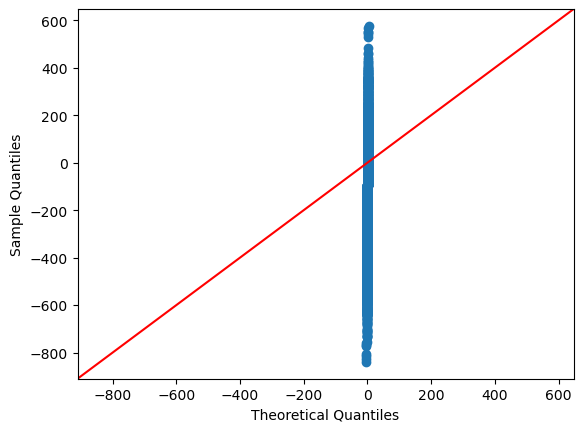

----------
Statistical test for normality of residuals:
----------

D'Agostino & Pearson:  NOT Normal
26.043715136345277

Jarque-Bera:           NOT Normal
32.43526127704193

Kolmogorov-Smirnov:    NOT Normal
0.0411063922705458

Lilliefors:            NOT Normal
0.0411063922705458

Shapiro-Wilk:          NOT Normal
0.9951308369636536

Anderson–Darling:      NOT Normal
6.9015543832838375

Done!

----------------
SGD model...
Fold #1...
Fold #2...
Fold #3...
Fold #4...
Fold #5...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expec

Fold #6...
Fold #7...
Fold #8...
Fold #9...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expec

Fold #10...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


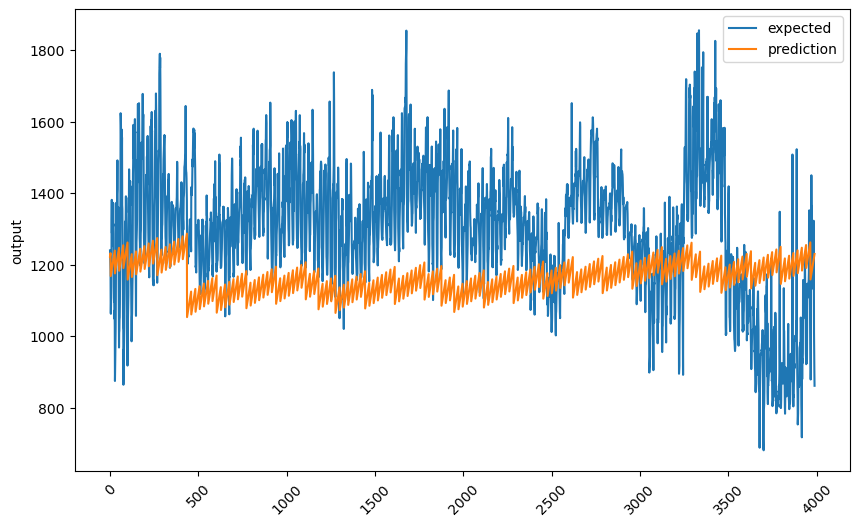

Last 300 values:


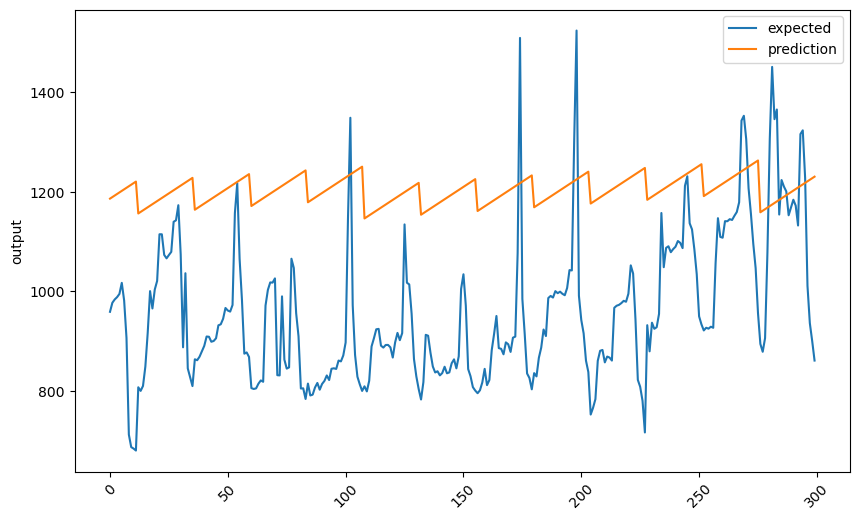

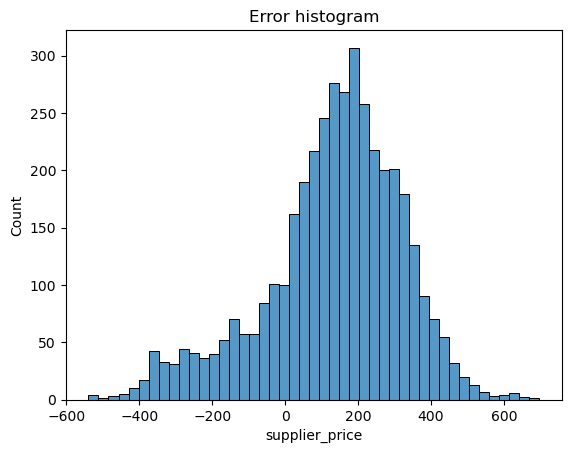

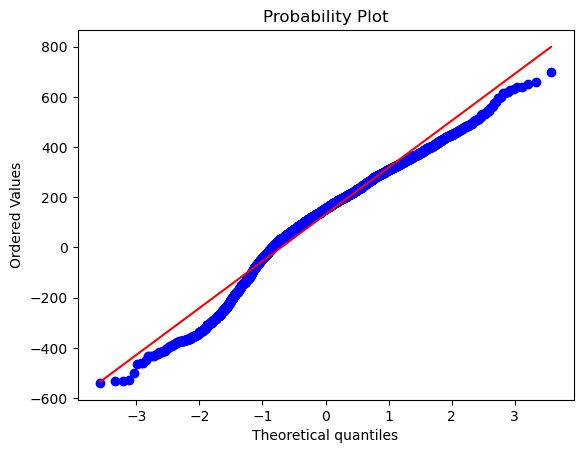

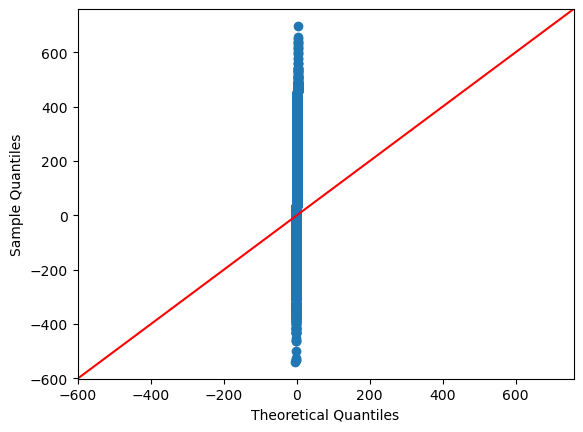

----------
Statistical test for normality of residuals:
----------

D'Agostino & Pearson:  NOT Normal
271.9182778411224

Jarque-Bera:           NOT Normal
332.2712120388441

Kolmogorov-Smirnov:    NOT Normal
0.06880578426540124

Lilliefors:            NOT Normal
0.06880578426540124

Shapiro-Wilk:          NOT Normal
0.9687983989715576

Anderson–Darling:      NOT Normal
38.54208053631646

Done!

----------------
SVR model...
Fold #1...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\svm\_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Fold #2...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\svm\_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Fold #3...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\svm\_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Fold #4...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\svm\_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Fold #5...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\svm\_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Fold #6...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\svm\_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Fold #7...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\svm\_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Fold #8...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\svm\_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Fold #9...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\svm\_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Fold #10...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\svm\_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


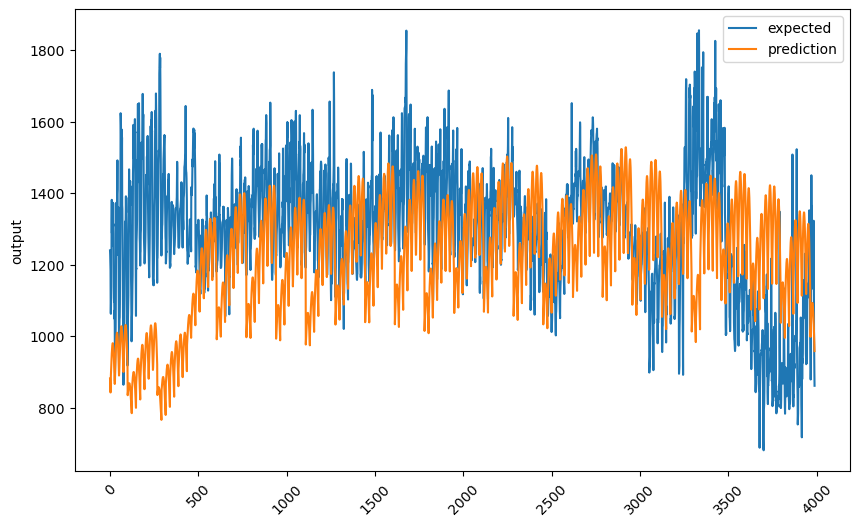

Last 300 values:


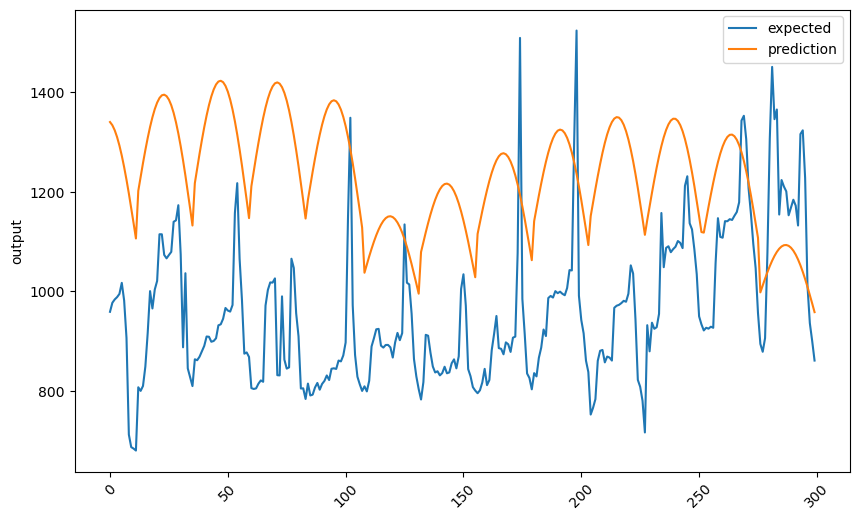

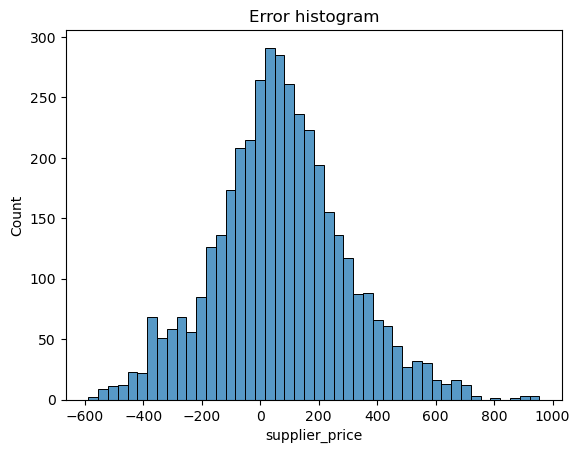

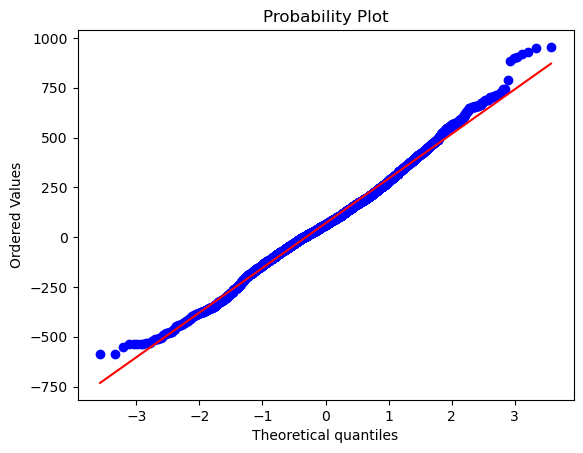

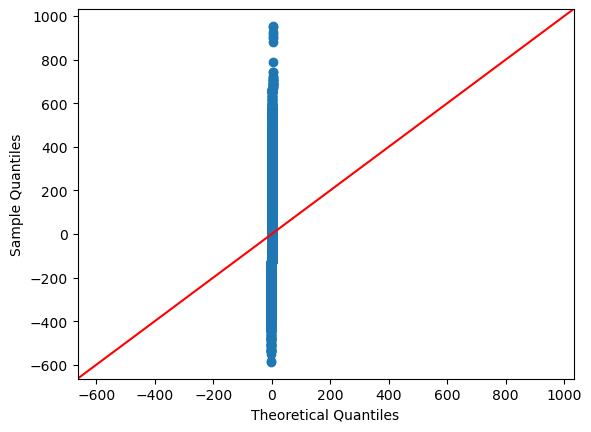

----------
Statistical test for normality of residuals:
----------

D'Agostino & Pearson:  NOT Normal
38.691232610464006

Jarque-Bera:           NOT Normal
46.23266573400373

Kolmogorov-Smirnov:    NOT Normal
0.03074203101840922

Lilliefors:            NOT Normal
0.03074203101840922

Shapiro-Wilk:          NOT Normal
0.994547426700592

Anderson–Darling:      NOT Normal
6.4911552347075485

Done!

----------------
Lin. SVR model...
Fold #1...
Fold #2...
Fold #3...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\svm\_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\svm\_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validat

Fold #4...
Fold #5...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\svm\_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\svm\_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validat

Fold #6...
Fold #7...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\svm\_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Fold #8...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\svm\_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Fold #9...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\svm\_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Fold #10...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\svm\_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


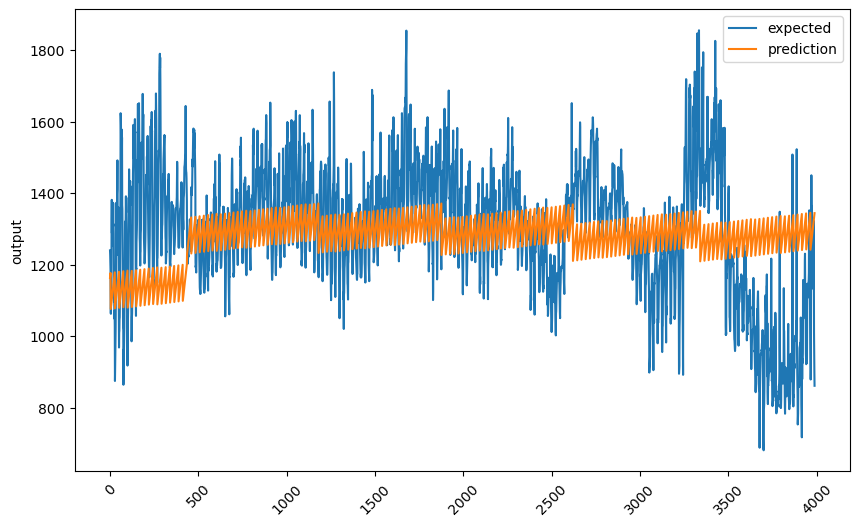

Last 300 values:


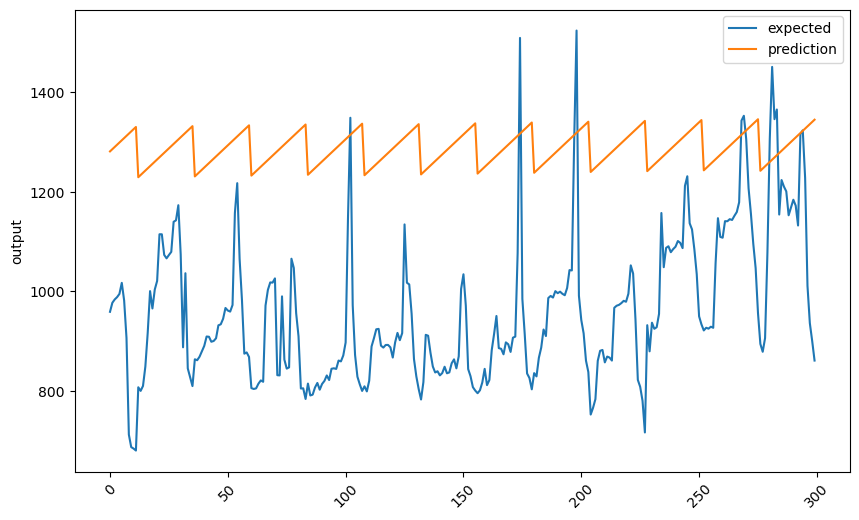

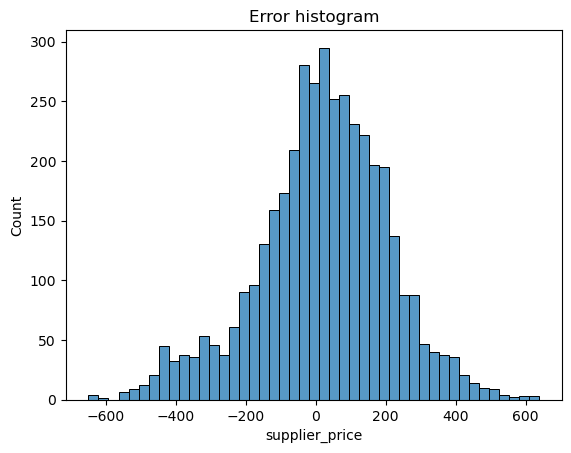

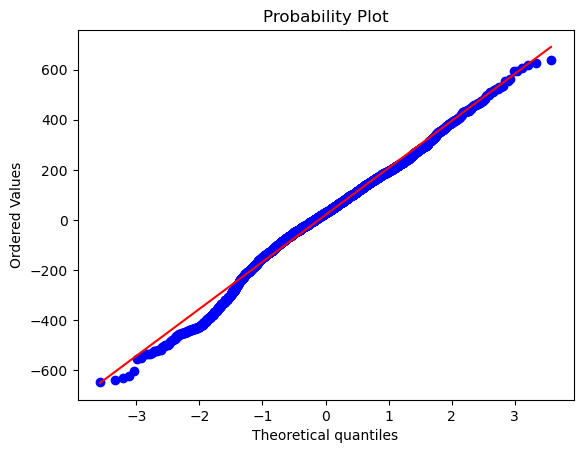

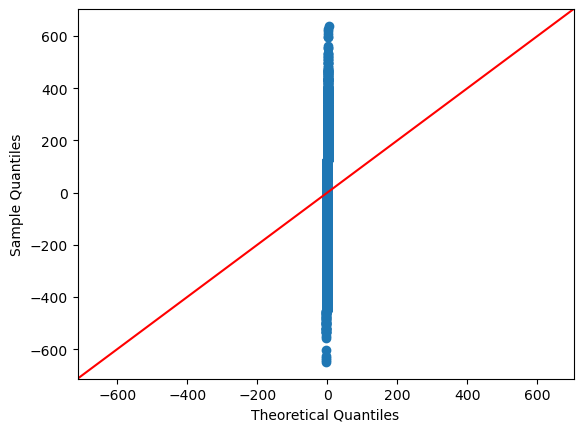

----------
Statistical test for normality of residuals:
----------

D'Agostino & Pearson:  NOT Normal
85.20853322941348

Jarque-Bera:           NOT Normal
98.08769997589016

Kolmogorov-Smirnov:    NOT Normal
0.04518548143412082

Lilliefors:            NOT Normal
0.04518548143412082

Shapiro-Wilk:          NOT Normal
0.9893669486045837

Anderson–Darling:      NOT Normal
13.271308657650934

Done!

----------------
KNN model...
Fold #1...
Fold #2...
Fold #3...
Fold #4...
Fold #5...
Fold #6...
Fold #7...
Fold #8...
Fold #9...
Fold #10...


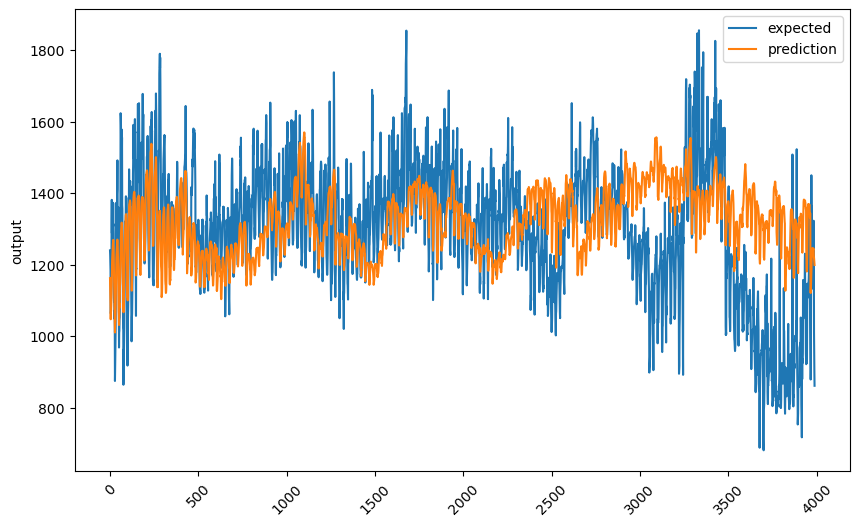

Last 300 values:


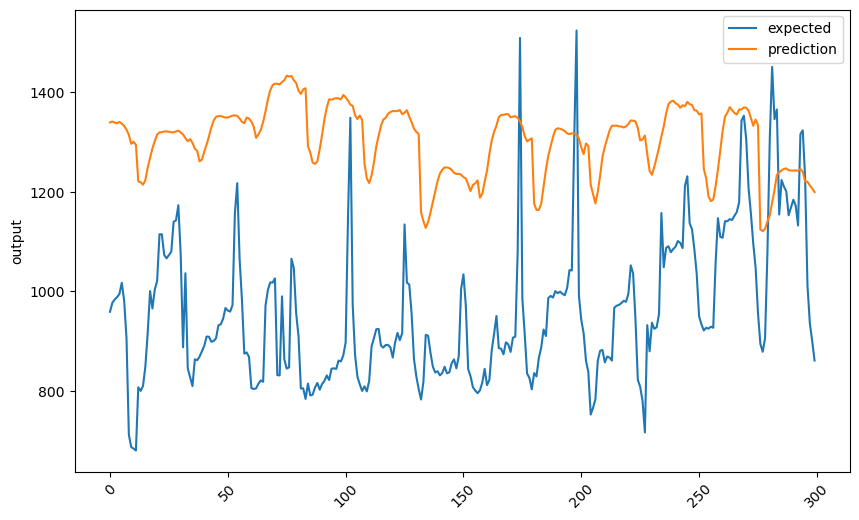

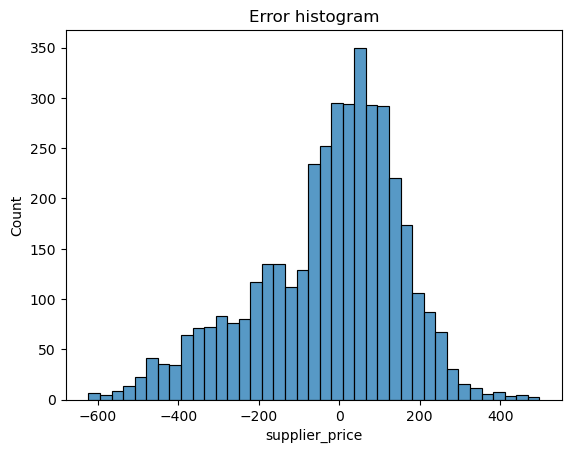

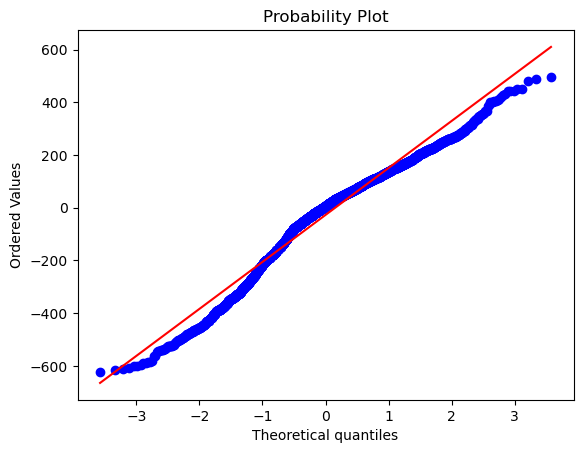

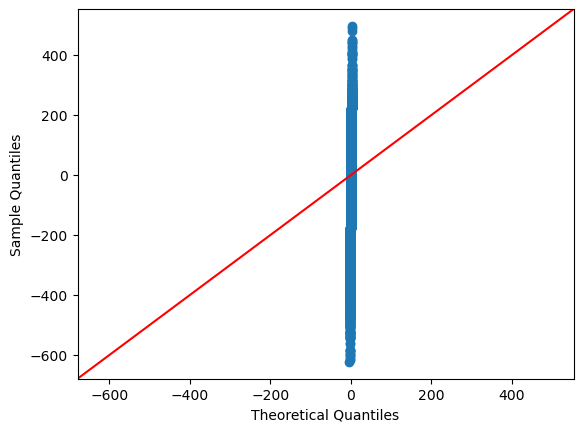

----------
Statistical test for normality of residuals:
----------

D'Agostino & Pearson:  NOT Normal
235.33882897991617

Jarque-Bera:           NOT Normal
277.2667174504648

Kolmogorov-Smirnov:    NOT Normal
0.08578236720593546

Lilliefors:            NOT Normal
0.08578236720593546

Shapiro-Wilk:          NOT Normal
0.9661367535591125

Anderson–Darling:      NOT Normal
50.321483268370685

Done!

----------------
CART model...
Fold #1...
Fold #2...
Fold #3...
Fold #4...
Fold #5...
Fold #6...
Fold #7...
Fold #8...
Fold #9...
Fold #10...


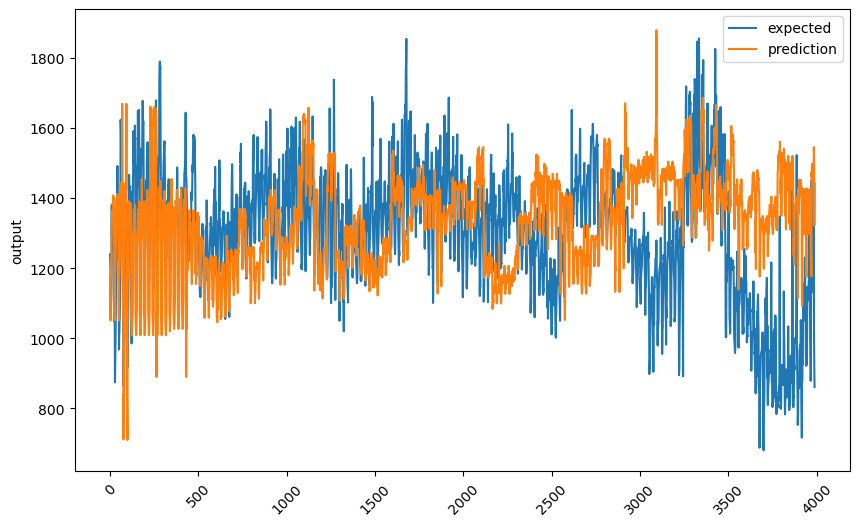

Last 300 values:


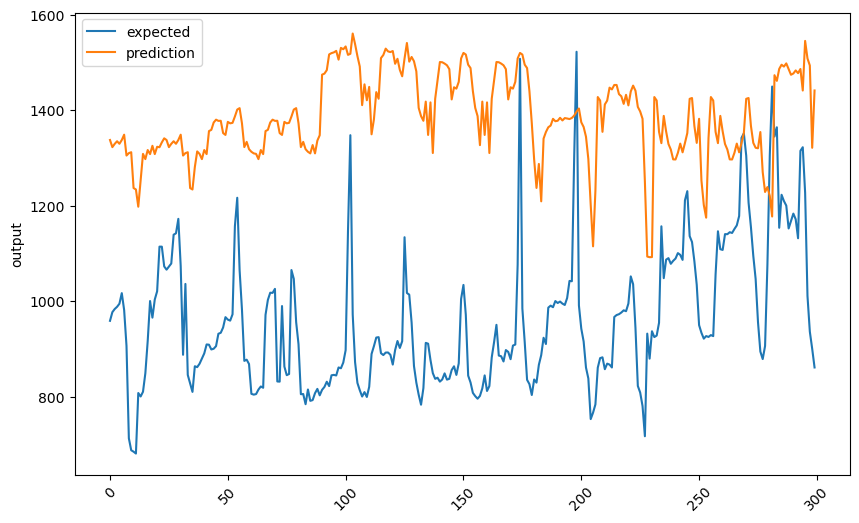

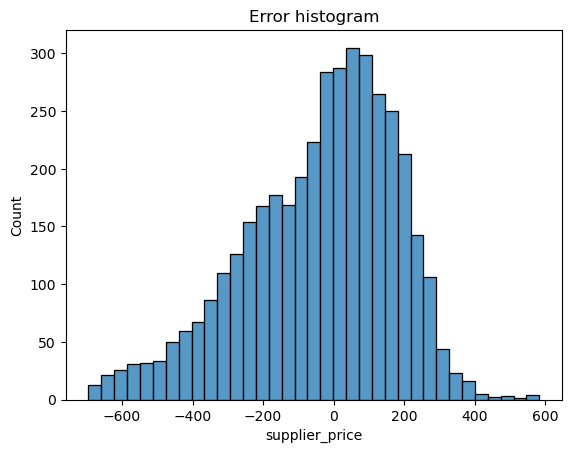

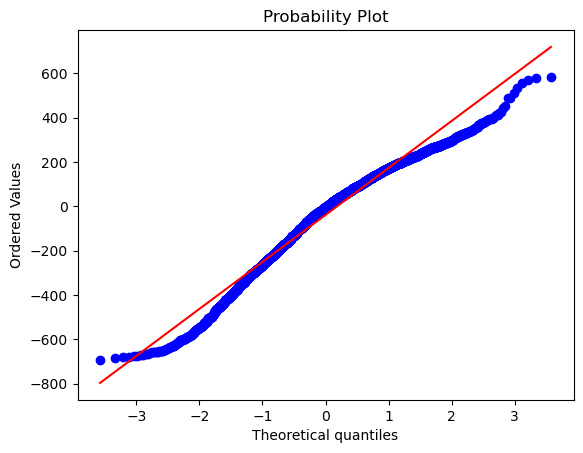

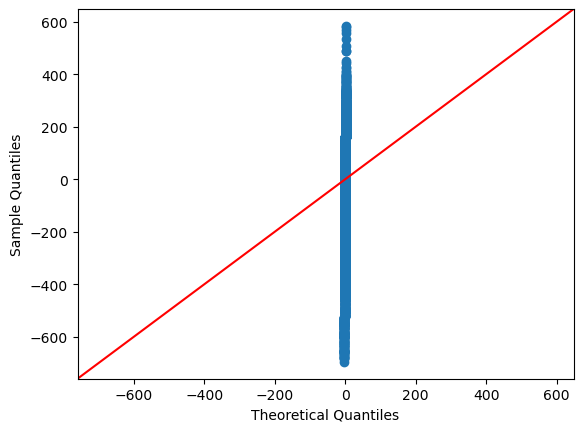

----------
Statistical test for normality of residuals:
----------

D'Agostino & Pearson:  NOT Normal
192.1421079419766

Jarque-Bera:           NOT Normal
220.46453008933847

Kolmogorov-Smirnov:    NOT Normal
0.06765676622581696

Lilliefors:            NOT Normal
0.06765676622581696

Shapiro-Wilk:          NOT Normal
0.9731842279434204

Anderson–Darling:      NOT Normal
32.458492798064526

Done!

----------------
RF model...
Fold #1...


C:\Users\dexp\AppData\Local\Temp\ipykernel_12640\3214319755.py:27: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(x_train, y_train)


Fold #2...


C:\Users\dexp\AppData\Local\Temp\ipykernel_12640\3214319755.py:27: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(x_train, y_train)


Fold #3...


C:\Users\dexp\AppData\Local\Temp\ipykernel_12640\3214319755.py:27: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(x_train, y_train)


Fold #4...


C:\Users\dexp\AppData\Local\Temp\ipykernel_12640\3214319755.py:27: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(x_train, y_train)


Fold #5...


C:\Users\dexp\AppData\Local\Temp\ipykernel_12640\3214319755.py:27: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(x_train, y_train)


Fold #6...


C:\Users\dexp\AppData\Local\Temp\ipykernel_12640\3214319755.py:27: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(x_train, y_train)


Fold #7...


C:\Users\dexp\AppData\Local\Temp\ipykernel_12640\3214319755.py:27: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(x_train, y_train)


Fold #8...


C:\Users\dexp\AppData\Local\Temp\ipykernel_12640\3214319755.py:27: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(x_train, y_train)


Fold #9...


C:\Users\dexp\AppData\Local\Temp\ipykernel_12640\3214319755.py:27: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(x_train, y_train)


Fold #10...


C:\Users\dexp\AppData\Local\Temp\ipykernel_12640\3214319755.py:27: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(x_train, y_train)


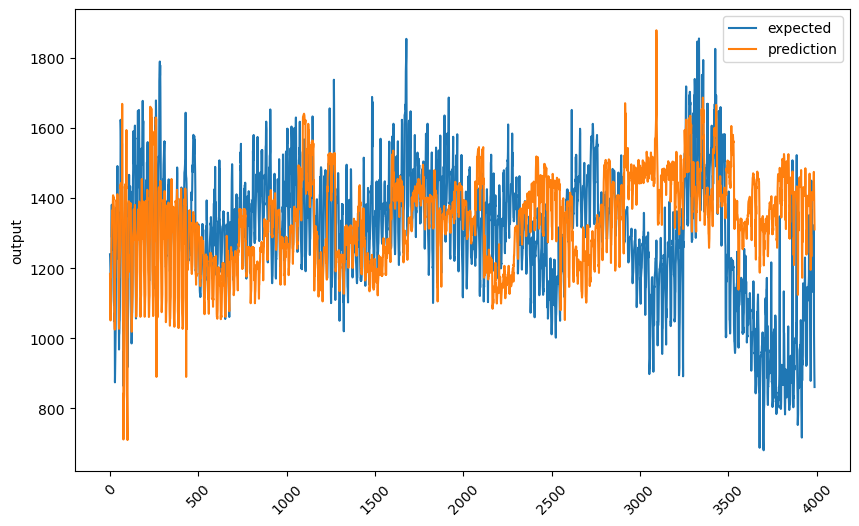

Last 300 values:


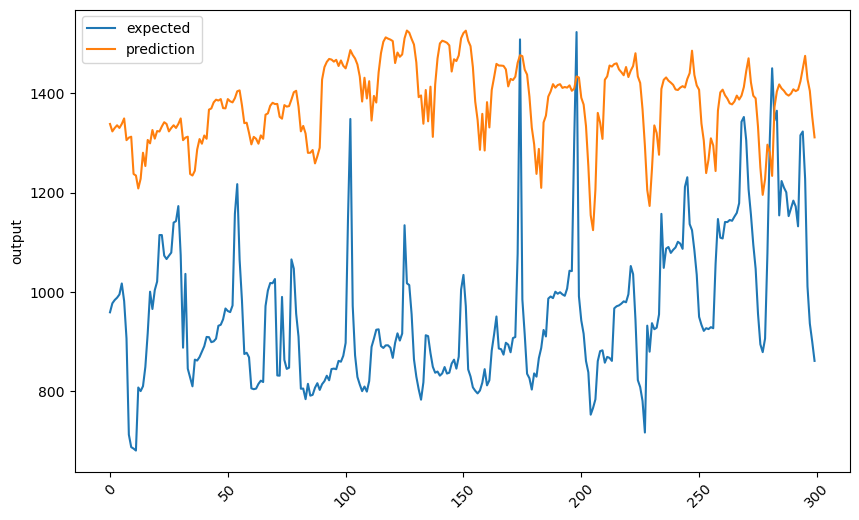

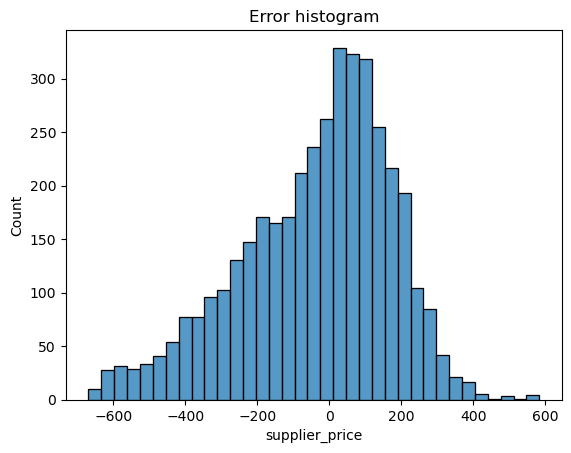

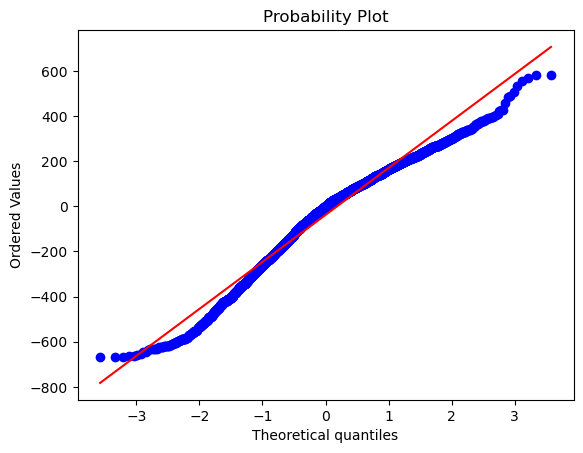

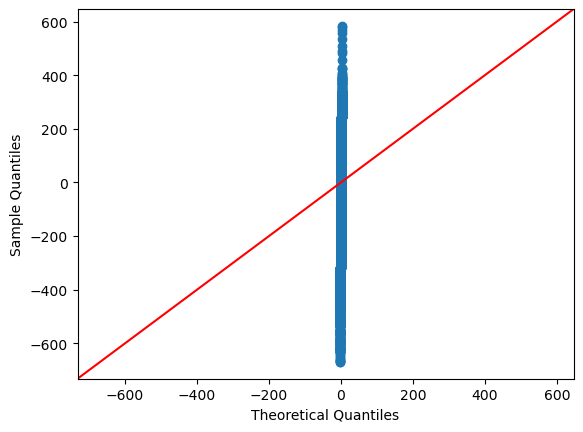

----------
Statistical test for normality of residuals:
----------

D'Agostino & Pearson:  NOT Normal
191.42335267137537

Jarque-Bera:           NOT Normal
219.52819281799185

Kolmogorov-Smirnov:    NOT Normal
0.07354990675401618

Lilliefors:            NOT Normal
0.07354990675401618

Shapiro-Wilk:          NOT Normal
0.9723649621009827

Anderson–Darling:      NOT Normal
36.559287593891895

Done!

----------------
RF w/Bootstrap model...
Fold #1...


C:\Users\dexp\AppData\Local\Temp\ipykernel_12640\3214319755.py:27: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(x_train, y_train)


Fold #2...


C:\Users\dexp\AppData\Local\Temp\ipykernel_12640\3214319755.py:27: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(x_train, y_train)


Fold #3...


C:\Users\dexp\AppData\Local\Temp\ipykernel_12640\3214319755.py:27: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(x_train, y_train)


Fold #4...


C:\Users\dexp\AppData\Local\Temp\ipykernel_12640\3214319755.py:27: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(x_train, y_train)


Fold #5...


C:\Users\dexp\AppData\Local\Temp\ipykernel_12640\3214319755.py:27: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(x_train, y_train)


Fold #6...


C:\Users\dexp\AppData\Local\Temp\ipykernel_12640\3214319755.py:27: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(x_train, y_train)


Fold #7...


C:\Users\dexp\AppData\Local\Temp\ipykernel_12640\3214319755.py:27: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(x_train, y_train)


Fold #8...


C:\Users\dexp\AppData\Local\Temp\ipykernel_12640\3214319755.py:27: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(x_train, y_train)


Fold #9...


C:\Users\dexp\AppData\Local\Temp\ipykernel_12640\3214319755.py:27: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(x_train, y_train)


Fold #10...


C:\Users\dexp\AppData\Local\Temp\ipykernel_12640\3214319755.py:27: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(x_train, y_train)


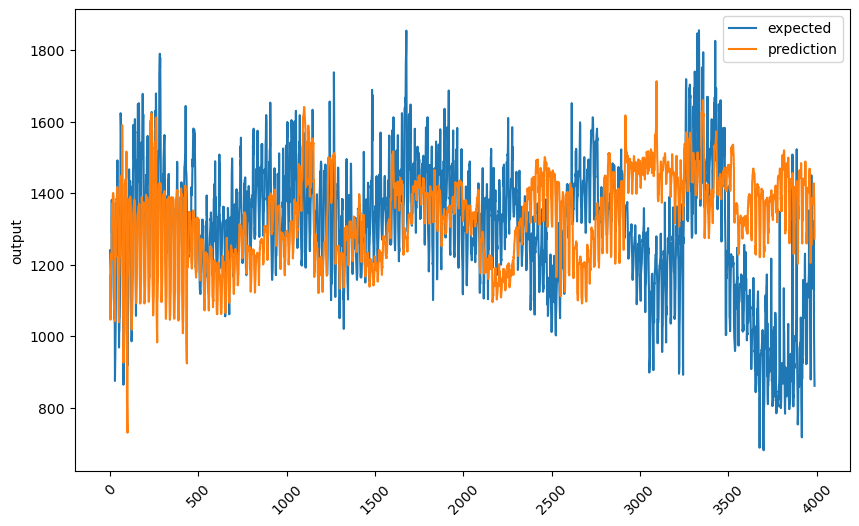

Last 300 values:


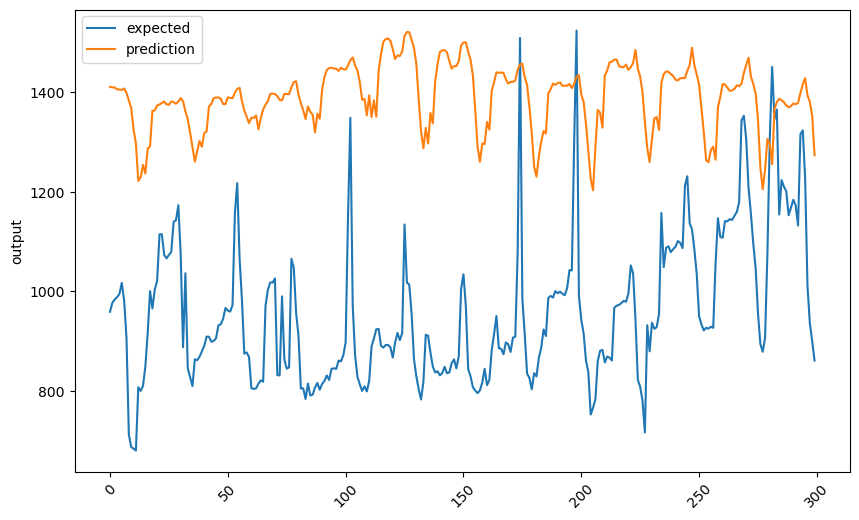

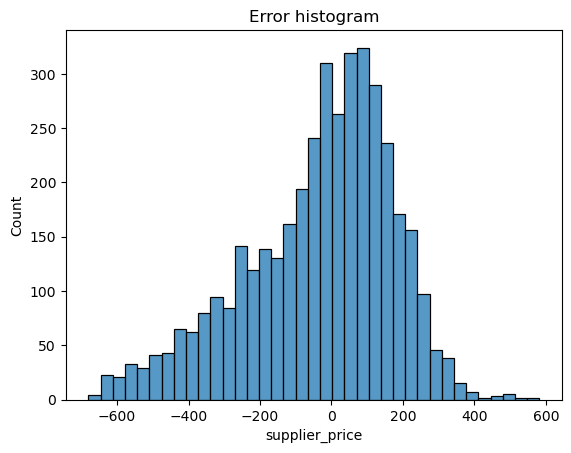

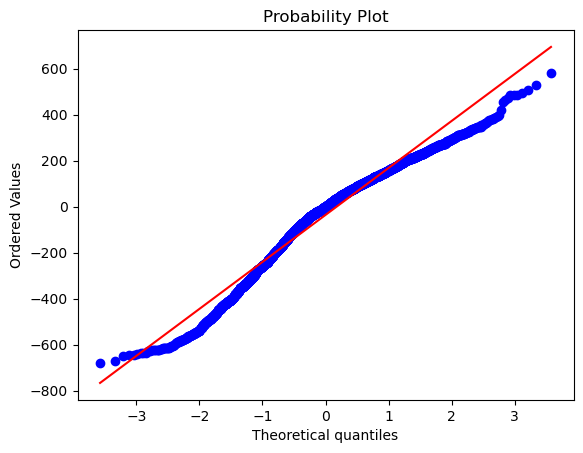

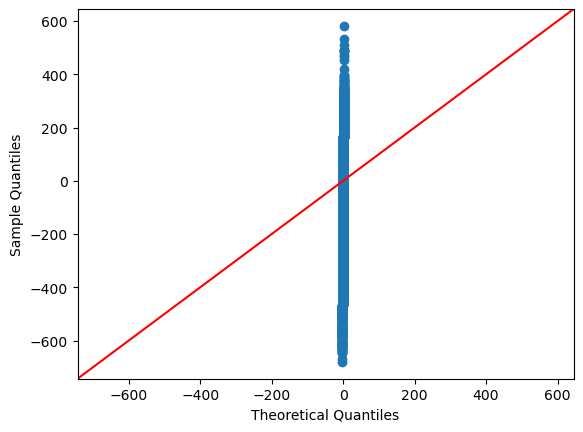

----------
Statistical test for normality of residuals:
----------

D'Agostino & Pearson:  NOT Normal
234.18131802090744

Jarque-Bera:           NOT Normal
276.7917911965893

Kolmogorov-Smirnov:    NOT Normal
0.08400002061881467

Lilliefors:            NOT Normal
0.08400002061881467

Shapiro-Wilk:          NOT Normal
0.9656808972358704

Anderson–Darling:      NOT Normal
46.17288032449687

Done!

----------------
XT model...
Fold #1...


C:\Users\dexp\AppData\Local\Temp\ipykernel_12640\3214319755.py:27: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(x_train, y_train)


Fold #2...


C:\Users\dexp\AppData\Local\Temp\ipykernel_12640\3214319755.py:27: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(x_train, y_train)


Fold #3...


C:\Users\dexp\AppData\Local\Temp\ipykernel_12640\3214319755.py:27: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(x_train, y_train)


Fold #4...


C:\Users\dexp\AppData\Local\Temp\ipykernel_12640\3214319755.py:27: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(x_train, y_train)


Fold #5...


C:\Users\dexp\AppData\Local\Temp\ipykernel_12640\3214319755.py:27: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(x_train, y_train)


Fold #6...


C:\Users\dexp\AppData\Local\Temp\ipykernel_12640\3214319755.py:27: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(x_train, y_train)


Fold #7...


C:\Users\dexp\AppData\Local\Temp\ipykernel_12640\3214319755.py:27: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(x_train, y_train)


Fold #8...


C:\Users\dexp\AppData\Local\Temp\ipykernel_12640\3214319755.py:27: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(x_train, y_train)


Fold #9...


C:\Users\dexp\AppData\Local\Temp\ipykernel_12640\3214319755.py:27: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(x_train, y_train)


Fold #10...


C:\Users\dexp\AppData\Local\Temp\ipykernel_12640\3214319755.py:27: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(x_train, y_train)


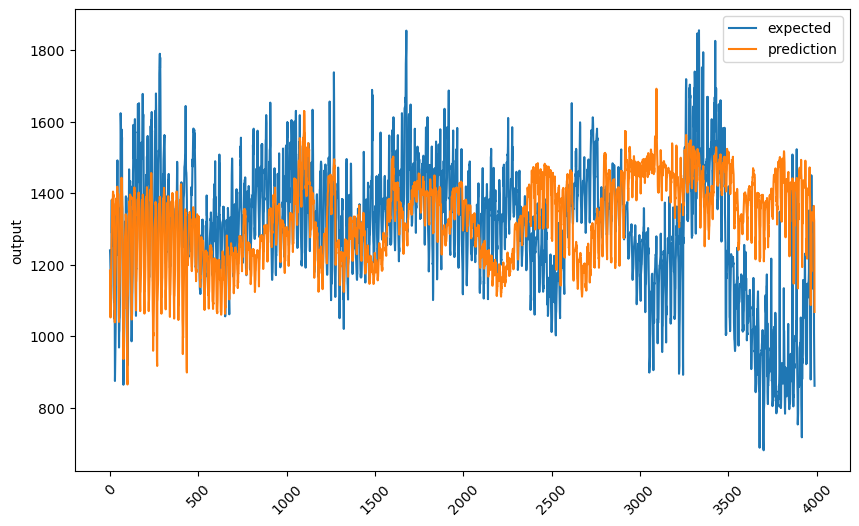

Last 300 values:


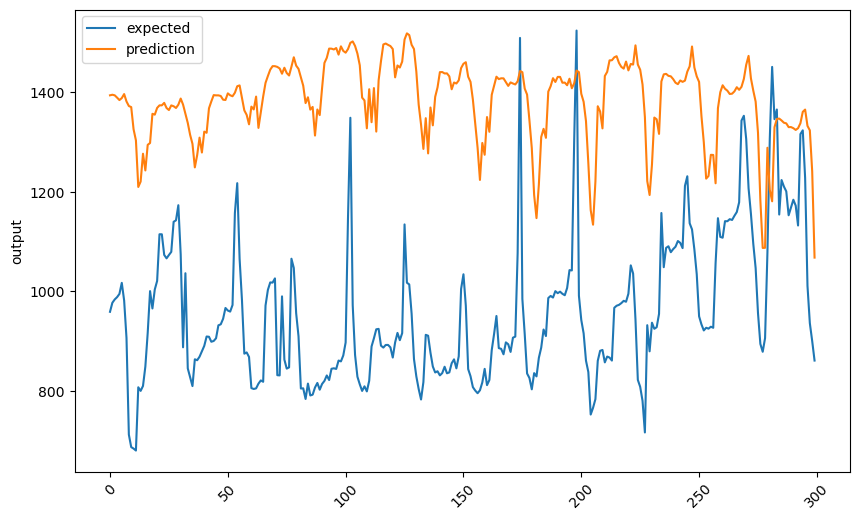

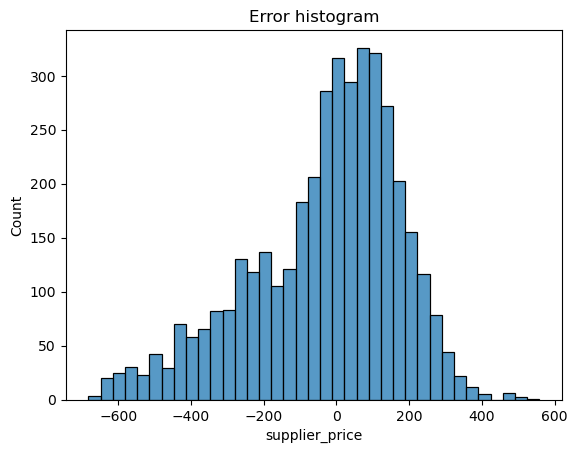

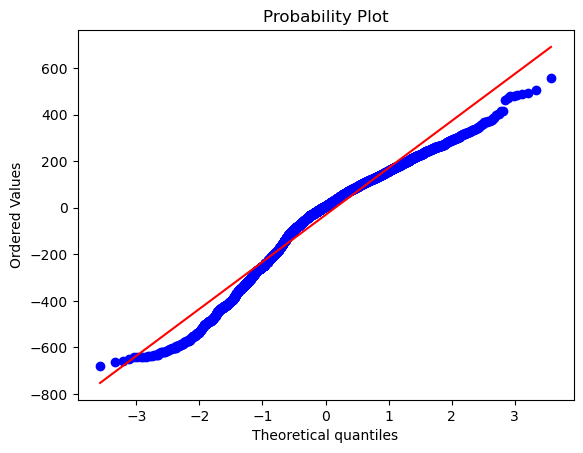

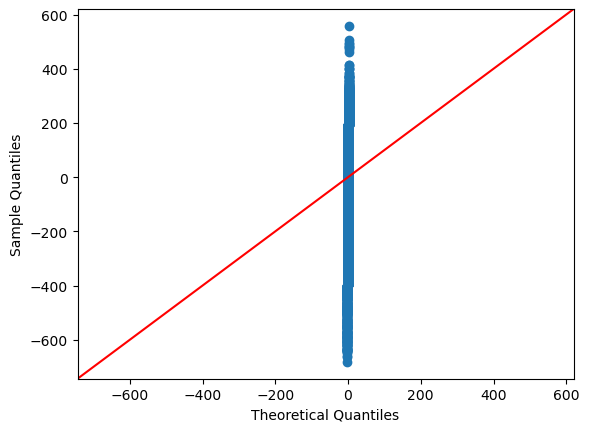

----------
Statistical test for normality of residuals:
----------

D'Agostino & Pearson:  NOT Normal
275.5130700570541

Jarque-Bera:           NOT Normal
334.2812077314762

Kolmogorov-Smirnov:    NOT Normal
0.09275745882696151

Lilliefors:            NOT Normal
0.09275745882696151

Shapiro-Wilk:          NOT Normal
0.9606080651283264

Anderson–Darling:      NOT Normal
53.64262500131463

Done!

----------------
XT w/Bootstrap model...
Fold #1...


C:\Users\dexp\AppData\Local\Temp\ipykernel_12640\3214319755.py:27: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(x_train, y_train)


Fold #2...


C:\Users\dexp\AppData\Local\Temp\ipykernel_12640\3214319755.py:27: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(x_train, y_train)


Fold #3...


C:\Users\dexp\AppData\Local\Temp\ipykernel_12640\3214319755.py:27: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(x_train, y_train)


Fold #4...


C:\Users\dexp\AppData\Local\Temp\ipykernel_12640\3214319755.py:27: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(x_train, y_train)


Fold #5...


C:\Users\dexp\AppData\Local\Temp\ipykernel_12640\3214319755.py:27: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(x_train, y_train)


Fold #6...


C:\Users\dexp\AppData\Local\Temp\ipykernel_12640\3214319755.py:27: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(x_train, y_train)


Fold #7...


C:\Users\dexp\AppData\Local\Temp\ipykernel_12640\3214319755.py:27: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(x_train, y_train)


Fold #8...


C:\Users\dexp\AppData\Local\Temp\ipykernel_12640\3214319755.py:27: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(x_train, y_train)


Fold #9...


C:\Users\dexp\AppData\Local\Temp\ipykernel_12640\3214319755.py:27: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(x_train, y_train)


Fold #10...


C:\Users\dexp\AppData\Local\Temp\ipykernel_12640\3214319755.py:27: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(x_train, y_train)


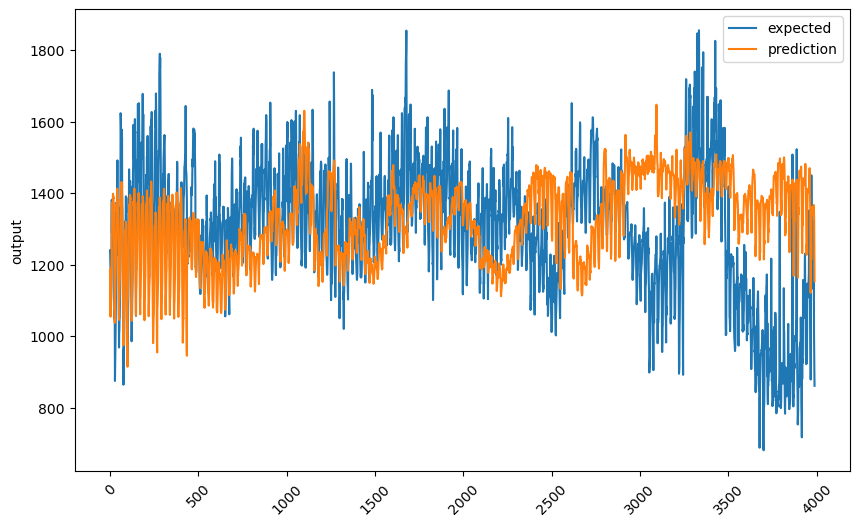

Last 300 values:


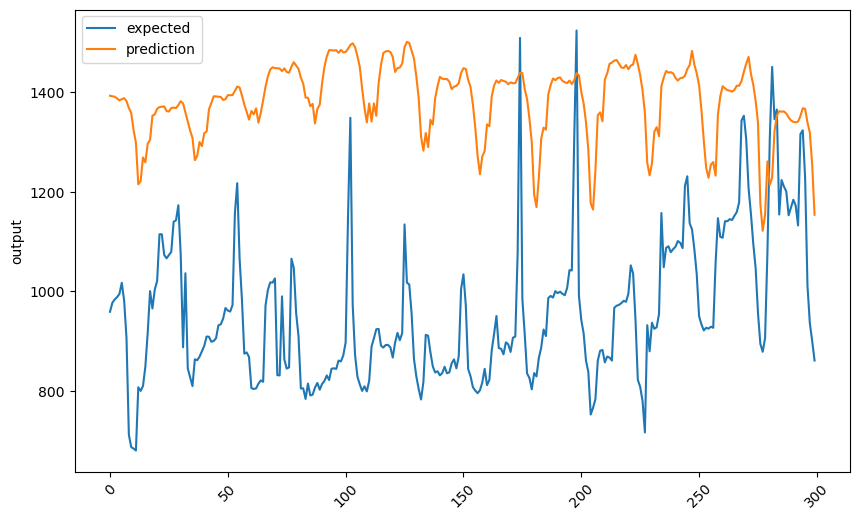

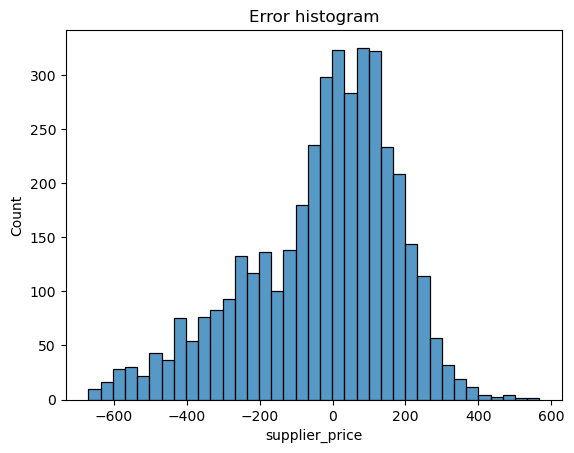

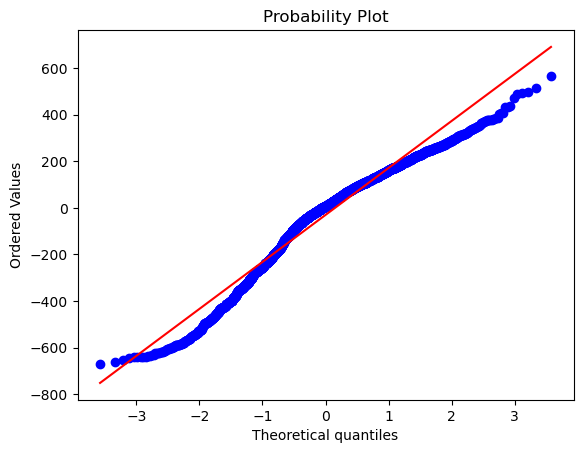

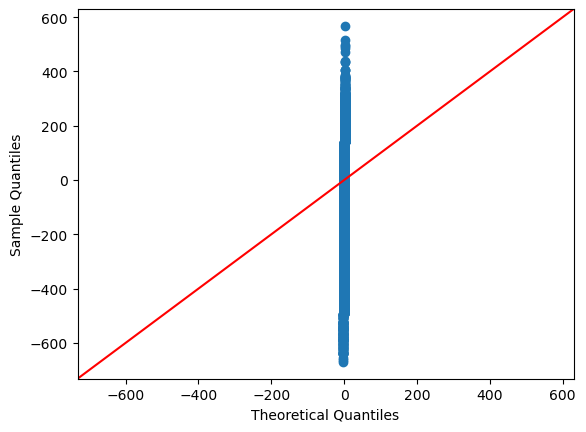

----------
Statistical test for normality of residuals:
----------

D'Agostino & Pearson:  NOT Normal
269.107396939687

Jarque-Bera:           NOT Normal
325.4309545403268

Kolmogorov-Smirnov:    NOT Normal
0.09172929292947957

Lilliefors:            NOT Normal
0.09172929292947957

Shapiro-Wilk:          NOT Normal
0.9607859253883362

Anderson–Darling:      NOT Normal
53.696872042469295

Done!

----------------
BAG model...
Fold #1...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\ensemble\_bagging.py:508: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return column_or_1d(y, warn=True)


Fold #2...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\ensemble\_bagging.py:508: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return column_or_1d(y, warn=True)


Fold #3...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\ensemble\_bagging.py:508: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return column_or_1d(y, warn=True)


Fold #4...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\ensemble\_bagging.py:508: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return column_or_1d(y, warn=True)


Fold #5...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\ensemble\_bagging.py:508: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return column_or_1d(y, warn=True)


Fold #6...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\ensemble\_bagging.py:508: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return column_or_1d(y, warn=True)


Fold #7...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\ensemble\_bagging.py:508: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return column_or_1d(y, warn=True)


Fold #8...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\ensemble\_bagging.py:508: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return column_or_1d(y, warn=True)


Fold #9...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\ensemble\_bagging.py:508: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return column_or_1d(y, warn=True)


Fold #10...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\ensemble\_bagging.py:508: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return column_or_1d(y, warn=True)


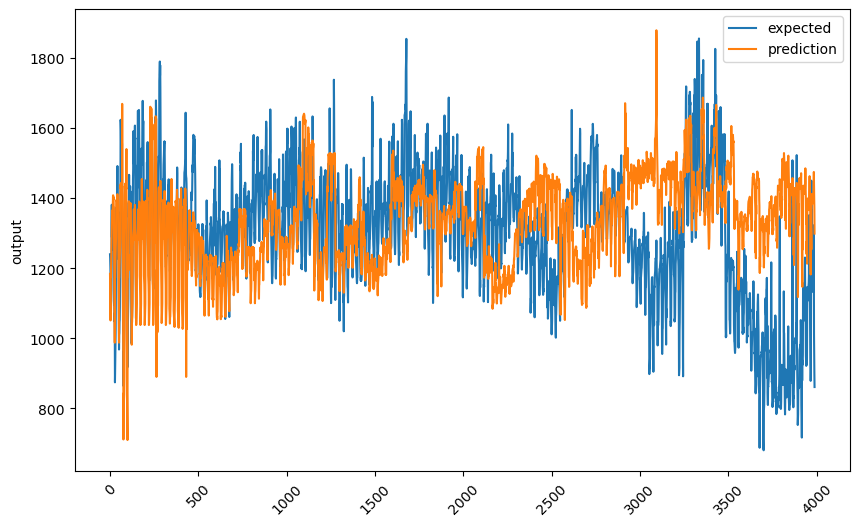

Last 300 values:


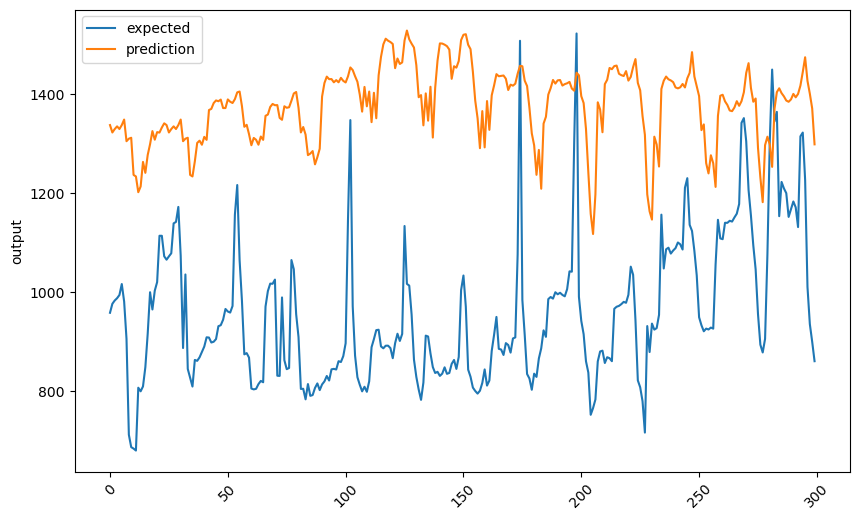

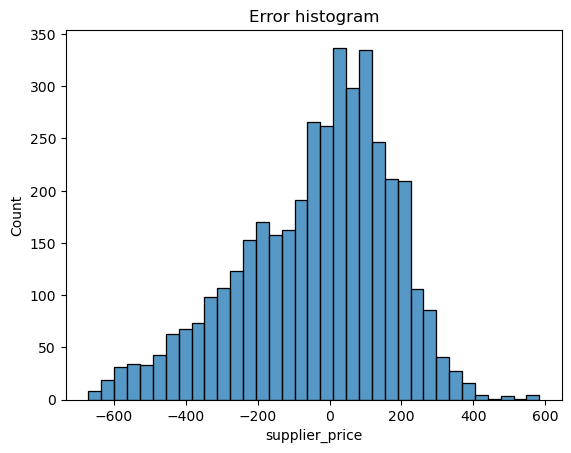

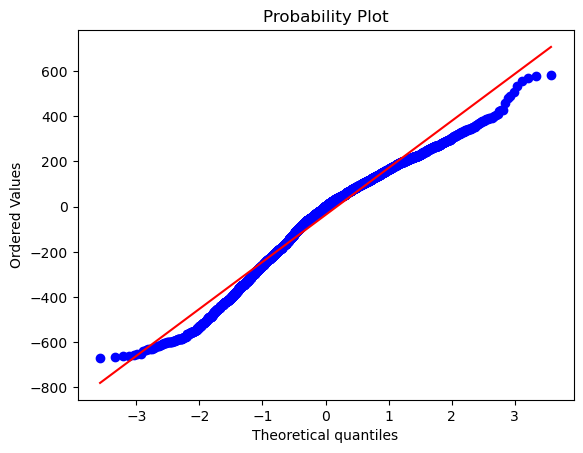

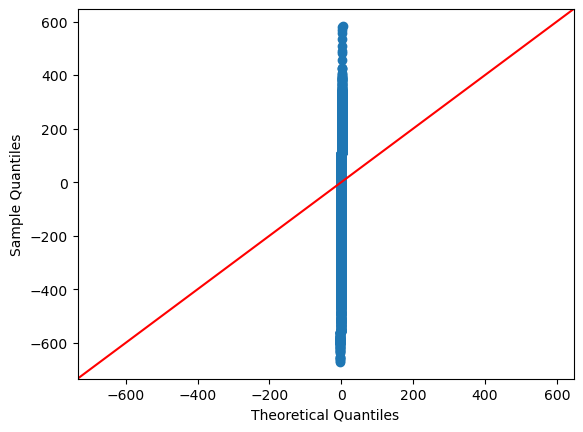

----------
Statistical test for normality of residuals:
----------

D'Agostino & Pearson:  NOT Normal
186.60603413939782

Jarque-Bera:           NOT Normal
213.15812793302175

Kolmogorov-Smirnov:    NOT Normal
0.07228946412583143

Lilliefors:            NOT Normal
0.07228946412583143

Shapiro-Wilk:          NOT Normal
0.9724182486534119

Anderson–Darling:      NOT Normal
36.87765753246822

Done!

----------------
BAG w/Bootstrap model...
Fold #1...
Fold #2...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\ensemble\_bagging.py:508: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return column_or_1d(y, warn=True)
C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\ensemble\_bagging.py:508: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return column_or_1d(y, warn=True)


Fold #3...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\ensemble\_bagging.py:508: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return column_or_1d(y, warn=True)


Fold #4...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\ensemble\_bagging.py:508: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return column_or_1d(y, warn=True)


Fold #5...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\ensemble\_bagging.py:508: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return column_or_1d(y, warn=True)


Fold #6...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\ensemble\_bagging.py:508: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return column_or_1d(y, warn=True)


Fold #7...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\ensemble\_bagging.py:508: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return column_or_1d(y, warn=True)


Fold #8...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\ensemble\_bagging.py:508: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return column_or_1d(y, warn=True)


Fold #9...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\ensemble\_bagging.py:508: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return column_or_1d(y, warn=True)


Fold #10...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\ensemble\_bagging.py:508: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return column_or_1d(y, warn=True)


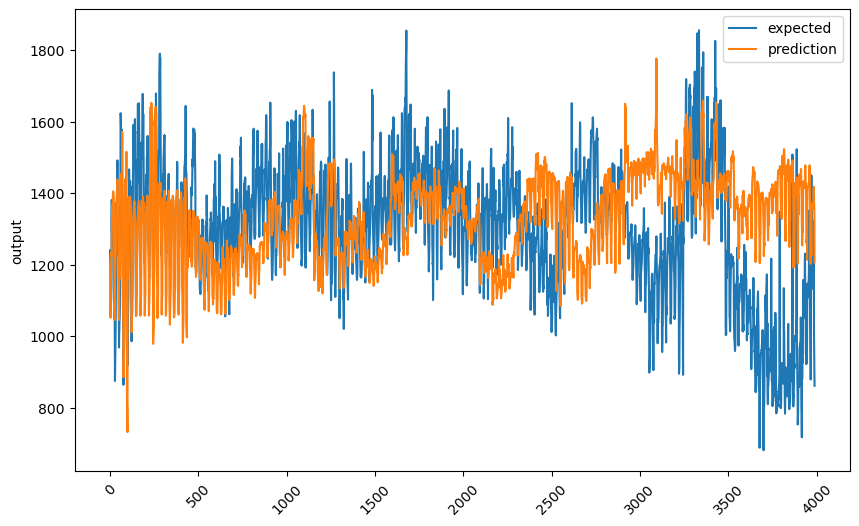

Last 300 values:


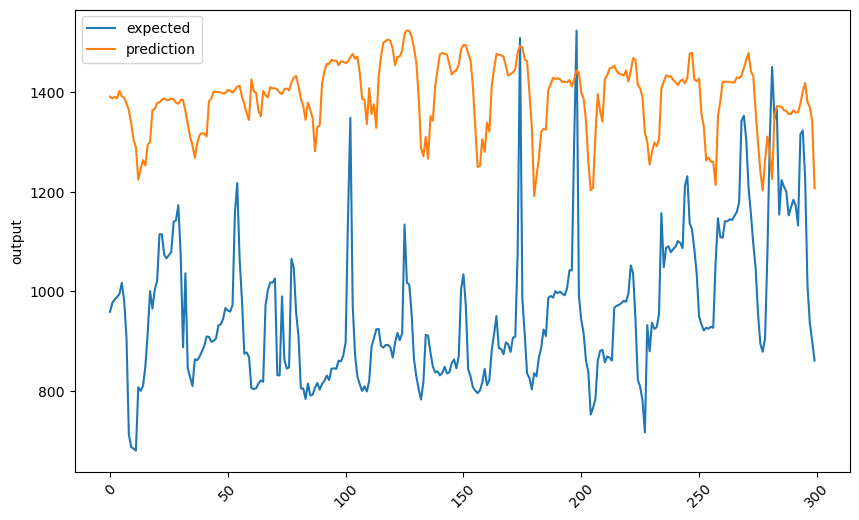

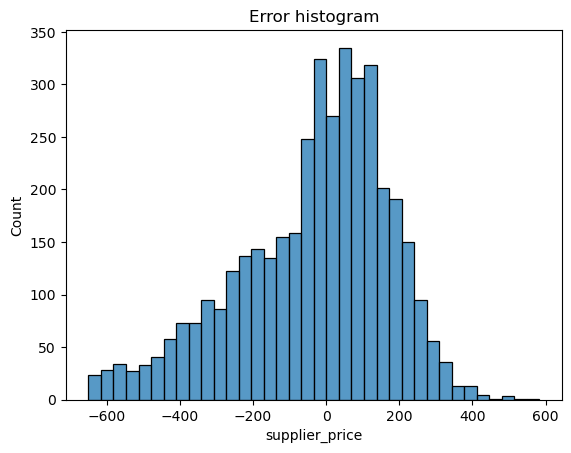

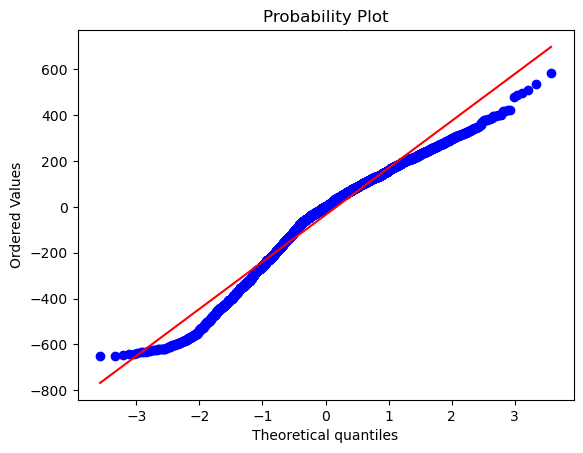

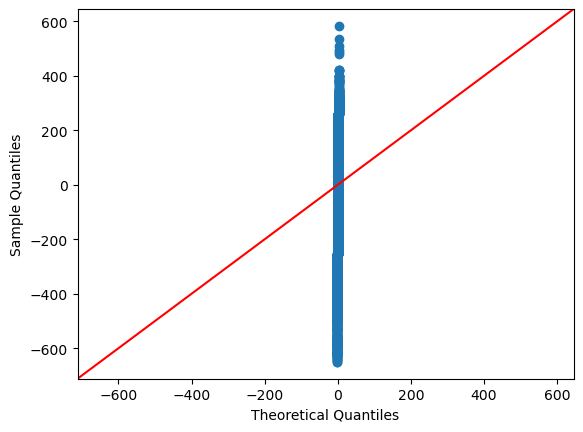

----------
Statistical test for normality of residuals:
----------

D'Agostino & Pearson:  NOT Normal
238.36880172074703

Jarque-Bera:           NOT Normal
282.46843989652695

Kolmogorov-Smirnov:    NOT Normal
0.08609378980035037

Lilliefors:            NOT Normal
0.08609378980035037

Shapiro-Wilk:          NOT Normal
0.9654147624969482

Anderson–Darling:      NOT Normal
46.02145553243372

Done!

----------------
ADA model...
Fold #1...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Fold #2...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Fold #3...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Fold #4...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Fold #5...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Fold #6...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Fold #7...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Fold #8...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Fold #9...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Fold #10...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


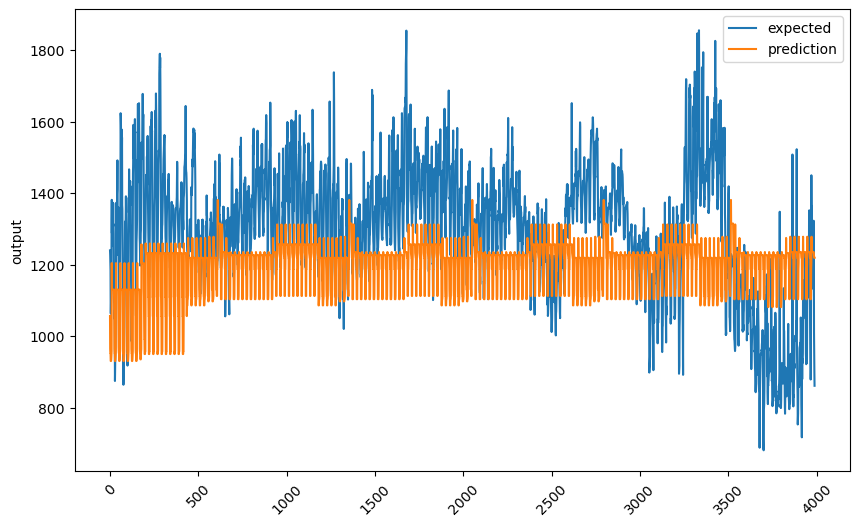

Last 300 values:


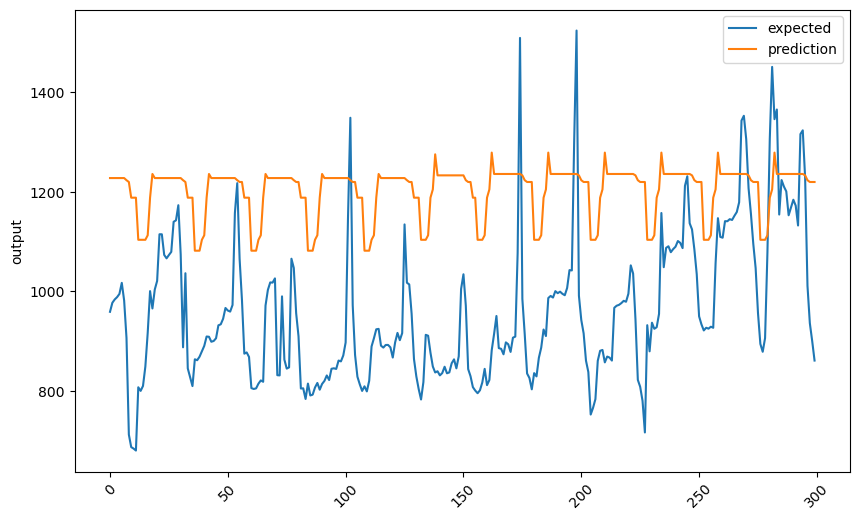

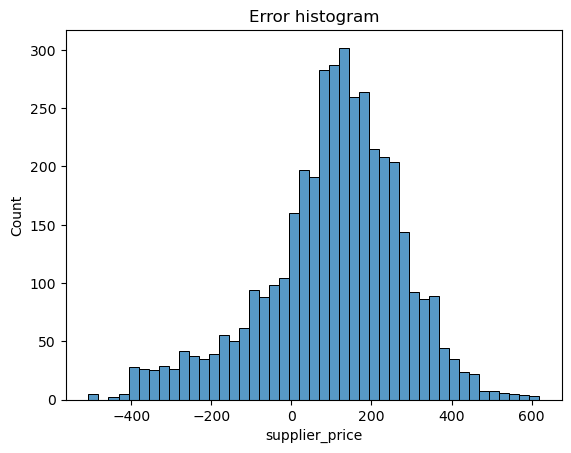

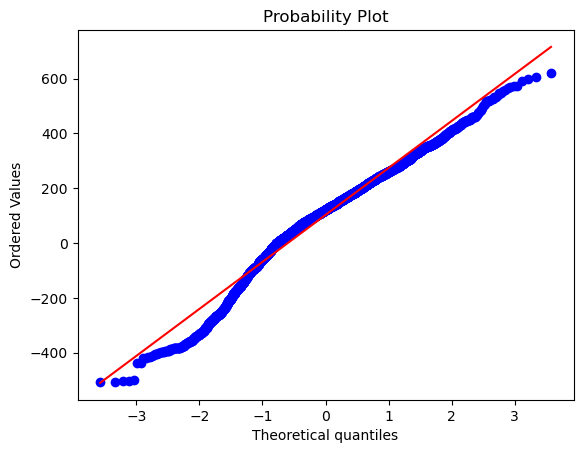

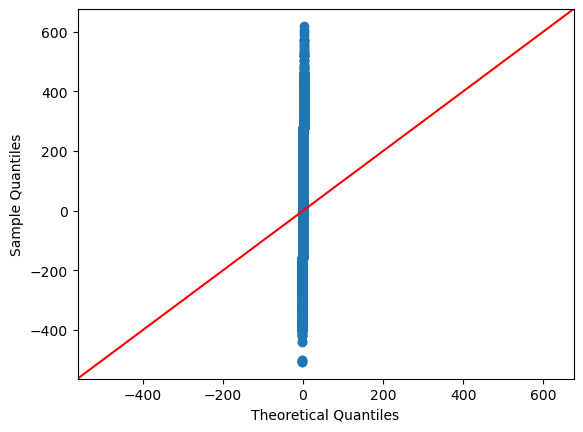

----------
Statistical test for normality of residuals:
----------

D'Agostino & Pearson:  NOT Normal
243.46527649928979

Jarque-Bera:           NOT Normal
299.4632374008406

Kolmogorov-Smirnov:    NOT Normal
0.07320577043615689

Lilliefors:            NOT Normal
0.07320577043615689

Shapiro-Wilk:          NOT Normal
0.9733683466911316

Anderson–Darling:      NOT Normal
33.5725328396984

Done!

----------------
HGBoost model...
Fold #1...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Fold #2...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Fold #3...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Fold #4...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Fold #5...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Fold #6...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Fold #7...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Fold #8...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Fold #9...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Fold #10...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


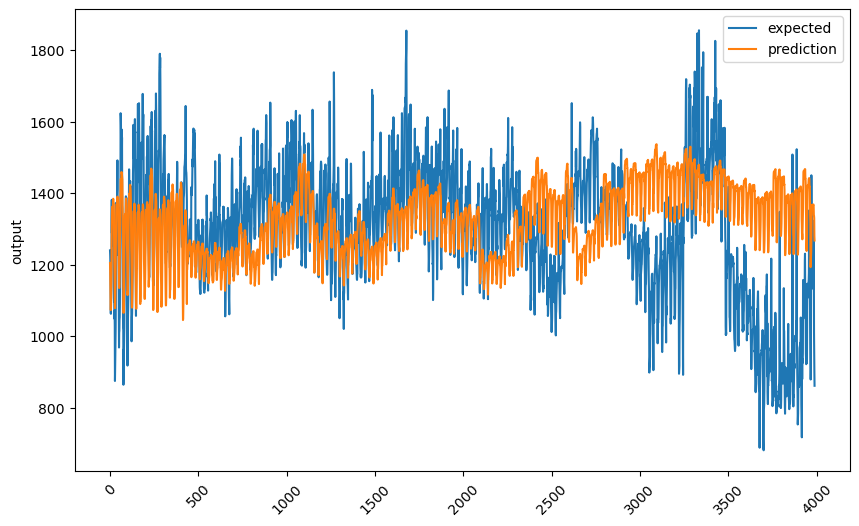

Last 300 values:


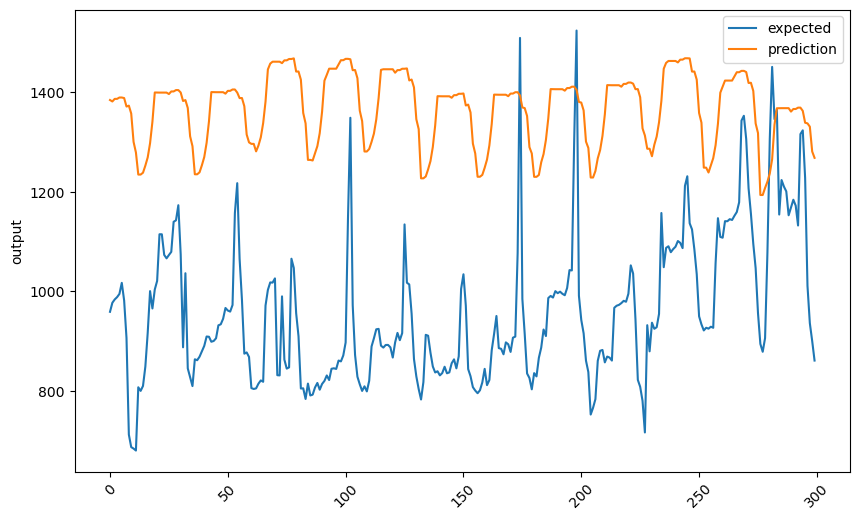

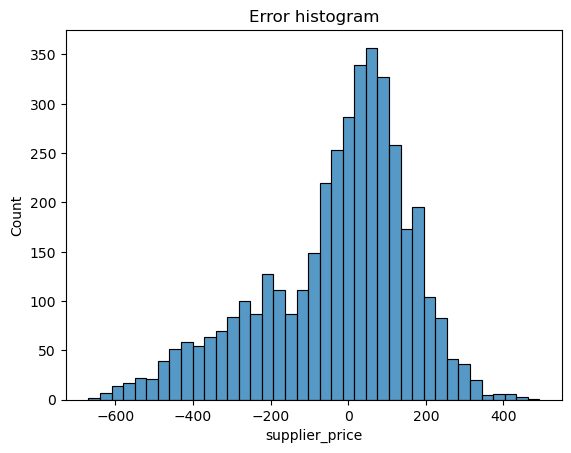

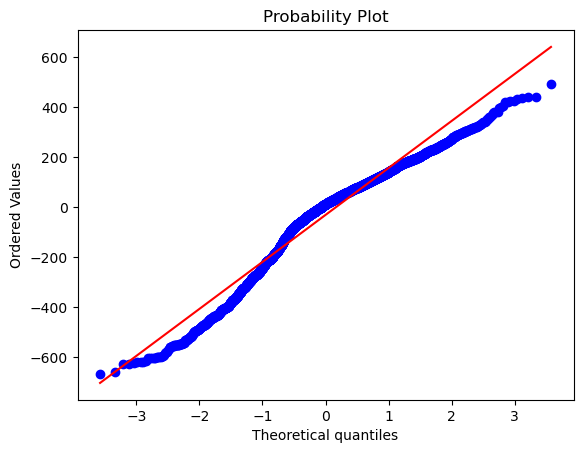

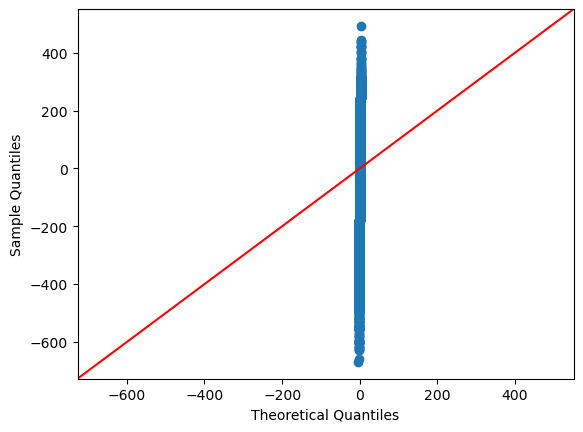

----------
Statistical test for normality of residuals:
----------

D'Agostino & Pearson:  NOT Normal
299.69769280226234

Jarque-Bera:           NOT Normal
369.6222501354473

Kolmogorov-Smirnov:    NOT Normal
0.10230616597743308

Lilliefors:            NOT Normal
0.10230616597743308

Shapiro-Wilk:          NOT Normal
0.9546434283256531

Anderson–Darling:      NOT Normal
67.55777295367534

Done!

----------------
XGBoost model...
Fold #1...
Fold #2...
Fold #3...
Fold #4...
Fold #5...
Fold #6...
Fold #7...
Fold #8...
Fold #9...
Fold #10...


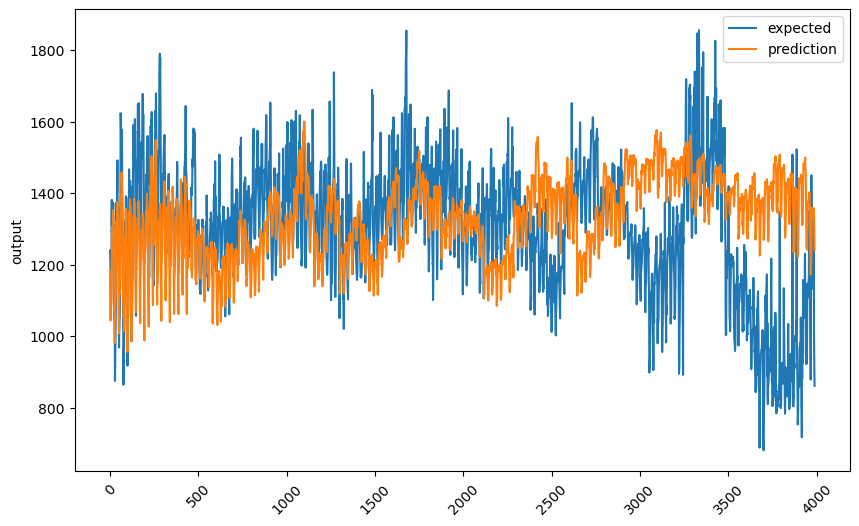

Last 300 values:


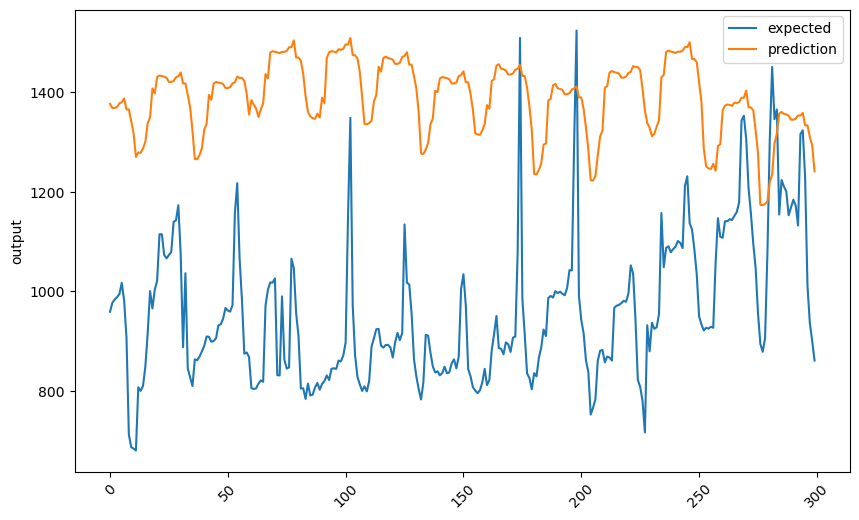

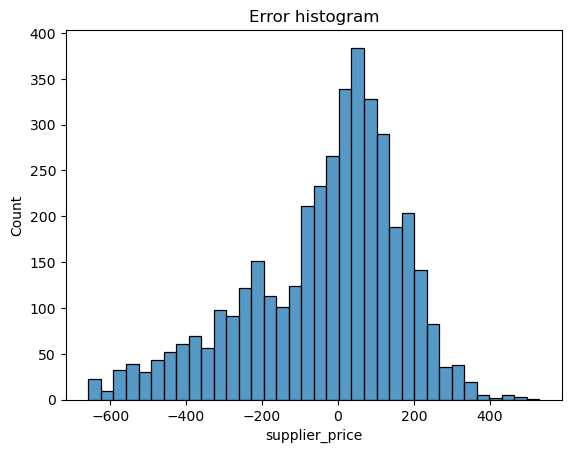

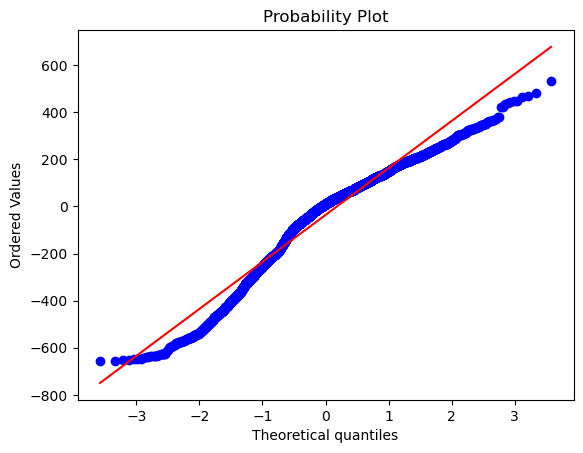

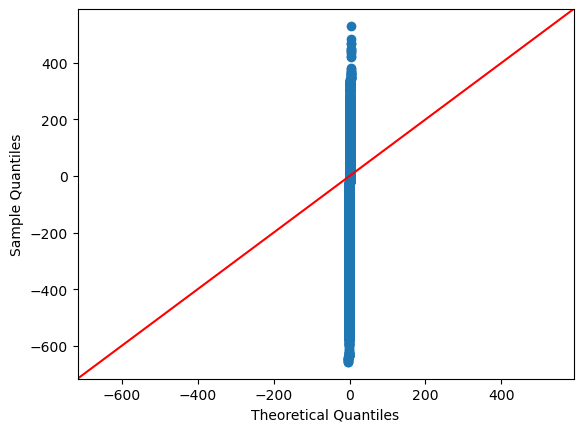

----------
Statistical test for normality of residuals:
----------

D'Agostino & Pearson:  NOT Normal
298.1365418875076

Jarque-Bera:           NOT Normal
367.597941253486

Kolmogorov-Smirnov:    NOT Normal
0.09873933460926204

Lilliefors:            NOT Normal
0.09873933460926204

Shapiro-Wilk:          NOT Normal
0.9550183415412903

Anderson–Darling:      NOT Normal
63.783857742284

Done!

----------------
CatBoost model...
Fold #1...


Default metric period is 5 because MAE is/are not implemented for GPU


Fold #2...


Default metric period is 5 because MAE is/are not implemented for GPU


Fold #3...


Default metric period is 5 because MAE is/are not implemented for GPU


Fold #4...


Default metric period is 5 because MAE is/are not implemented for GPU


Fold #5...


Default metric period is 5 because MAE is/are not implemented for GPU


Fold #6...


Default metric period is 5 because MAE is/are not implemented for GPU


Fold #7...


Default metric period is 5 because MAE is/are not implemented for GPU


Fold #8...


Default metric period is 5 because MAE is/are not implemented for GPU


Fold #9...


Default metric period is 5 because MAE is/are not implemented for GPU


Fold #10...


Default metric period is 5 because MAE is/are not implemented for GPU


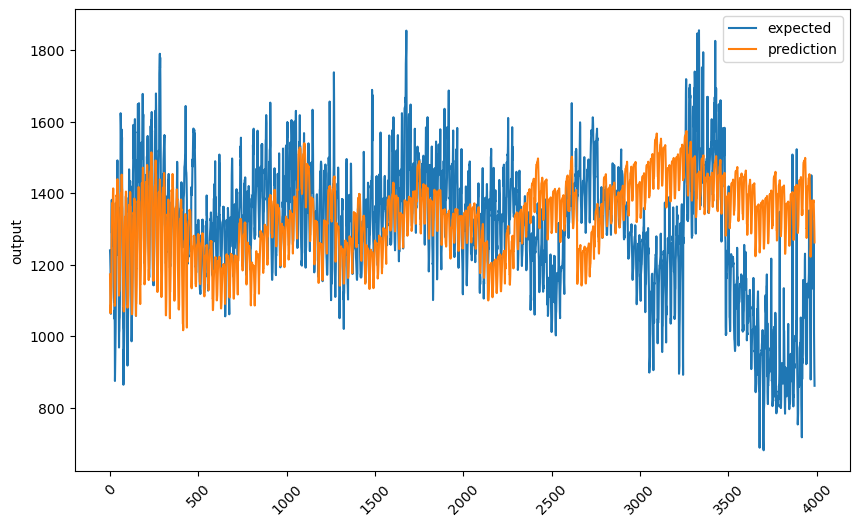

Last 300 values:


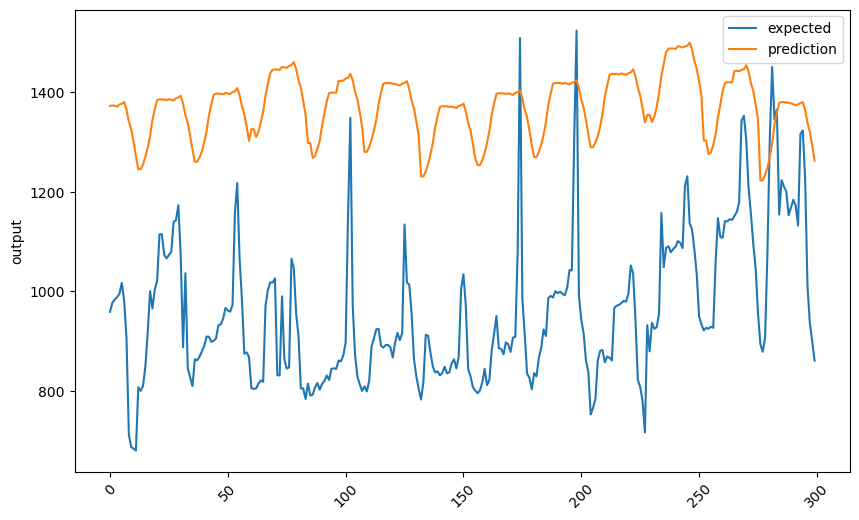

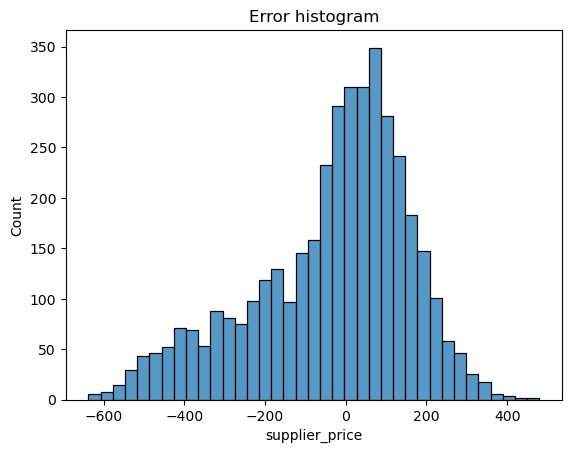

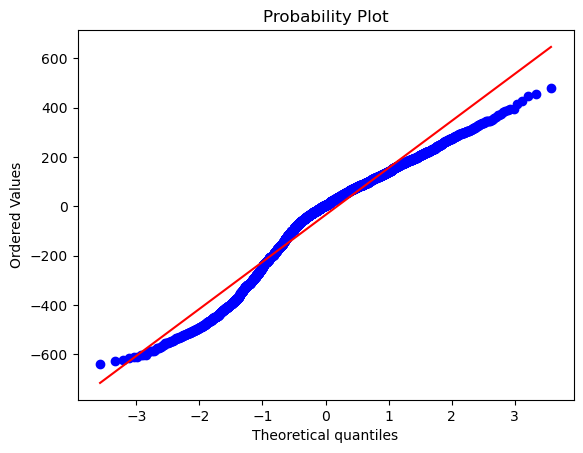

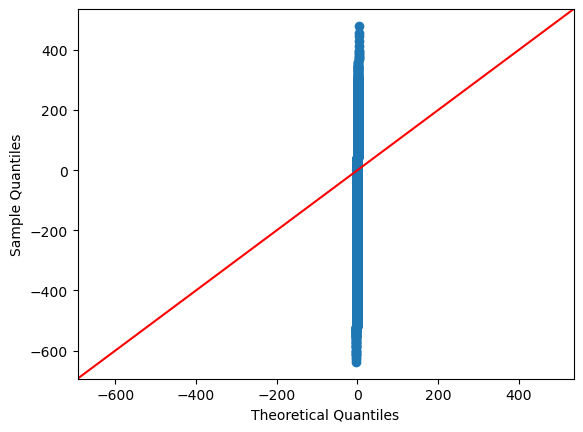

----------
Statistical test for normality of residuals:
----------

D'Agostino & Pearson:  NOT Normal
272.97627950451425

Jarque-Bera:           NOT Normal
331.8466243811537

Kolmogorov-Smirnov:    NOT Normal
0.10014182576721964

Lilliefors:            NOT Normal
0.10014182576721964

Shapiro-Wilk:          NOT Normal
0.9557570815086365

Anderson–Darling:      NOT Normal
64.24207909939923

Done!



In [9]:
names = []
for name, model in models:
    names.append(name)
    print('----------------')
    print(f'{name} model...')
    model_results = {
        'r2' : [],
        'mse' : [],
        'rmse' : [],
        'mae' : [],
        'mape' : [],
        'smape' : []
    }
    fold_num = 1
    timeFold = TimeSeriesSplit(n_splits = NUM_OF_SPLITS)
    for train_range, test_range in timeFold.split(df_train):
        print(f'Fold #{fold_num}...')
        train = df_train.iloc[train_range]
        test = df_train.iloc[test_range]
        scaler = StandardScaler()
        train_scaled = scaler.fit_transform(train)
        train_scaled = pd.DataFrame(train_scaled, columns = train.columns, index = train.index)
        test_scaled = scaler.transform(test)
        test_scaled = pd.DataFrame(test_scaled, columns = test.columns, index = test.index)
        x_train, y_train = train_scaled.drop(columns = TARGET_COLUMN), train_scaled[[TARGET_COLUMN]]
        x_test, y_test = test_scaled.drop(columns = TARGET_COLUMN), test_scaled[[TARGET_COLUMN]]
        model.fit(x_train, y_train)
        y_pred = model.predict(x_test)
        pred = x_test.copy()
        pred[TARGET_COLUMN] = y_pred
        pred = scaler.inverse_transform(pred)
        pred = pd.DataFrame(pred, columns = test.columns, index = test.index)
        y_pred = pred[TARGET_COLUMN]
        y_test = test[TARGET_COLUMN]
        mse_result = mse(y_test, y_pred)
        model_results['r2'].append(r2(y_test, y_pred))
        model_results['mse'].append(mse_result)
        model_results['rmse'].append(np.sqrt(mse_result))
        model_results['mae'].append(mae(y_test, y_pred))
        model_results['mape'].append(mape(y_test, y_pred) * 100.0)
        model_results['smape'].append(smape(y_test, y_pred))
        if fold_num == NUM_OF_SPLITS:
            show_regression_chart(y_test, y_pred, sort = False)
            print(f'Last {LATEST_PRED_AMOUNT} values:')
            show_regression_chart(y_test[-LATEST_PRED_AMOUNT:], y_pred[-LATEST_PRED_AMOUNT:], sort = False)
            show_error_histogram(y_test, y_pred)
            resudials = y_test - y_pred
            show_probability_plot(resudials)
            show_quantile_quantile_plot(resudials)
            print('-' * 10)
            print('Statistical test for normality of residuals:')
            print('-' * 10)
            print()
            run_tests_for_normality(resudials)
        fold_num += 1
    for model_result_key, model_result_value in model_results.items():
        results[model_result_key].append(model_result_value)
    print('Done!')
    print()

### DL models

In [65]:
def show_training_history(history, metrics, metric_names, figure_size = (7, 6), last_epoch = None):
    if len(metrics) == 1 and len(metric_names) == 1:
        plt.figure(figsize = figure_size)
        fig, ax = plt.subplots()
        metric = metrics[0]
        metric_name = metric_names[0]
        ax.plot(history[metric], color = 'b', label = f'Training {metric_name}')
        if f'val_{metric}' in history:
            ax.plot(history[f'val_{metric}'], color = 'r', label = f'Validation {metric_name}')
        if last_epoch is not None:
            ax.axvline(x = last_epoch, color = 'g', label = 'Start of fine tuning')
        legend = ax.legend(loc = 'best', shadow = True)
        plt.show()
    elif len(metrics) > 1 and len(metrics) == len(metric_names):
        plt.figure(figsize = figure_size)
        fig, ax = plt.subplots(len(metrics), 1)
        for i in range(len(metrics)):
            metric = metrics[i]
            metric_name = metric_names[i]
            ax[i].plot(history[metric], color = 'b', label = f'Training {metric_name}')
            if f'val_{metric}' in history:
                ax[i].plot(history[f'val_{metric}'], color = 'r', label = f'Validation {metric_name}', axes = ax[i])
            if last_epoch is not None:
                ax[i].axvline(x = last_epoch, color = 'g', label = 'Start of fine tuning')
            legend = ax[i].legend(loc = 'best', shadow = True)
        plt.show()
    else:
        raise Exception('Invalid metrics/metric names amount')

In [66]:
import tensorflow as tf
from tensorflow import keras
from keras import Input
from keras.models import Sequential
from keras.layers import Dense

tf.random.set_seed(RANDOM_STATE)
tf.config.list_physical_devices()

[PhysicalDevice(name='/physical_device:CPU:0', device_type='CPU'),
 PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]

In [67]:
def get_perceptron_1(input_shape):
    model = Sequential(
        [
            Input(shape = input_shape),
            Dense(10, activation = 'relu'),
            Dense(5, activation = 'relu'),
            Dense(2, activation = 'relu'),
            Dense(1)
        ])
    model.compile(loss = 'mean_squared_error', optimizer = 'adam')
    return model

def get_perceptron_2(input_shape):
    model = Sequential(
        [
            Input(shape = input_shape),
            Dense(20, activation = 'relu'),
            Dense(10, activation = 'relu'),
            Dense(5, activation = 'relu'),
            Dense(1)
        ])
    model.compile(loss = 'mean_squared_error', optimizer = 'adam')
    return model

def get_perceptron_3(input_shape):
    model = Sequential(
        [
            Input(shape = input_shape),
            Dense(20, activation = 'relu'),
            Dense(10, activation = 'relu'),
            Dense(5, activation = 'relu'),
            Dense(2, activation = 'relu'),
            Dense(1)
        ])
    model.compile(loss = 'mean_squared_error', optimizer = 'adam')
    return model

def get_perceptron_4(input_shape):
    model = Sequential(
        [
            Input(shape = input_shape),
            Dense(10, activation = 'relu'),
            Dense(1)
        ])
    model.compile(loss = 'mean_squared_error', optimizer = 'adam')
    return model

def get_perceptron_5(input_shape):
    model = Sequential(
        [
            Input(shape = input_shape),
            Dense(10, activation = 'relu'),
            Dense(5, activation = 'relu'),
            Dense(1)
        ])
    model.compile(loss = 'mean_squared_error', optimizer = 'adam')
    return model

In [70]:
BATCH_SIZE = 32
EPOCHS = 10
NUM_OF_VARIABLES = df_train.shape[-1] - 1
INPUT_SHAPE_FF =  (NUM_OF_VARIABLES,)

df_train = df_sup.copy()

In [15]:
dl_models = []
dl_models.append(('FFNN-10-1', get_perceptron_4))
dl_models.append(('FFNN-10-5-1', get_perceptron_5))
dl_models.append(('FFNN-10-5-2-1', get_perceptron_1))
dl_models.append(('FFNN-20-10-5-1', get_perceptron_2))
dl_models.append(('FFNN-20-10-5-2-1', get_perceptron_3))

----------------
FFNN-10-1 model...
Fold #1...
Fold #2...
Fold #3...
Fold #4...
Fold #5...
Fold #6...
Fold #7...
Fold #8...
Fold #9...
Fold #10...


<Figure size 700x600 with 0 Axes>

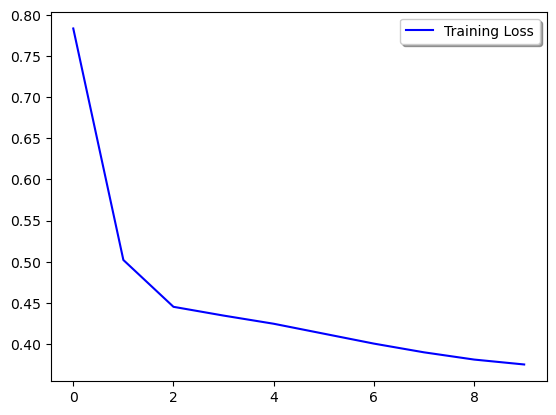

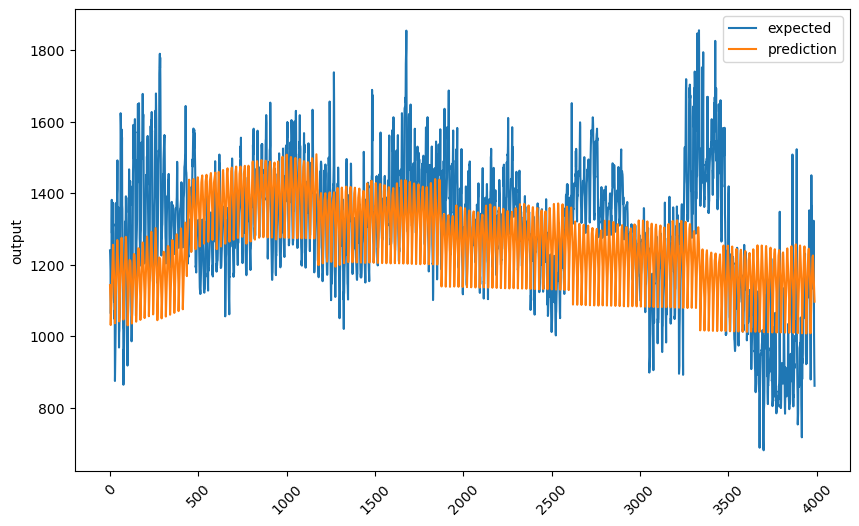

Last 300 values:


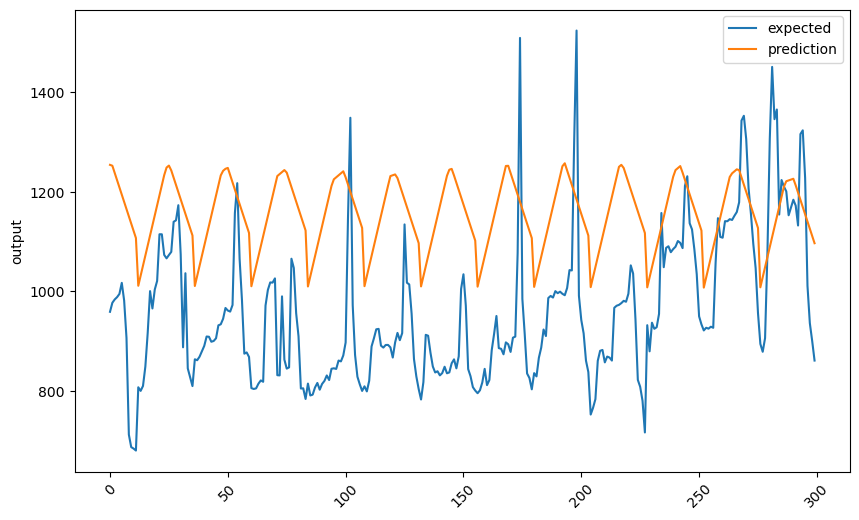

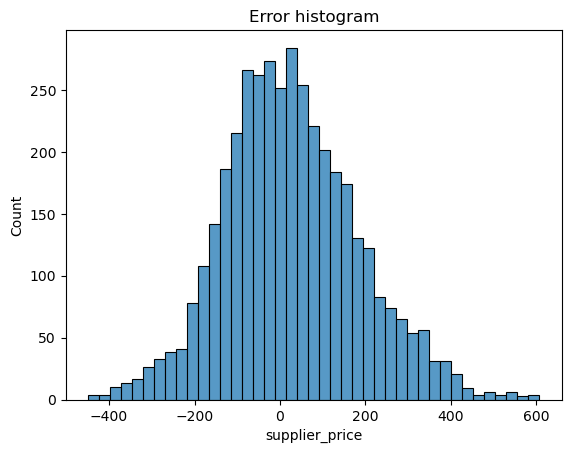

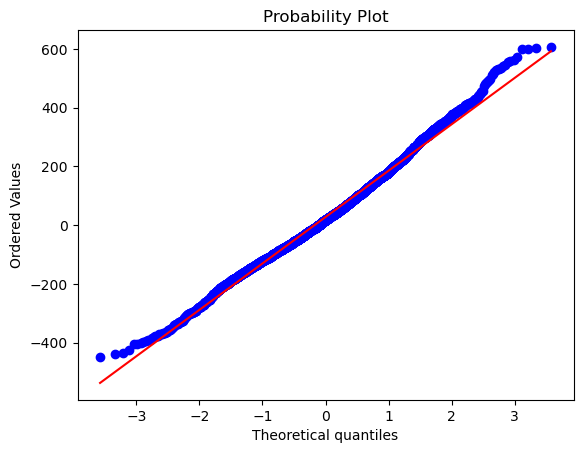

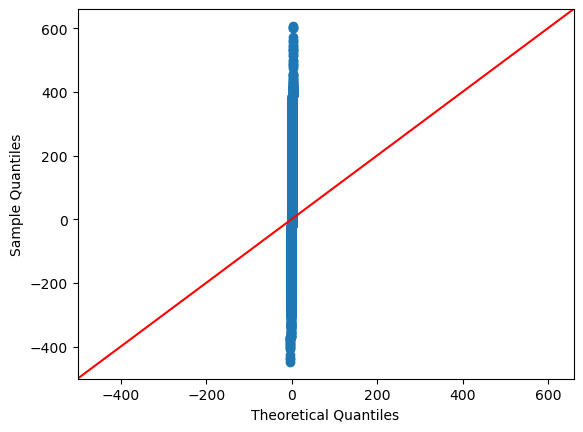

----------
Statistical test for normality of residuals:
----------

D'Agostino & Pearson:  NOT Normal
66.45270137190158

Jarque-Bera:           NOT Normal
70.6680918379081

Kolmogorov-Smirnov:    NOT Normal
0.03300192747415509

Lilliefors:            NOT Normal
0.03300192747415509

Shapiro-Wilk:          NOT Normal
0.9934793710708618

Anderson–Darling:      NOT Normal
7.820719899921187

Done!

----------------
FFNN-10-5-1 model...
Fold #1...
Fold #2...
Fold #3...
Fold #4...
Fold #5...
Fold #6...
Fold #7...
Fold #8...
Fold #9...
Fold #10...


<Figure size 700x600 with 0 Axes>

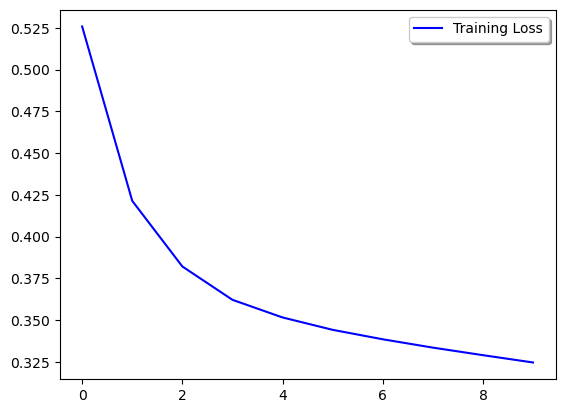

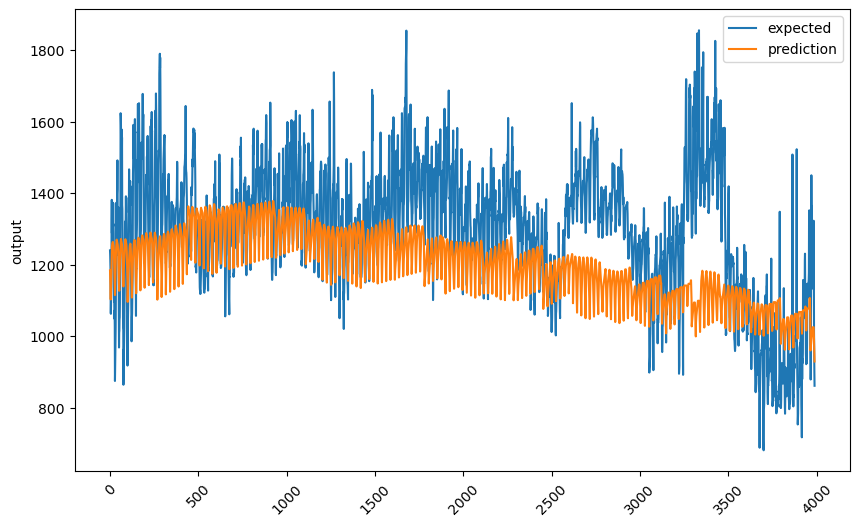

Last 300 values:


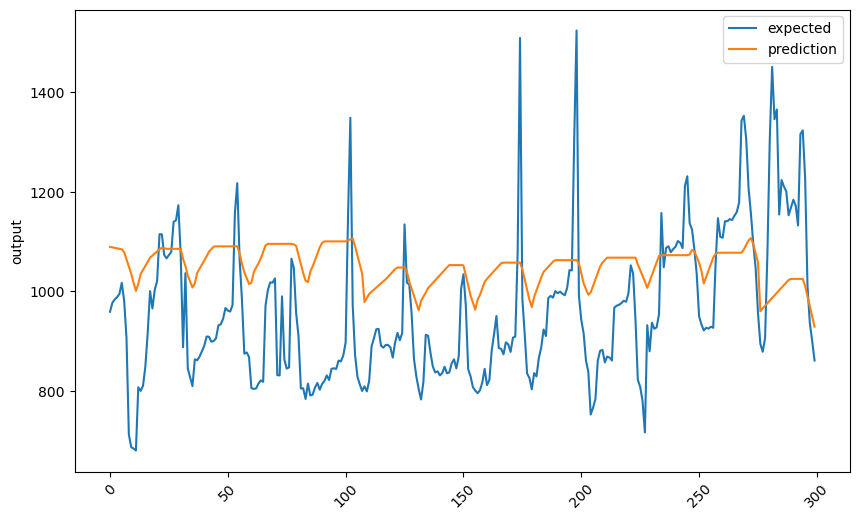

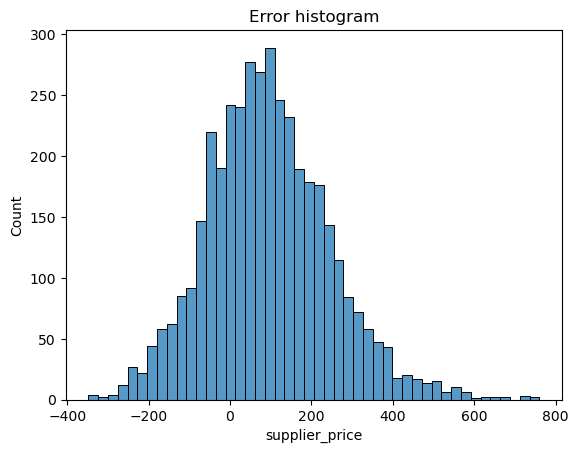

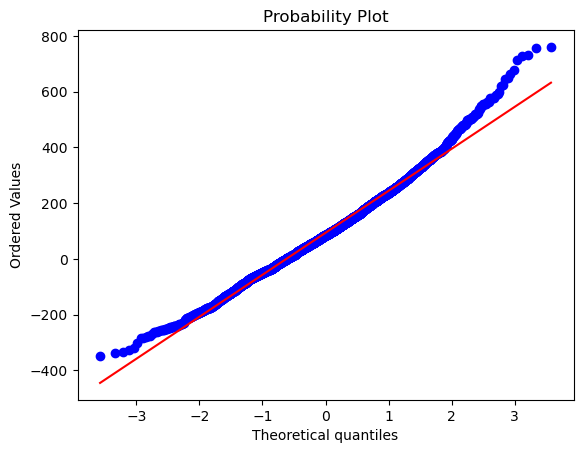

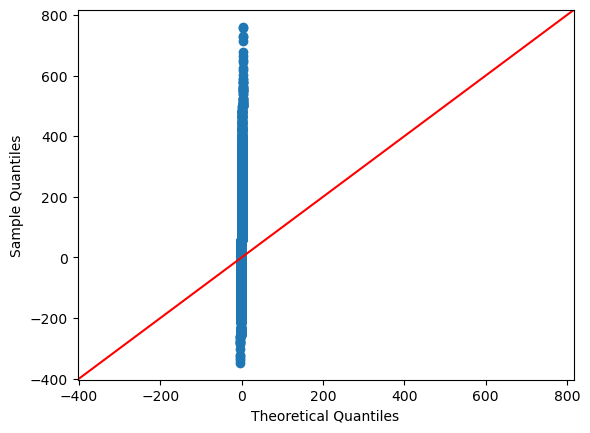

----------
Statistical test for normality of residuals:
----------

D'Agostino & Pearson:  NOT Normal
147.494695589684

Jarque-Bera:           NOT Normal
183.3984342947007

Kolmogorov-Smirnov:    NOT Normal
0.03249523612029226

Lilliefors:            NOT Normal
0.03249523612029226

Shapiro-Wilk:          NOT Normal
0.9898858070373535

Anderson–Darling:      NOT Normal
7.266577371589847

Done!

----------------
FFNN-10-5-2-1 model...
Fold #1...
Fold #2...
Fold #3...
Fold #4...
Fold #5...
Fold #6...
Fold #7...
Fold #8...
Fold #9...
Fold #10...


<Figure size 700x600 with 0 Axes>

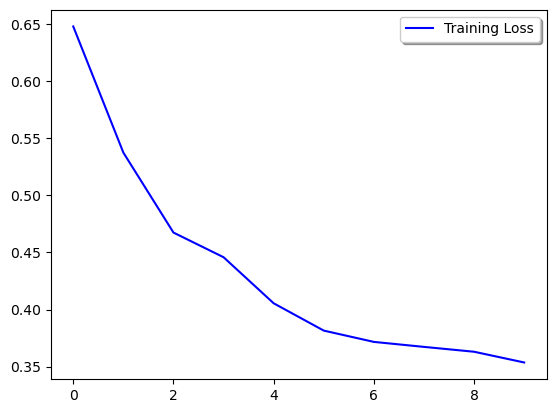

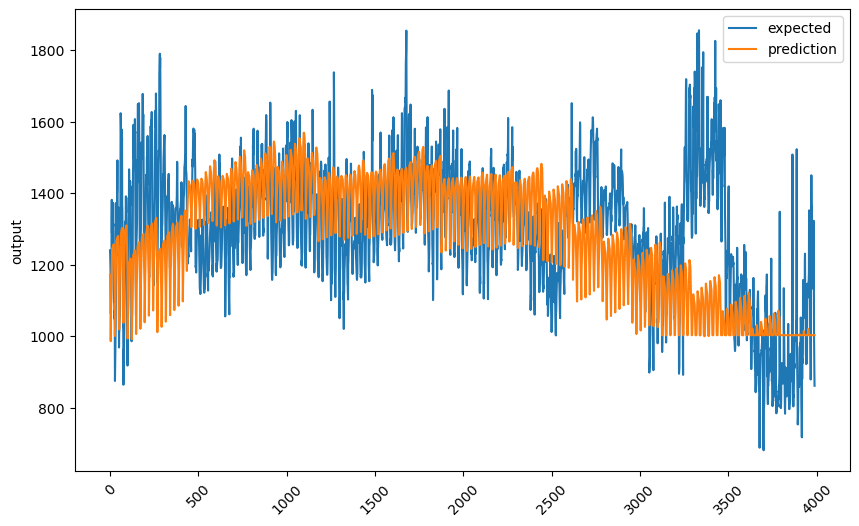

Last 300 values:


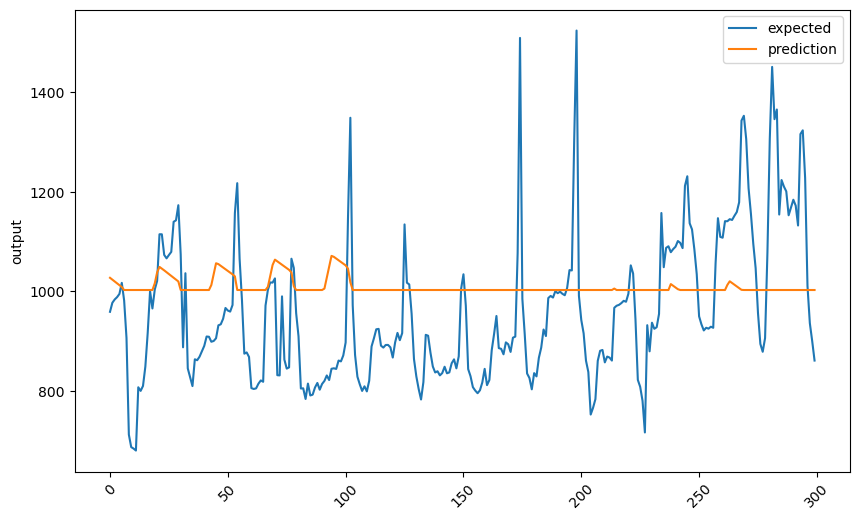

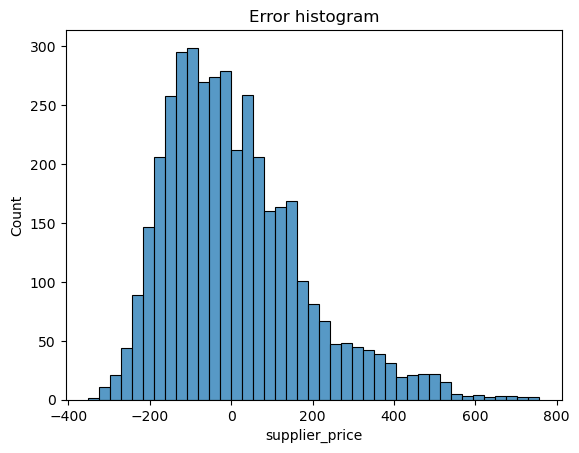

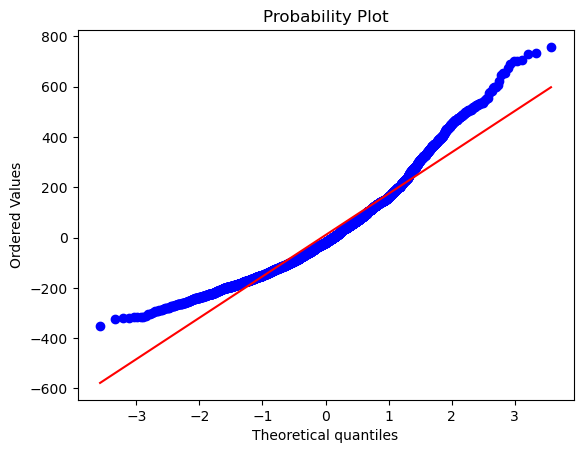

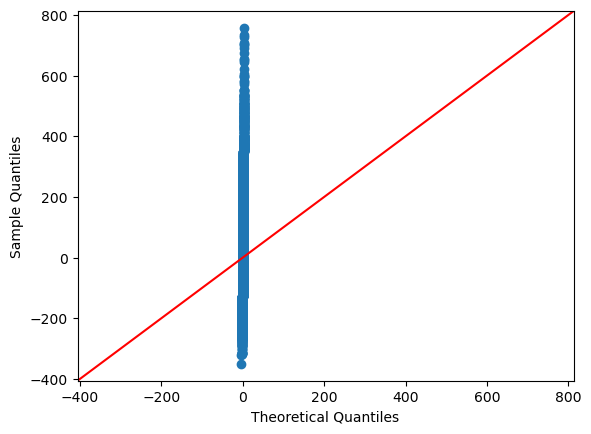

----------
Statistical test for normality of residuals:
----------

D'Agostino & Pearson:  NOT Normal
541.9216036041503

Jarque-Bera:           NOT Normal
821.4207096031258

Kolmogorov-Smirnov:    NOT Normal
0.074217684558327

Lilliefors:            NOT Normal
0.074217684558327

Shapiro-Wilk:          NOT Normal
0.9454907178878784

Anderson–Darling:      NOT Normal
52.51259576404436

Done!

----------------
FFNN-20-10-5-1 model...
Fold #1...
Fold #2...
Fold #3...
Fold #4...
Fold #5...
Fold #6...
Fold #7...
Fold #8...
Fold #9...
Fold #10...


<Figure size 700x600 with 0 Axes>

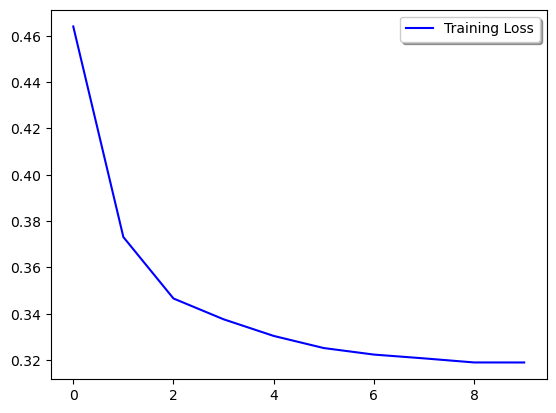

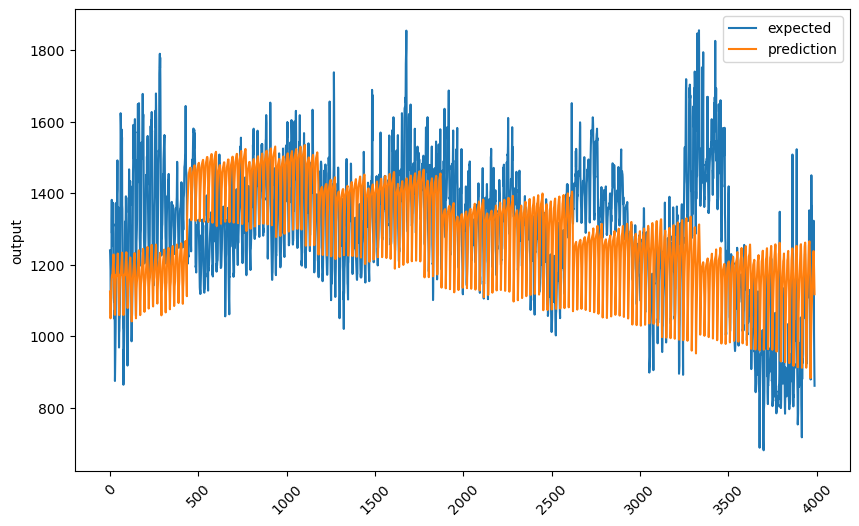

Last 300 values:


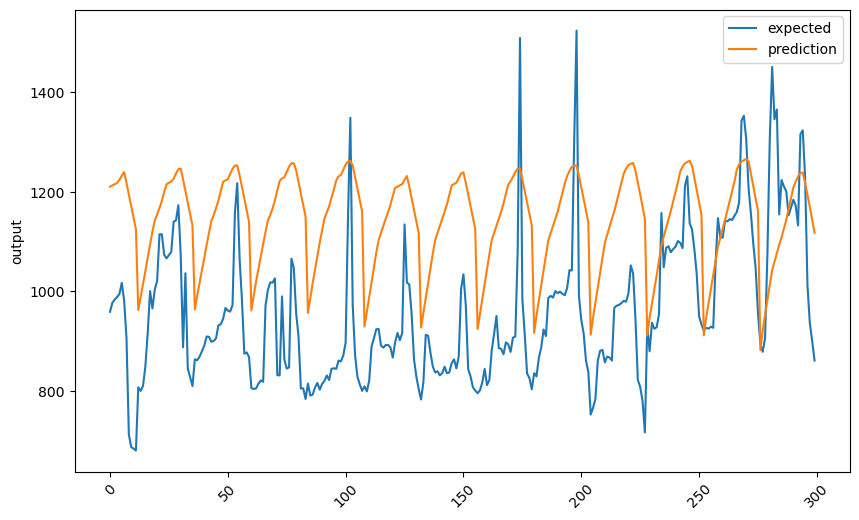

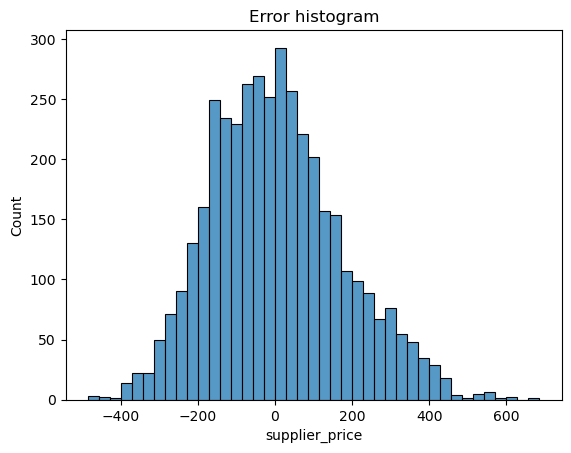

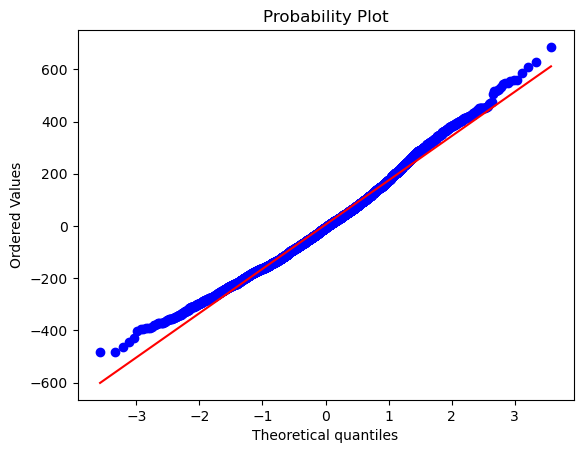

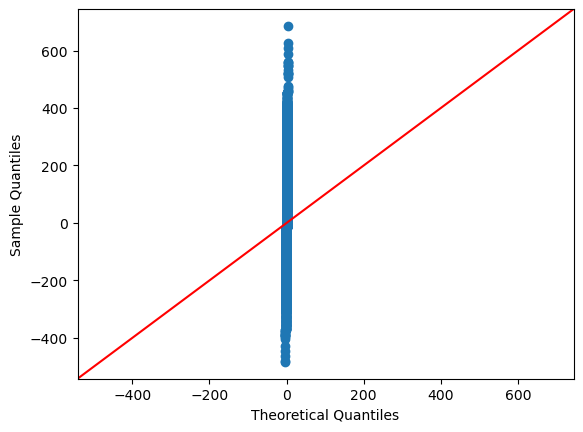

----------
Statistical test for normality of residuals:
----------

D'Agostino & Pearson:  NOT Normal
97.31074874457549

Jarque-Bera:           NOT Normal
104.13111033923377

Kolmogorov-Smirnov:    NOT Normal
0.03295561599725183

Lilliefors:            NOT Normal
0.03295561599725183

Shapiro-Wilk:          NOT Normal
0.9895139336585999

Anderson–Darling:      NOT Normal
11.271658543887952

Done!

----------------
FFNN-20-10-5-2-1 model...
Fold #1...
Fold #2...
Fold #3...
Fold #4...
Fold #5...
Fold #6...
Fold #7...
Fold #8...
Fold #9...
Fold #10...


<Figure size 700x600 with 0 Axes>

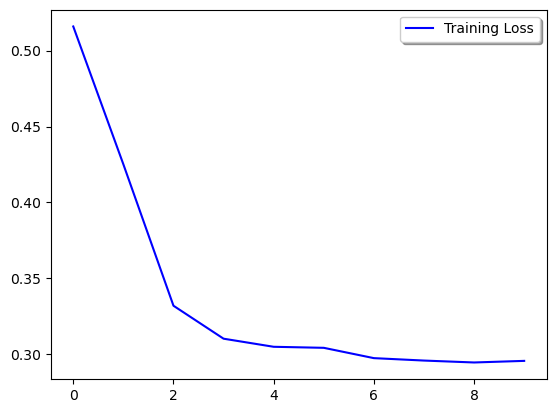

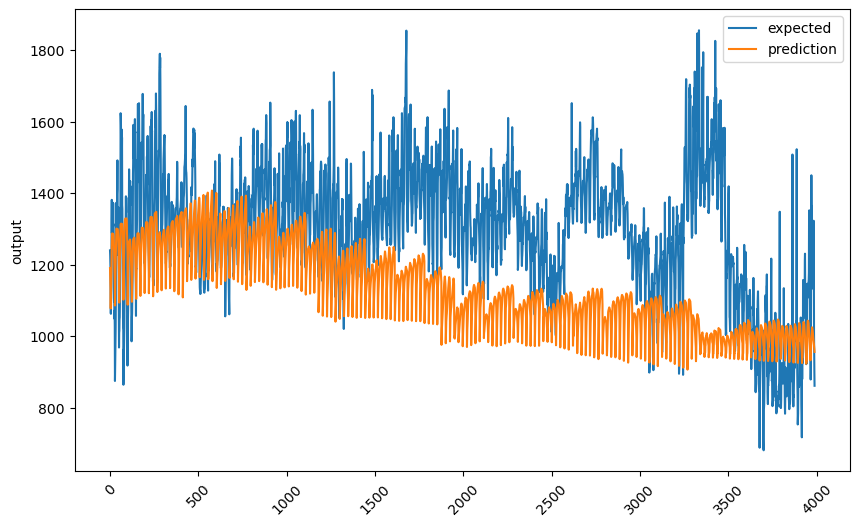

Last 300 values:


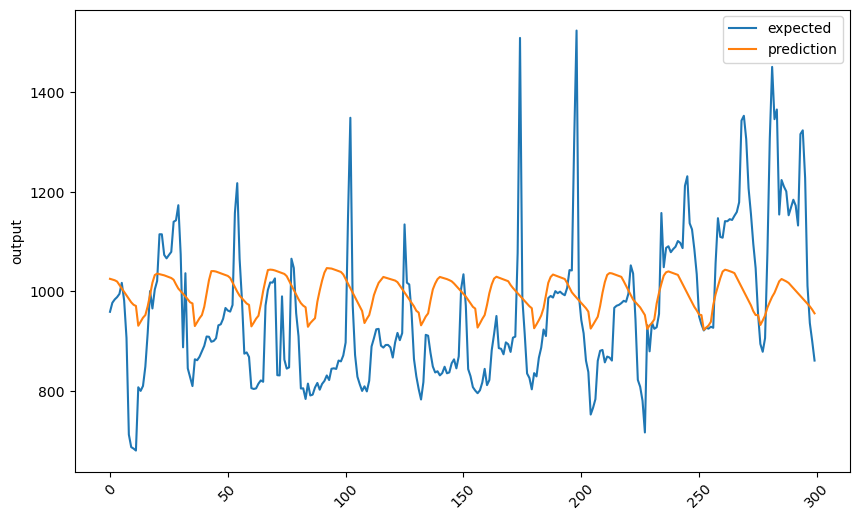

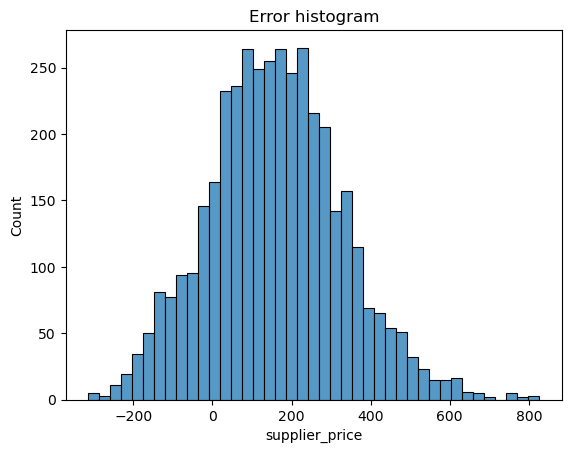

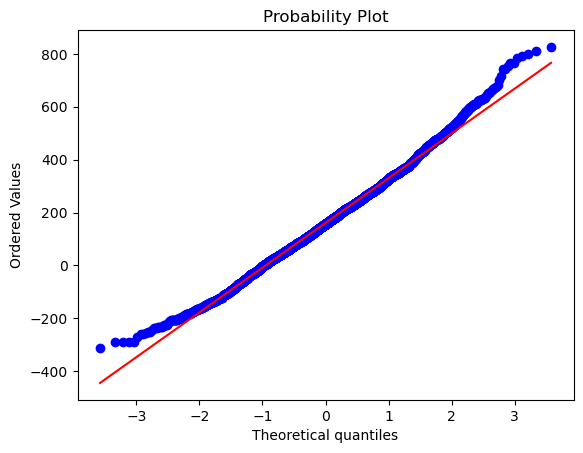

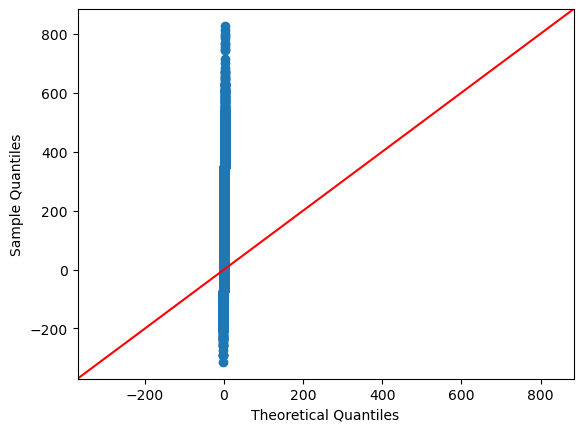

----------
Statistical test for normality of residuals:
----------

D'Agostino & Pearson:  NOT Normal
50.110889185874505

Jarque-Bera:           NOT Normal
52.60684560356479

Kolmogorov-Smirnov:    NOT Normal
0.017645417786456674

Lilliefors:            NOT Normal
0.017645417786456674

Shapiro-Wilk:          NOT Normal
0.9952757358551025

Anderson–Darling:      NOT Normal
2.3440180738548406

Done!



In [16]:
for name, model_function in dl_models:
    names.append(name)
    print('----------------')
    print(f'{name} model...')
    model_results = {
        'r2' : [],
        'mse' : [],
        'rmse' : [],
        'mae' : [],
        'mape' : [],
        'smape': []
    }
    fold_num = 1
    timeFold = TimeSeriesSplit(n_splits = NUM_OF_SPLITS)
    for train_range, test_range in timeFold.split(df_train):
        print(f'Fold #{fold_num}...')
        train = df_train.iloc[train_range]
        test = df_train.iloc[test_range]
        scaler = StandardScaler()
        train_scaled = scaler.fit_transform(train)
        train_scaled = pd.DataFrame(train_scaled, columns = train.columns, index = train.index)
        test_scaled = scaler.transform(test)
        test_scaled = pd.DataFrame(test_scaled, columns = test.columns, index = test.index)
        x_train, y_train = train_scaled.drop(columns = TARGET_COLUMN), train_scaled[[TARGET_COLUMN]]
        x_test, y_test = test_scaled.drop(columns = TARGET_COLUMN), test_scaled[[TARGET_COLUMN]]
        model = model_function(INPUT_SHAPE_FF)
        train_history = model.fit(
            x = x_train,
            y = y_train,
            batch_size = BATCH_SIZE,
            epochs = EPOCHS,
            shuffle = False,
            verbose = 0).history
        y_pred = model.predict(x_test, verbose = 0)
        pred = x_test.copy()
        pred[TARGET_COLUMN] = y_pred
        pred = scaler.inverse_transform(pred)
        pred = pd.DataFrame(pred, columns = test.columns, index = test.index)
        y_pred = pred[TARGET_COLUMN]
        y_test = test[TARGET_COLUMN]
        mse_result = mse(y_test, y_pred)
        model_results['r2'].append(r2(y_test, y_pred))
        model_results['mse'].append(mse_result)
        model_results['rmse'].append(np.sqrt(mse_result))
        model_results['mae'].append(mae(y_test, y_pred))
        model_results['mape'].append(mape(y_test, y_pred) * 100.0)
        model_results['smape'].append(smape(y_test, y_pred))
        if fold_num == NUM_OF_SPLITS:
            show_training_history(train_history, ['loss'], ['Loss'])                                                                    
            show_regression_chart(y_test, y_pred, sort = False)
            print(f'Last {LATEST_PRED_AMOUNT} values:')
            show_regression_chart(y_test[-LATEST_PRED_AMOUNT:], y_pred[-LATEST_PRED_AMOUNT:], sort = False)
            show_error_histogram(y_test, y_pred)
            resudials = y_test - y_pred
            show_probability_plot(resudials)
            show_quantile_quantile_plot(resudials)
            print('-' * 10)
            print('Statistical test for normality of residuals:')
            print('-' * 10)
            print()
            run_tests_for_normality(resudials)
        fold_num += 1
    for model_result_key, model_result_value in model_results.items():
        results[model_result_key].append(model_result_value)
    print('Done!')
    print()

### RNNs

In [20]:
LOOK_BACK = 24 * 7 # use a week of measurements to look back
INPUT_SHAPE_RECCURENT =  (LOOK_BACK, NUM_OF_VARIABLES,)

df_train = df_sup.copy()

In [ ]:
#TODO

### Results

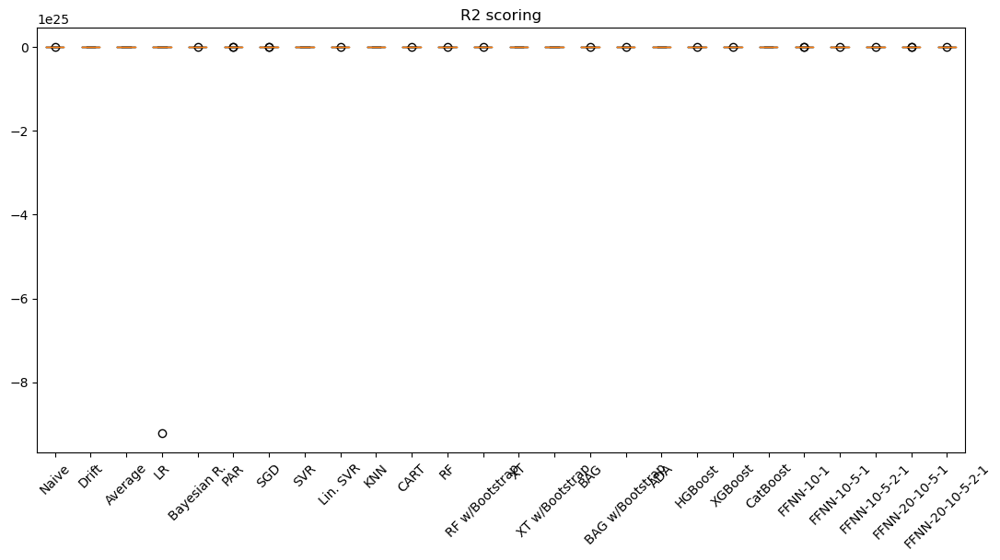

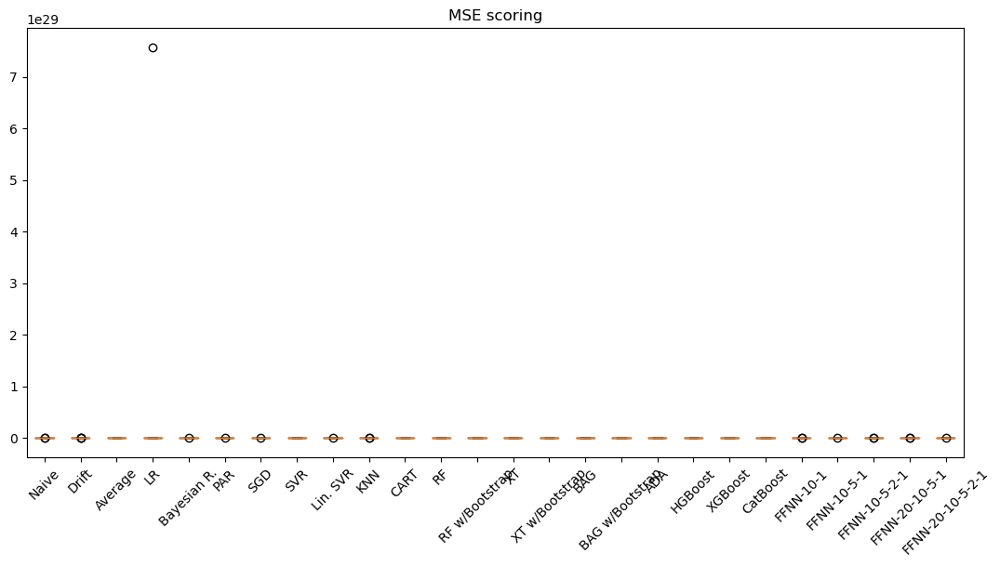

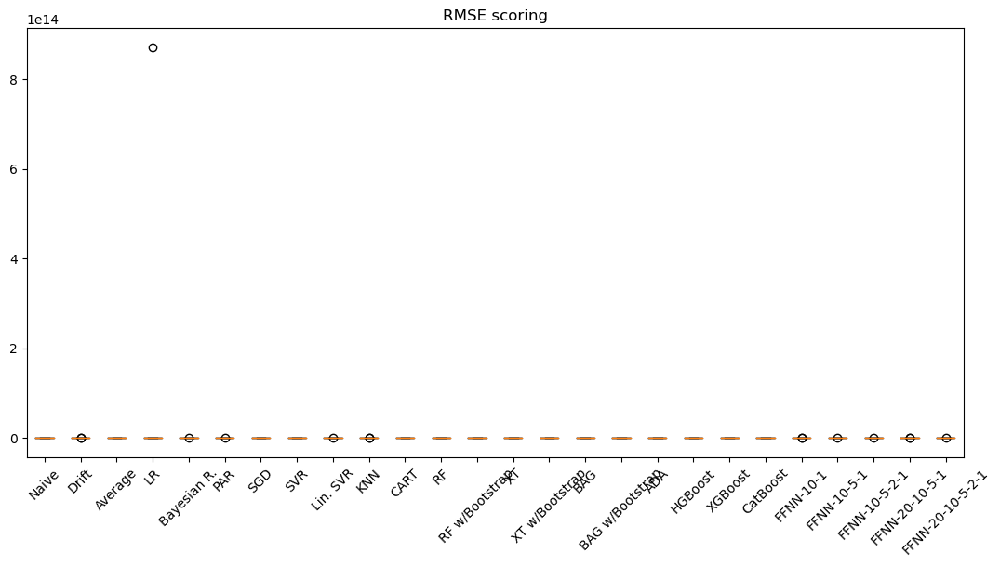

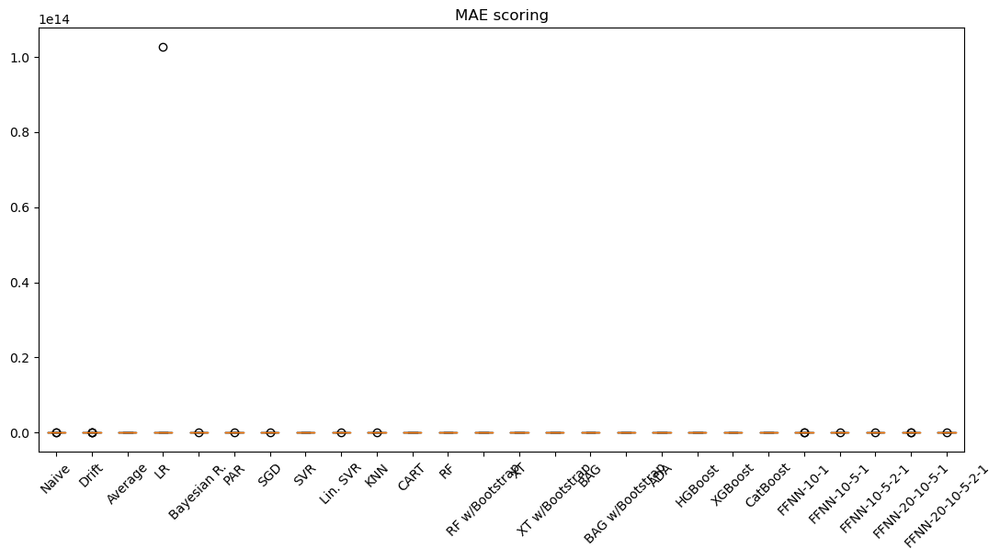

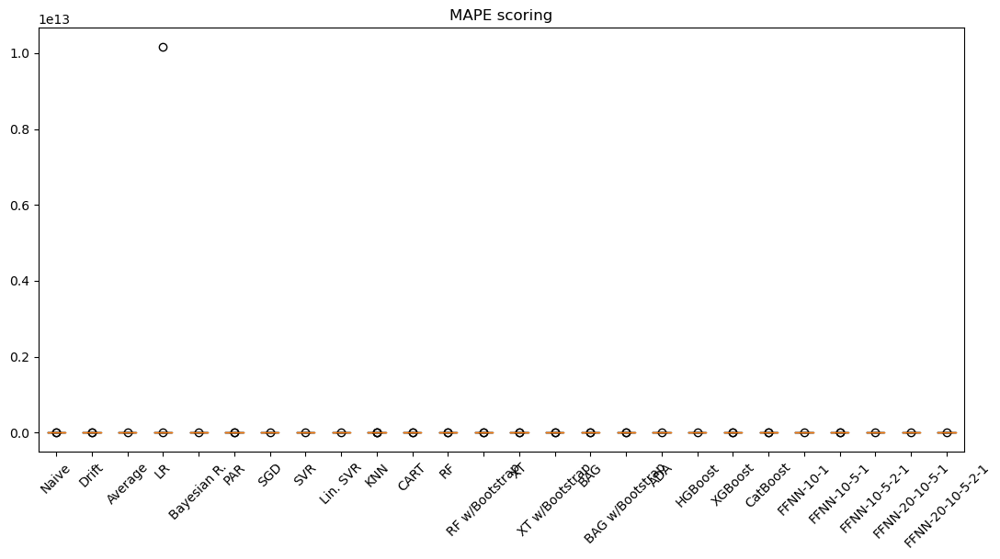

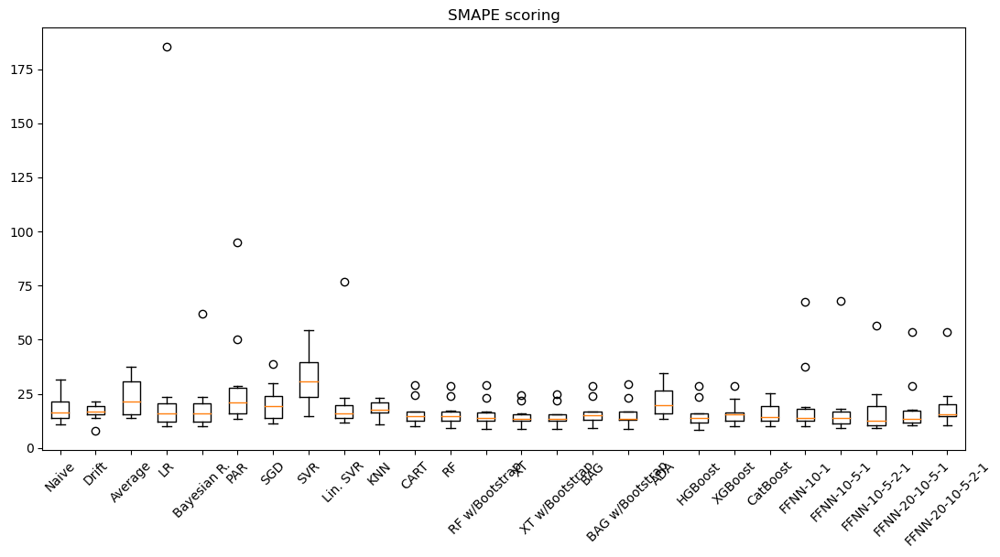

In [17]:
for result_key, result_value in results.items():
    plt.figure(figsize = (13, 6))
    plt.title(f'{result_key.upper()} scoring')
    plt.boxplot(result_value, labels = names)
    plt.xticks(rotation = 45)
    plt.show()

In [18]:
results_table = pd.DataFrame(results)
results_table = results_table.applymap(lambda x: np.median(x))
results_table = results_table.applymap(lambda x: round(x, ndigits = 2))
results_table.index = names
results_table

,r2,mse,rmse,mae,mape,smape
Naive,-0.92,36379.80,190.49,145.65,21.20,16.23
Drift,-0.79,40376.44,200.94,158.67,17.67,16.94
Average,-1.68,48839.86,220.69,197.71,25.85,21.53
LR,-0.70,40398.34,200.65,160.15,17.18,15.85
Bayesian R.,-0.70,40328.98,200.45,159.63,17.15,15.83
PAR,-1.24,71105.71,265.98,215.28,25.73,21.01
SGD,-0.70,51528.24,226.97,191.70,21.67,19.34
SVR,-3.57,90574.71,300.96,279.92,26.31,30.81
Lin. SVR,-0.56,35870.39,189.39,152.03,17.57,16.04
KNN,-1.11,42300.70,205.67,162.02,19.00,17.75


In [19]:
methods = []
errors = []
print('Minimal errors:')
print()
for column in results_table:
    if column == 'r2':
        index_of_max = results_table[column].idxmax()
        methods.append(index_of_max)
        errors.append(results_table[column][index_of_max])
    else:
        index_of_min = results_table[column].idxmin()
        methods.append(index_of_min)
        errors.append(results_table[column][index_of_min])
min_errors = pd.DataFrame(data = {'Methods': methods, 'Errors': errors}, index = results_table.columns)
min_errors

Minimal errors:



,Methods,Errors
r2,FFNN-10-5-2-1,-0.04
mse,FFNN-10-5-2-1,27312.74
rmse,FFNN-10-5-2-1,165.22
mae,FFNN-10-5-2-1,124.74
mape,XT w/Bootstrap,14.40
smape,FFNN-10-5-2-1,12.74


## Prediction wo/ year feature

Hypothesis: the year feature might be unnecessary or it even worsen the prediction results because this feature doesn't represent any meaningful change in the data. So without the year feature the forecasts will be more accurate.

### ML models

In [59]:
NUM_OF_SPLITS = 10
LATEST_PRED_AMOUNT = 300
TARGET_COLUMN = 'supplier_price'

results = {
    'r2' : [],
    'mse' : [],
    'rmse' : [],
    'mae' : [],
    'mape' : [],
    'smape' : []
}

df_train = df_sup.copy()
df_train = df_train.drop(columns = ['year'])
df_train

,quarter,month,week_of_year,day_of_year,day_of_week,day,hour,supplier_price
date,,,,,,,,
2019-05-27 00:00:00+00:00,2,5,22,147,0,27,0,949.90
2019-05-27 01:00:00+00:00,2,5,22,147,0,27,1,942.20
2019-05-27 02:00:00+00:00,2,5,22,147,0,27,2,952.14
2019-05-27 03:00:00+00:00,2,5,22,147,0,27,3,944.93
2019-05-27 04:00:00+00:00,2,5,22,147,0,27,4,966.00
...,...,...,...,...,...,...,...,...
2024-05-27 19:00:00+00:00,2,5,22,148,0,27,19,1227.36
2024-05-27 20:00:00+00:00,2,5,22,148,0,27,20,1010.99
2024-05-27 21:00:00+00:00,2,5,22,148,0,27,21,936.12


In [60]:
models = []
models.append(('Naive', ConstantRegressor()))
models.append(('Drift', DriftRegressor()))
models.append(('Average', DummyRegressor(strategy = 'mean')))
models.append(('LR', LinearRegression(fit_intercept = False)))
models.append(('Bayesian R.', BayesianRidge(fit_intercept = False)))
models.append(('PAR', PassiveAggressiveRegressor(
    max_iter = 100, 
    random_state = RANDOM_STATE, 
    tol = 1e-3, 
    fit_intercept = False)))
models.append(('SGD', SGDRegressor(random_state = RANDOM_STATE, shuffle = False, fit_intercept = False)))
models.append(('SVR', SVR(max_iter = 100)))
models.append(('Lin. SVR', LinearSVR(max_iter = 100, random_state = RANDOM_STATE, fit_intercept = False)))
models.append(('KNN', KNeighborsRegressor(n_neighbors = 20, n_jobs = -1)))
models.append(('CART', DecisionTreeRegressor(random_state = RANDOM_STATE)))
models.append(('RF', RandomForestRegressor(n_jobs = -1, random_state = RANDOM_STATE, bootstrap = False)))
models.append(('RF w/Bootstrap', RandomForestRegressor(n_jobs = -1, random_state = RANDOM_STATE, bootstrap = True)))
models.append(('XT', ExtraTreesRegressor(n_jobs = -1, random_state = RANDOM_STATE, bootstrap = False)))
models.append(('XT w/Bootstrap', ExtraTreesRegressor(n_jobs = -1, random_state = RANDOM_STATE, bootstrap = True)))
models.append(('BAG', BaggingRegressor(n_jobs = -1, random_state = RANDOM_STATE, bootstrap = False)))
models.append(('BAG w/Bootstrap', BaggingRegressor(n_jobs = -1, random_state = RANDOM_STATE, bootstrap = True)))
models.append(('ADA', AdaBoostRegressor(random_state = RANDOM_STATE)))
models.append(('HGBoost', HistGradientBoostingRegressor(random_state = RANDOM_STATE)))
models.append(('XGBoost', XGBRegressor(tree_method = 'gpu_hist', verbosity = 0, random_state = RANDOM_STATE)))
models.append(('CatBoost', CatBoostRegressor(
    random_seed = RANDOM_STATE,
    loss_function = 'RMSE',
    eval_metric = 'MAE',
    od_type = 'Iter',
    od_wait = 20,
    task_type = 'GPU',
    logging_level = 'Silent')))

----------------
Naive model...
Fold #1...
Fold #2...
Fold #3...
Fold #4...
Fold #5...
Fold #6...
Fold #7...
Fold #8...
Fold #9...
Fold #10...


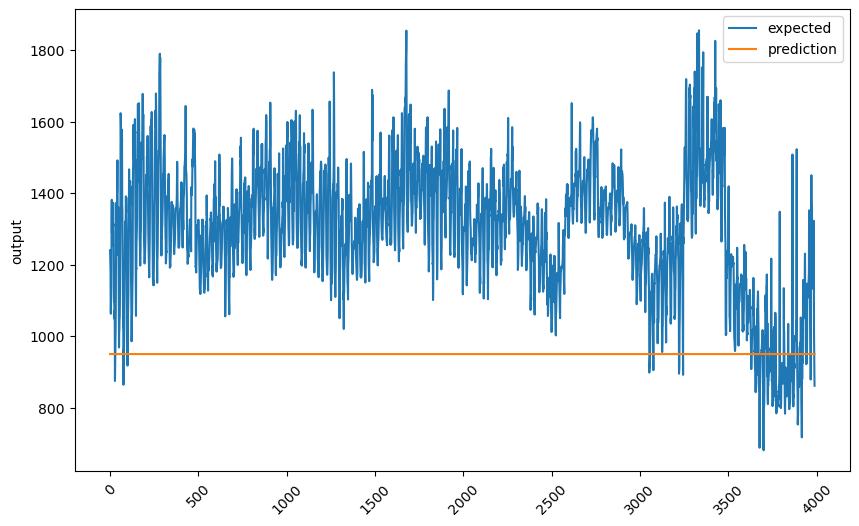

Last 300 values:


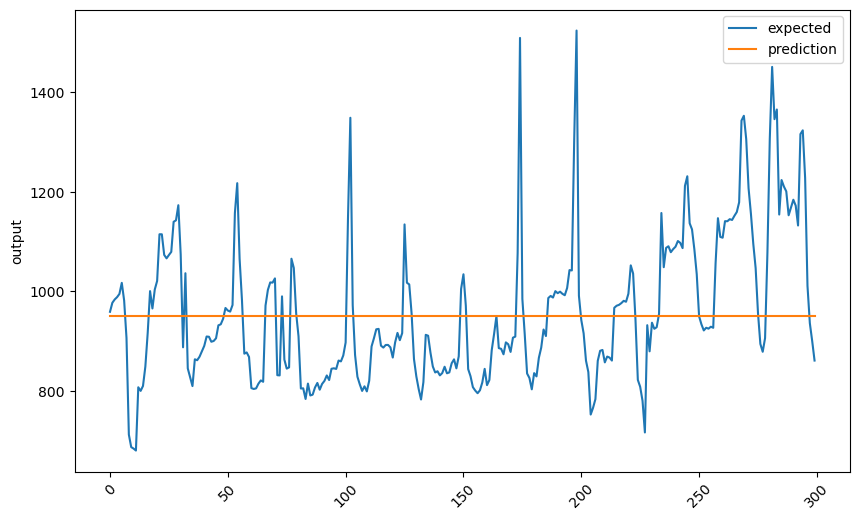

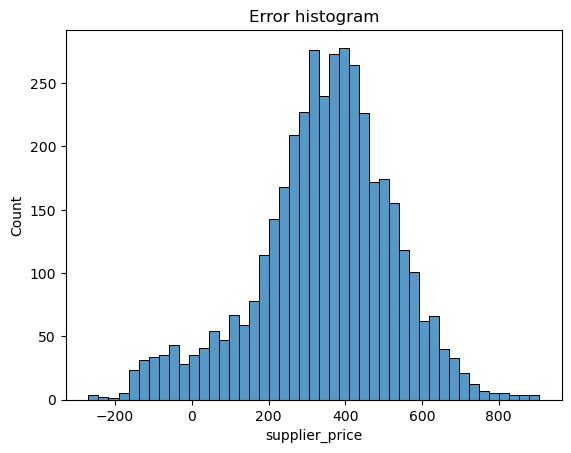

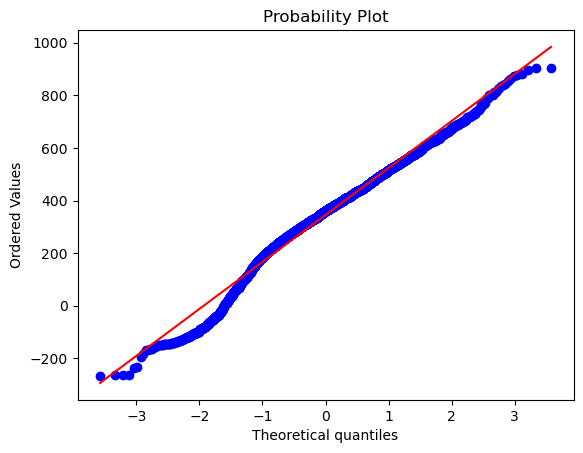

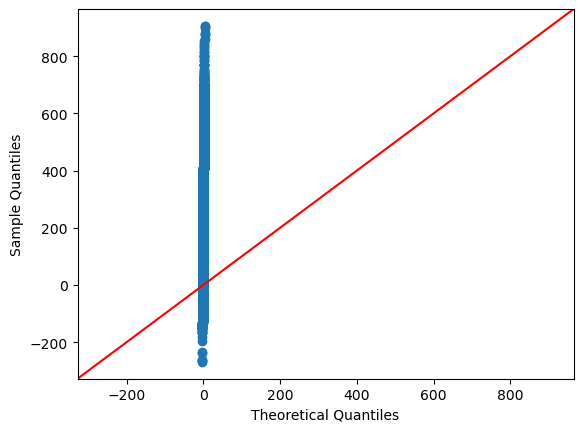

----------
Statistical test for normality of residuals:
----------

D'Agostino & Pearson:  NOT Normal
154.10422573371375

Jarque-Bera:           NOT Normal
178.8932490894559

Kolmogorov-Smirnov:    NOT Normal
0.05401860602165731

Lilliefors:            NOT Normal
0.05401860602165731

Shapiro-Wilk:          NOT Normal
0.9814963340759277

Anderson–Darling:      NOT Normal
22.4632843862546

Done!

----------------
Drift model...
Fold #1...
Fold #2...
Fold #3...
Fold #4...
Fold #5...
Fold #6...
Fold #7...
Fold #8...
Fold #9...
Fold #10...


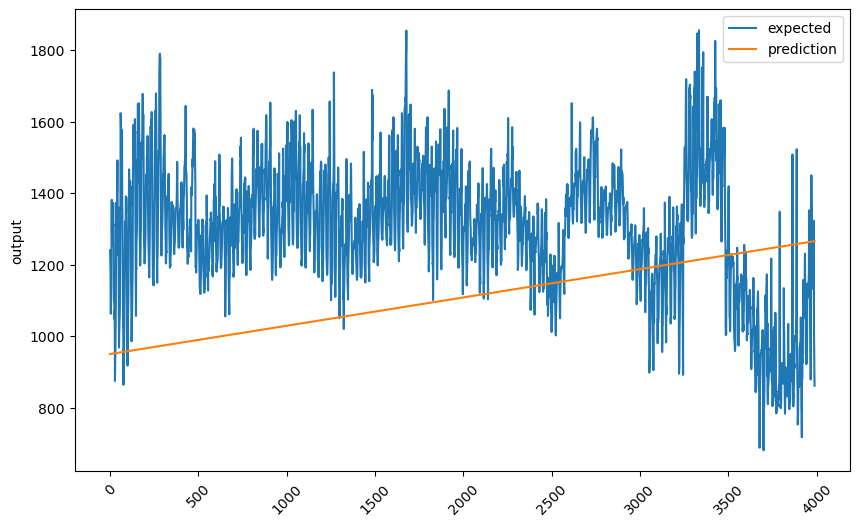

Last 300 values:


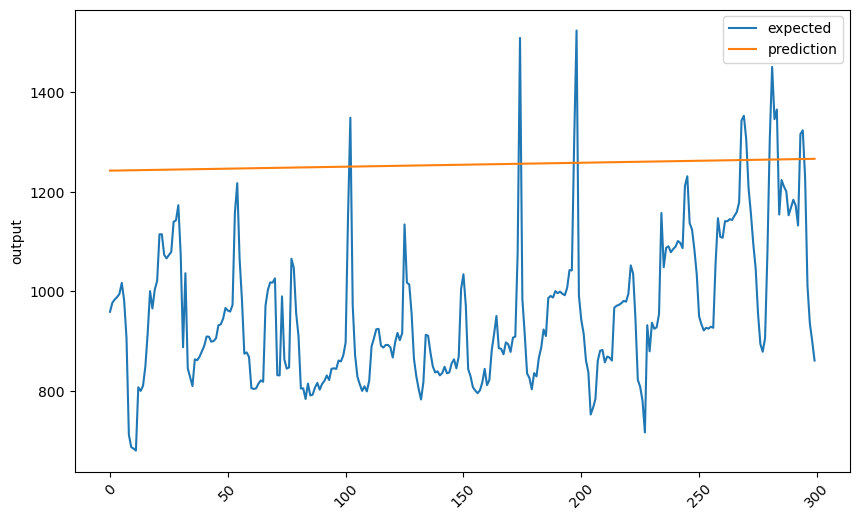

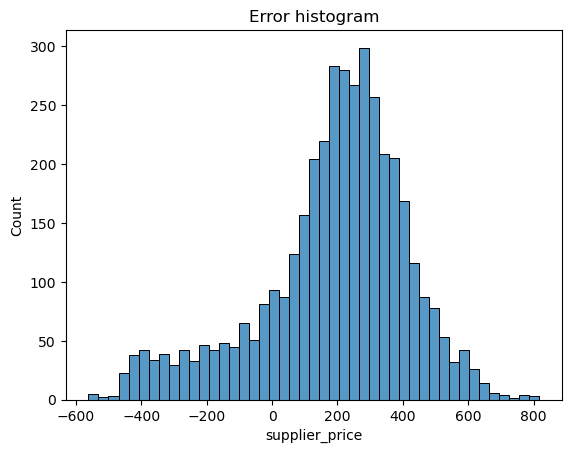

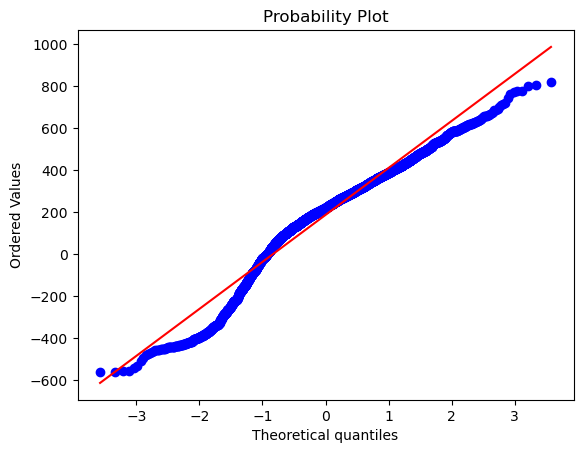

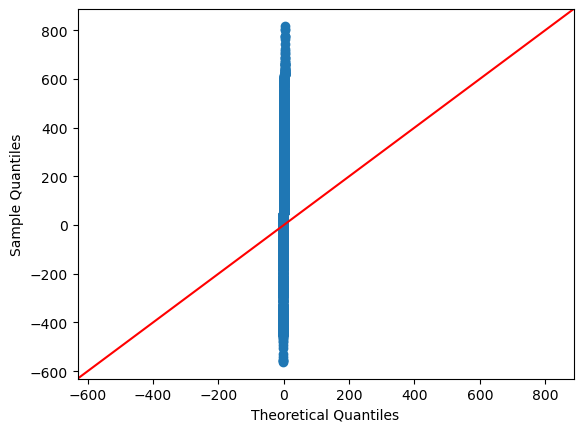

----------
Statistical test for normality of residuals:
----------

D'Agostino & Pearson:  NOT Normal
350.6806577923812

Jarque-Bera:           NOT Normal
452.3173403854416

Kolmogorov-Smirnov:    NOT Normal
0.09273461273477818

Lilliefors:            NOT Normal
0.09273461273477818

Shapiro-Wilk:          NOT Normal
0.9544594287872314

Anderson–Darling:      NOT Normal
61.03226163370937

Done!

----------------
Average model...
Fold #1...
Fold #2...
Fold #3...
Fold #4...
Fold #5...
Fold #6...
Fold #7...
Fold #8...
Fold #9...
Fold #10...


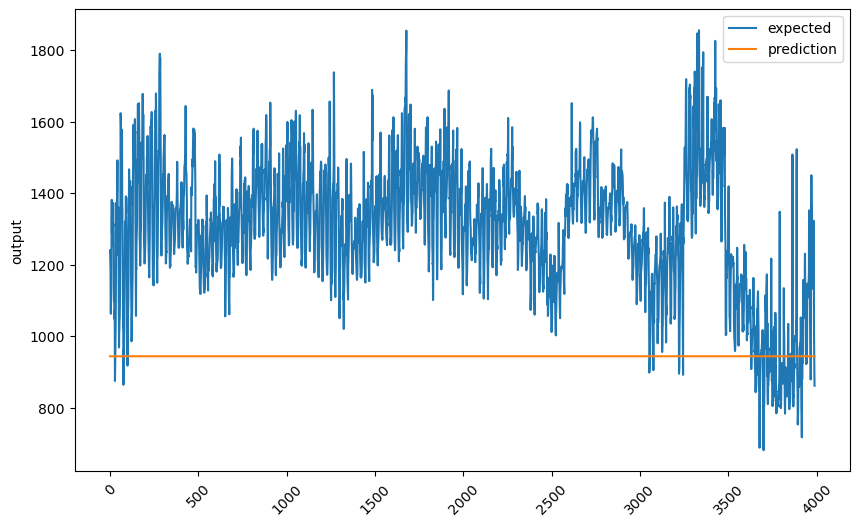

Last 300 values:


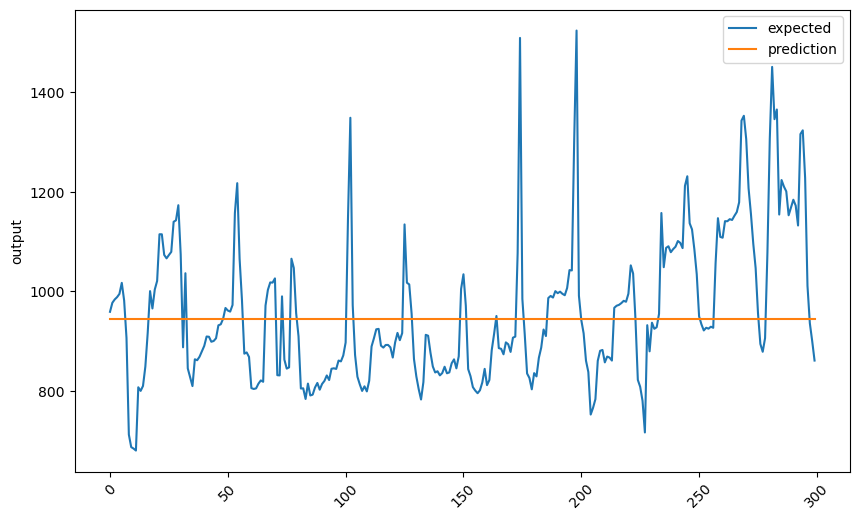

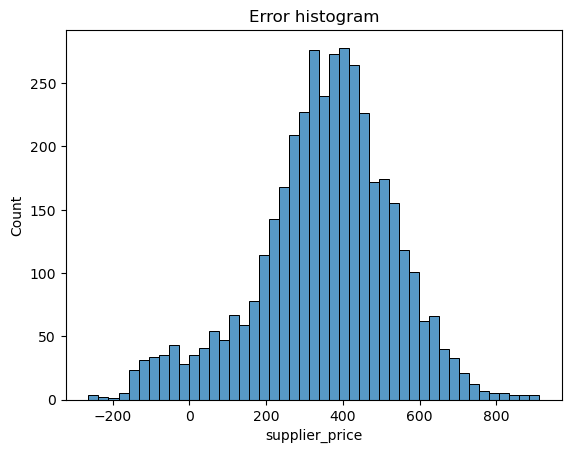

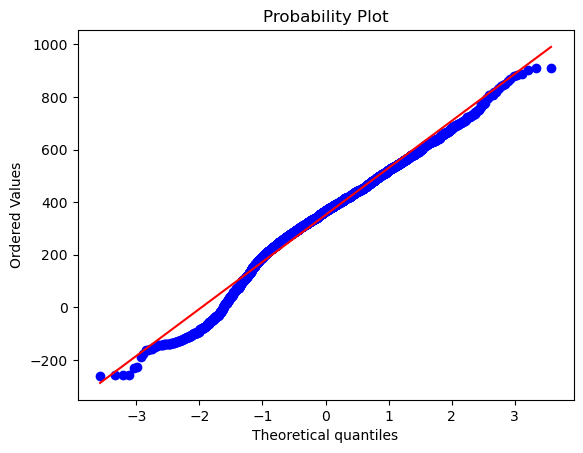

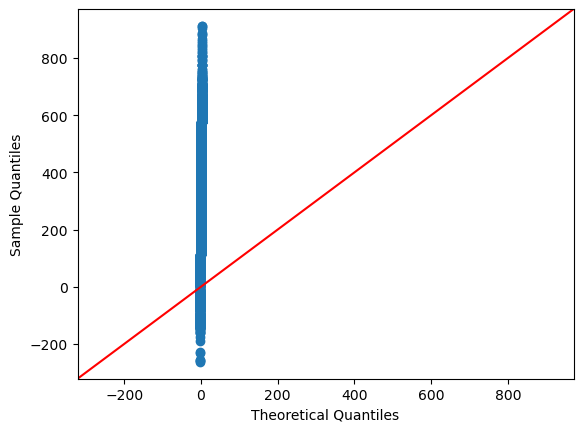

----------
Statistical test for normality of residuals:
----------

D'Agostino & Pearson:  NOT Normal
154.10422573371375

Jarque-Bera:           NOT Normal
178.8932490894559

Kolmogorov-Smirnov:    NOT Normal
0.05401860602165731

Lilliefors:            NOT Normal
0.05401860602165731

Shapiro-Wilk:          NOT Normal
0.9814963340759277

Anderson–Darling:      NOT Normal
22.4632843862546

Done!

----------------
LR model...
Fold #1...
Fold #2...
Fold #3...
Fold #4...
Fold #5...
Fold #6...
Fold #7...
Fold #8...
Fold #9...
Fold #10...


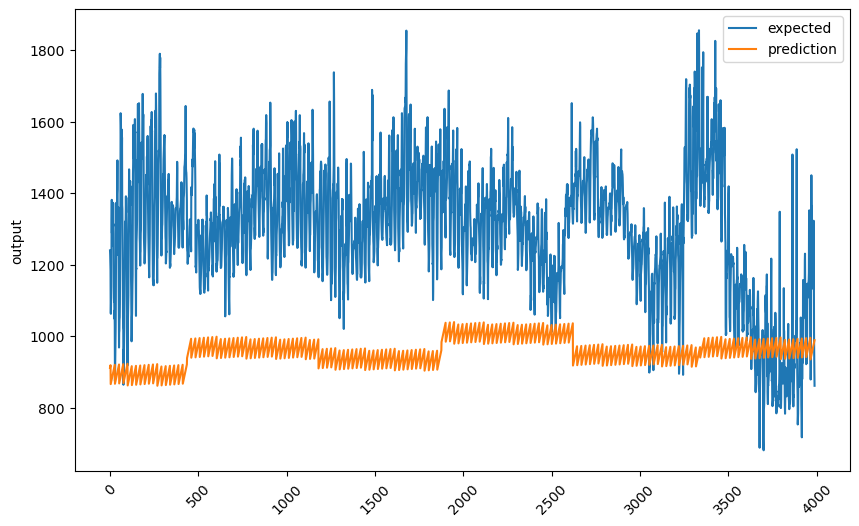

Last 300 values:


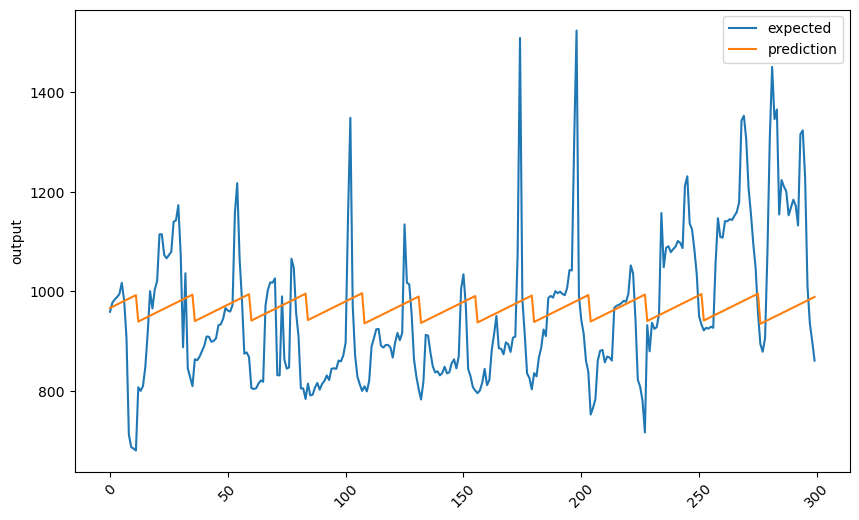

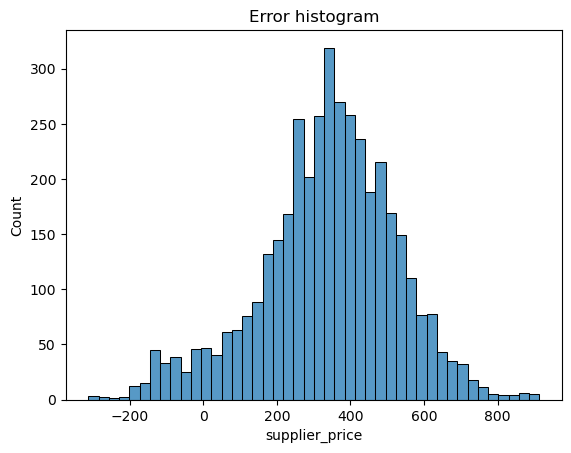

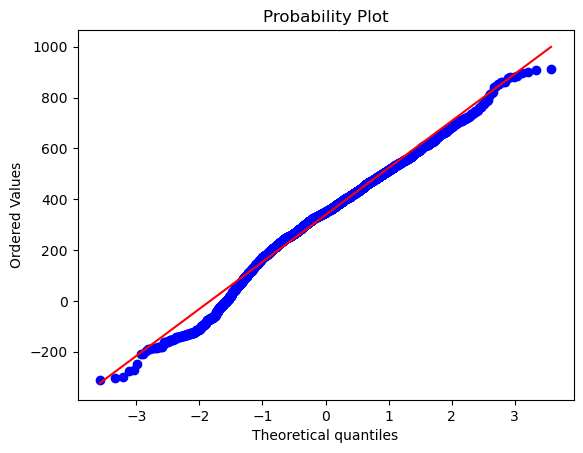

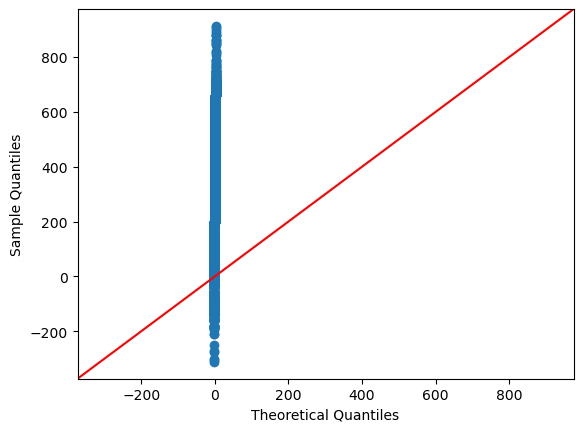

----------
Statistical test for normality of residuals:
----------

D'Agostino & Pearson:  NOT Normal
112.86930551881417

Jarque-Bera:           NOT Normal
126.32045222200841

Kolmogorov-Smirnov:    NOT Normal
0.04806406449829248

Lilliefors:            NOT Normal
0.04806406449829248

Shapiro-Wilk:          NOT Normal
0.9864418506622314

Anderson–Darling:      NOT Normal
16.393855282228287

Done!

----------------
Bayesian R. model...
Fold #1...
Fold #2...
Fold #3...
Fold #4...
Fold #5...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expec

Fold #6...
Fold #7...
Fold #8...
Fold #9...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expec

Fold #10...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


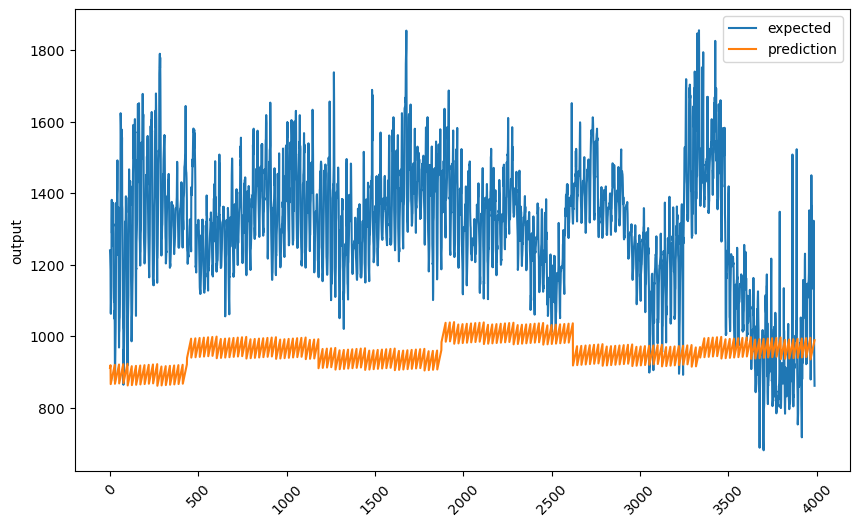

Last 300 values:


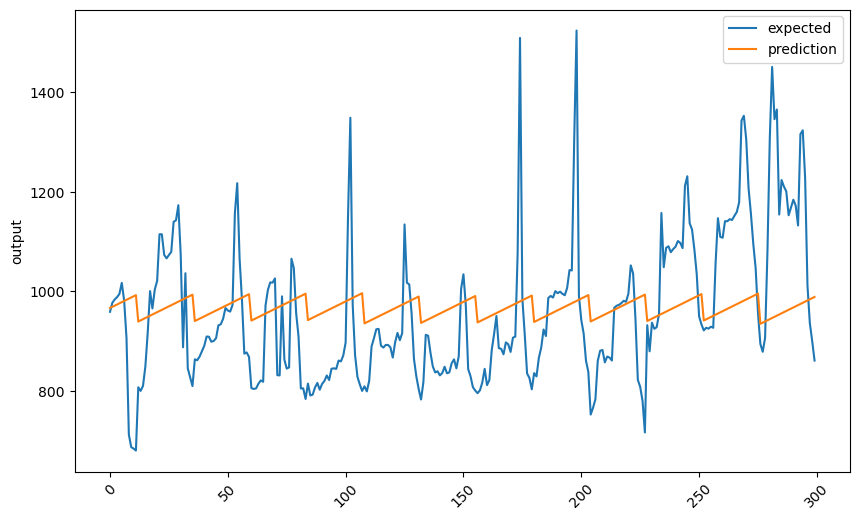

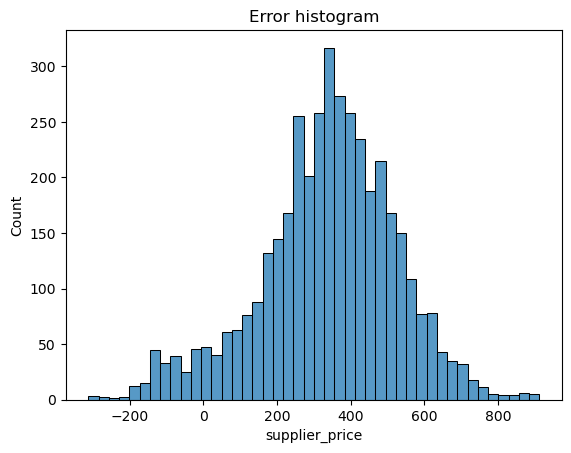

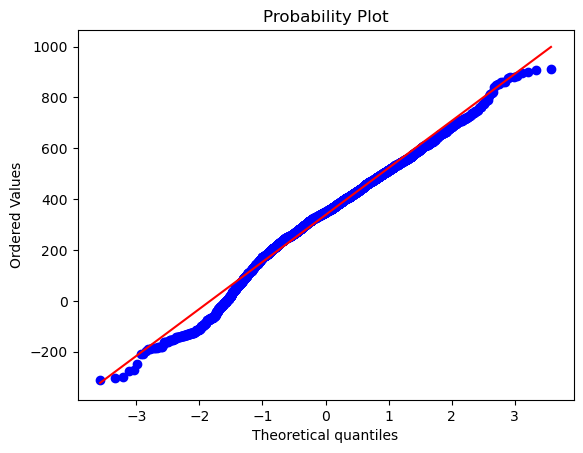

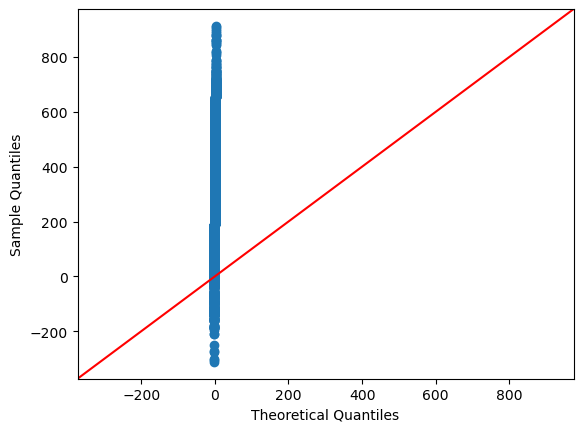

----------
Statistical test for normality of residuals:
----------

D'Agostino & Pearson:  NOT Normal
112.61835198056784

Jarque-Bera:           NOT Normal
126.05326930325043

Kolmogorov-Smirnov:    NOT Normal
0.048273768667718486

Lilliefors:            NOT Normal
0.048273768667718486

Shapiro-Wilk:          NOT Normal
0.9864669442176819

Anderson–Darling:      NOT Normal
16.361679782308784

Done!

----------------
PAR model...
Fold #1...
Fold #2...
Fold #3...
Fold #4...
Fold #5...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expec

Fold #6...
Fold #7...
Fold #8...
Fold #9...
Fold #10...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


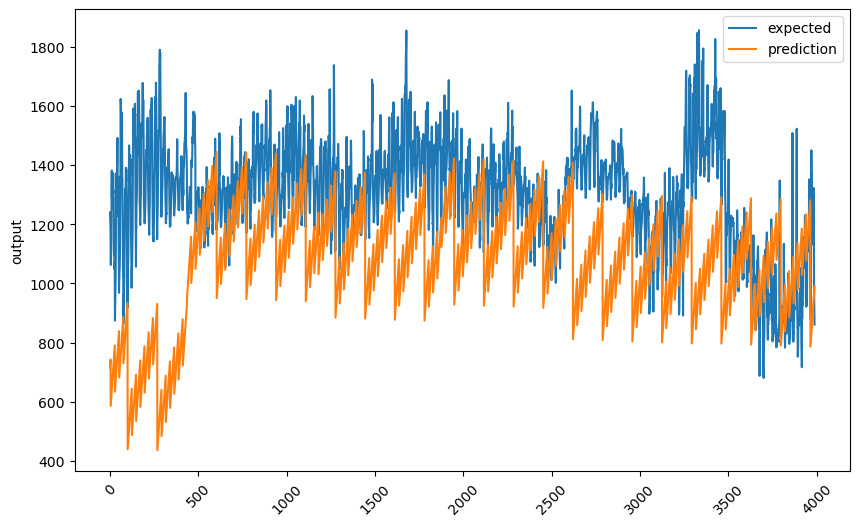

Last 300 values:


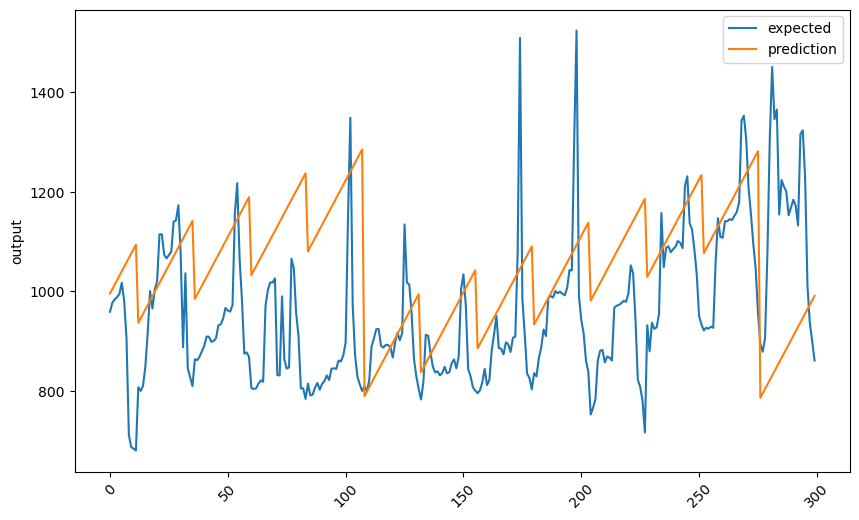

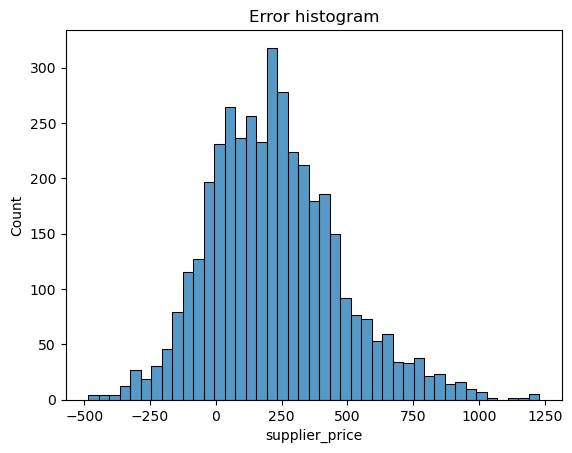

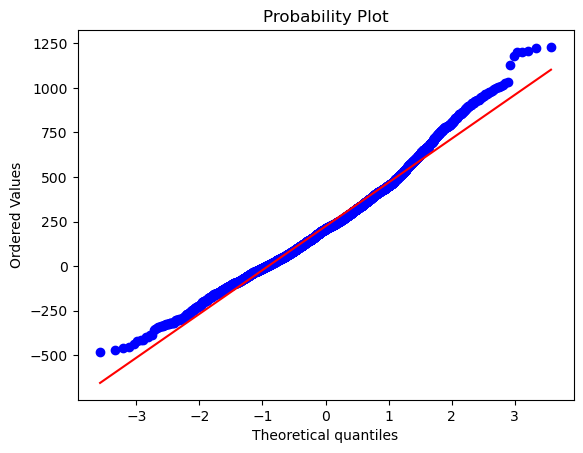

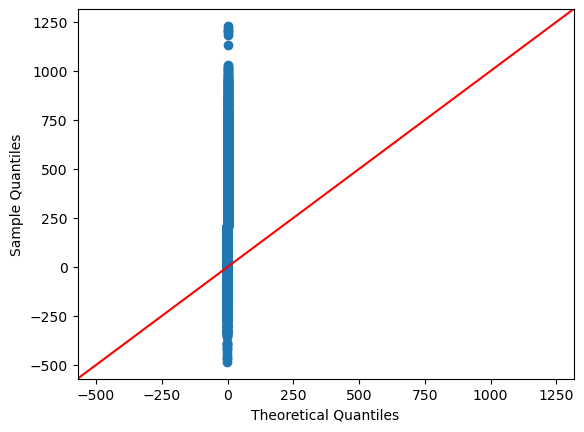

----------
Statistical test for normality of residuals:
----------

D'Agostino & Pearson:  NOT Normal
193.19601489896672

Jarque-Bera:           NOT Normal
230.87139152354794

Kolmogorov-Smirnov:    NOT Normal
0.043430763402865336

Lilliefors:            NOT Normal
0.043430763402865336

Shapiro-Wilk:          NOT Normal
0.9840608835220337

Anderson–Darling:      NOT Normal
15.314424209751905

Done!

----------------
SGD model...
Fold #1...
Fold #2...
Fold #3...
Fold #4...
Fold #5...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expec

Fold #6...
Fold #7...
Fold #8...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Fold #9...
Fold #10...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


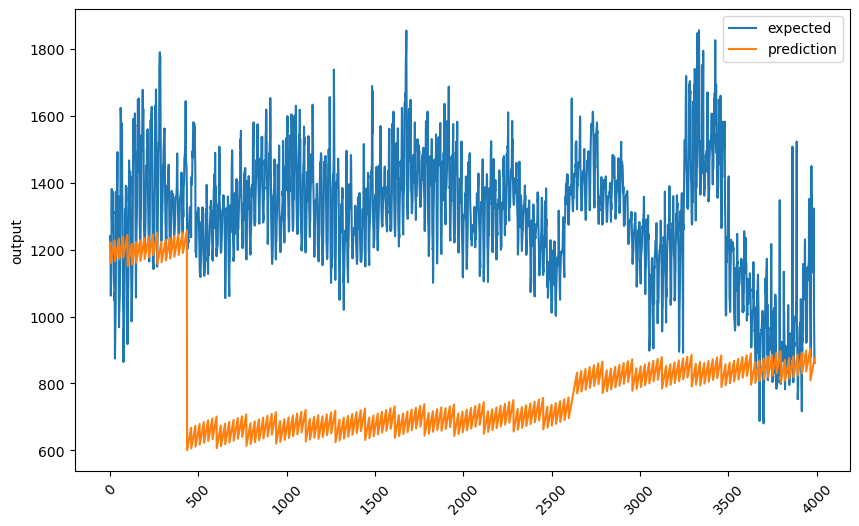

Last 300 values:


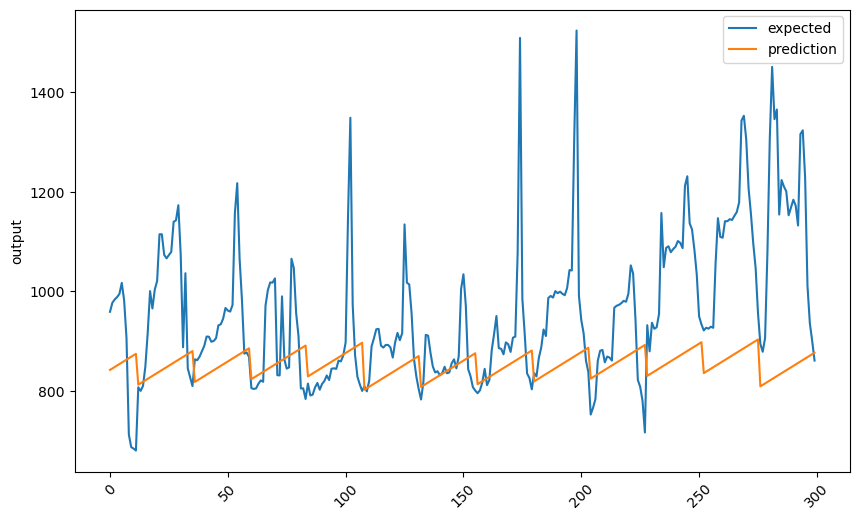

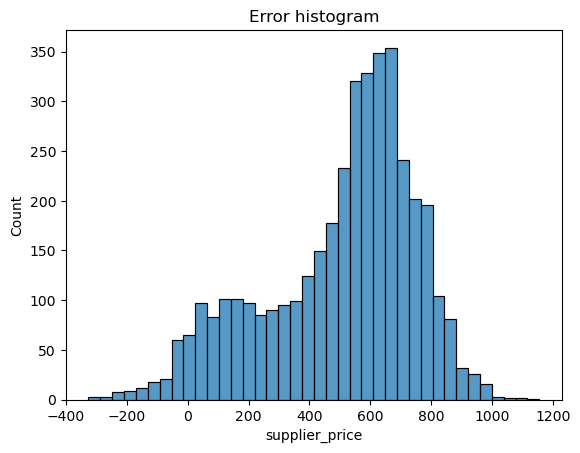

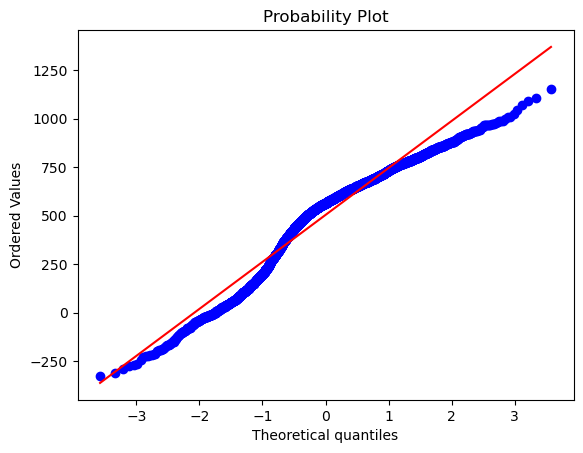

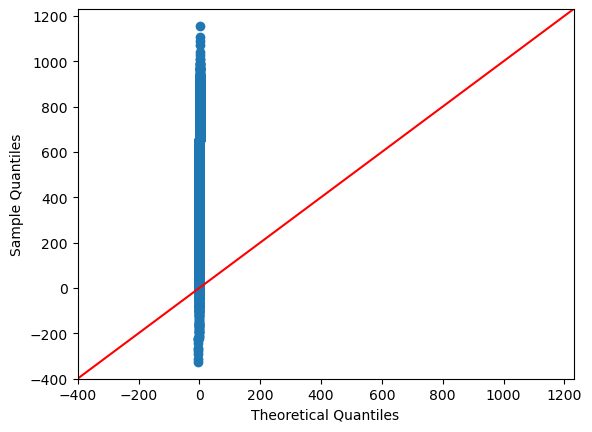

----------
Statistical test for normality of residuals:
----------

D'Agostino & Pearson:  NOT Normal
281.33982120272515

Jarque-Bera:           NOT Normal
341.94470749931594

Kolmogorov-Smirnov:    NOT Normal
0.1133767805643513

Lilliefors:            NOT Normal
0.1133767805643513

Shapiro-Wilk:          NOT Normal
0.9477373361587524

Anderson–Darling:      NOT Normal
81.22077274045569

Done!

----------------
SVR model...
Fold #1...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\svm\_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Fold #2...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\svm\_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Fold #3...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\svm\_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Fold #4...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\svm\_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Fold #5...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\svm\_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Fold #6...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\svm\_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Fold #7...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\svm\_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Fold #8...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\svm\_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Fold #9...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\svm\_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Fold #10...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\svm\_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


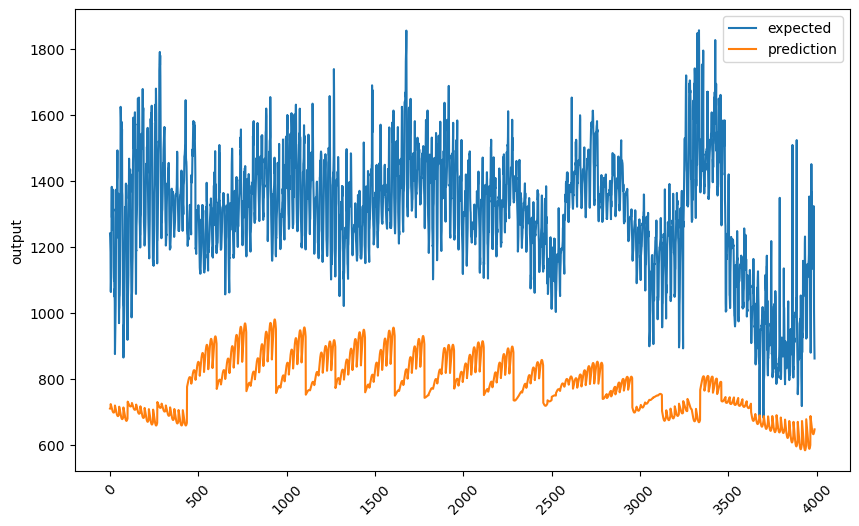

Last 300 values:


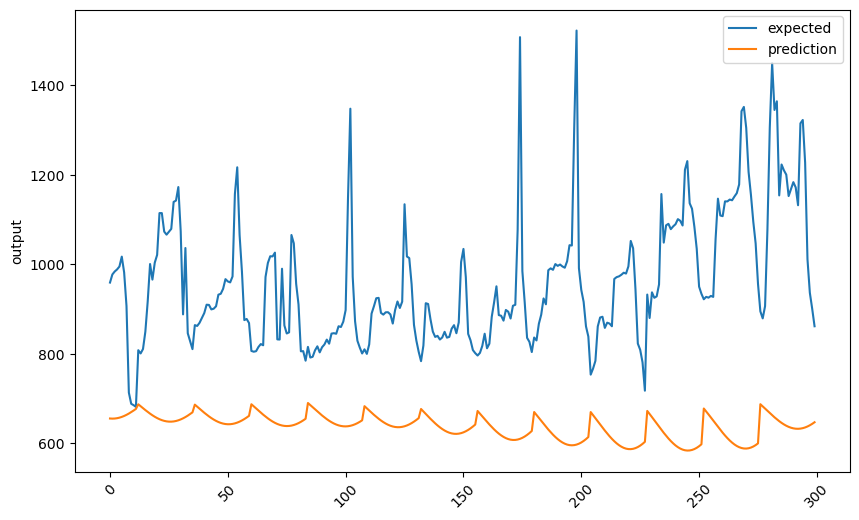

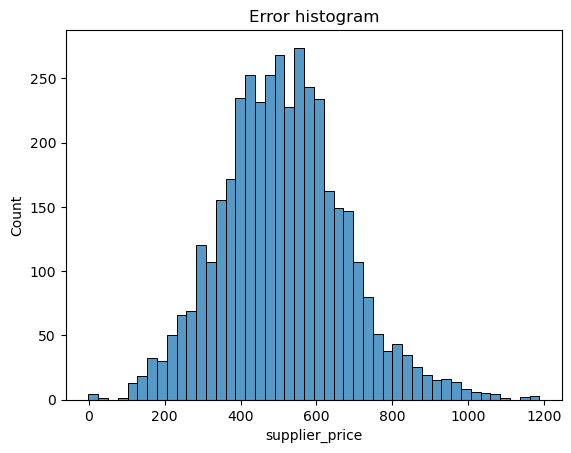

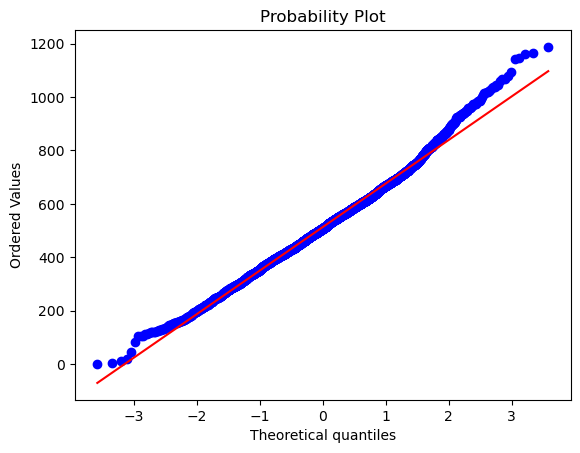

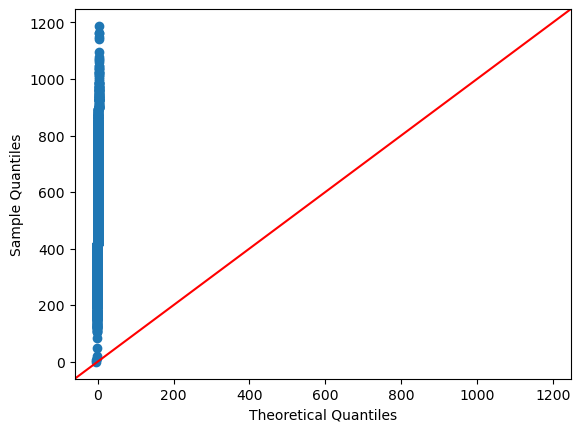

----------
Statistical test for normality of residuals:
----------

D'Agostino & Pearson:  NOT Normal
92.11666889362483

Jarque-Bera:           NOT Normal
108.93376851682726

Kolmogorov-Smirnov:    NOT Normal
0.026603219658895227

Lilliefors:            NOT Normal
0.026603219658895227

Shapiro-Wilk:          NOT Normal
0.9929535984992981

Anderson–Darling:      NOT Normal
4.511565445560336

Done!

----------------
Lin. SVR model...
Fold #1...
Fold #2...
Fold #3...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\svm\_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\svm\_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validat

Fold #4...
Fold #5...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\svm\_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\svm\_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Fold #6...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\svm\_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Fold #7...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\svm\_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Fold #8...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\svm\_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Fold #9...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\svm\_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Fold #10...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\svm\_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


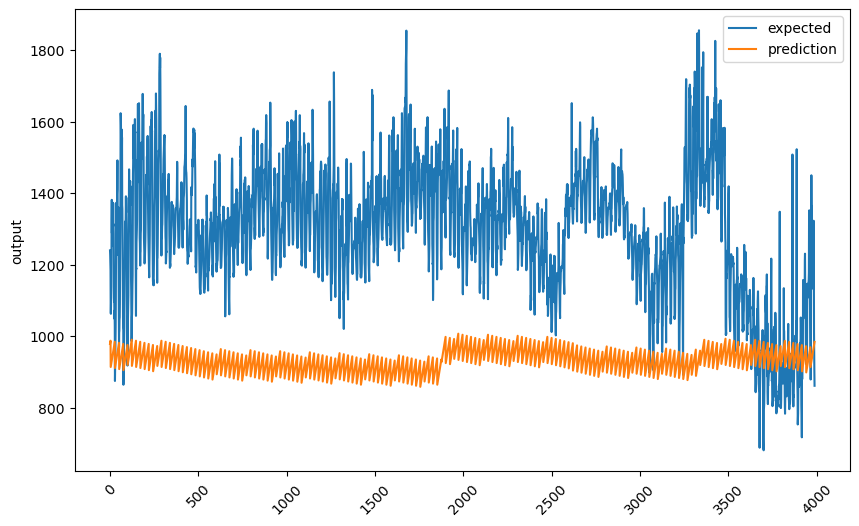

Last 300 values:


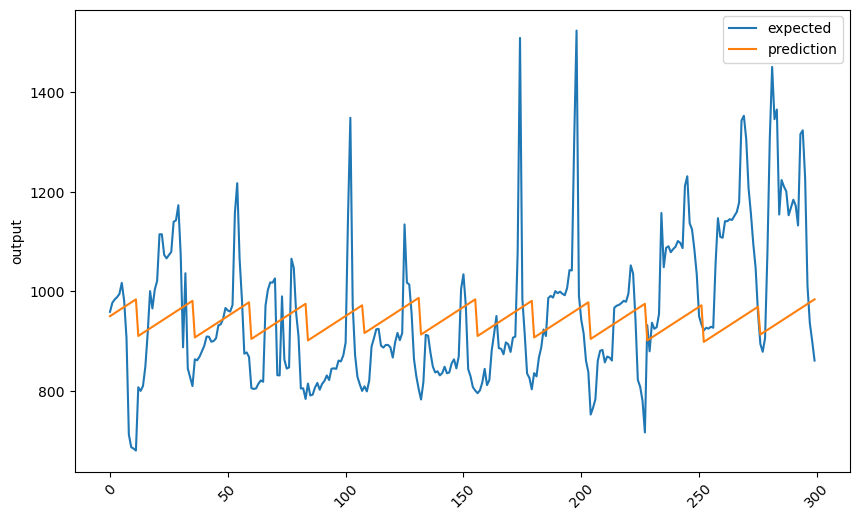

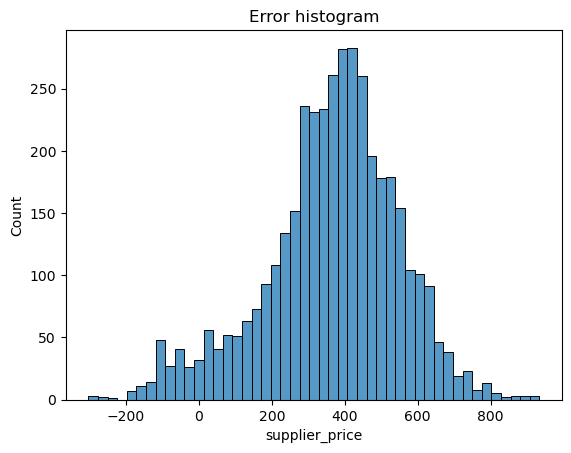

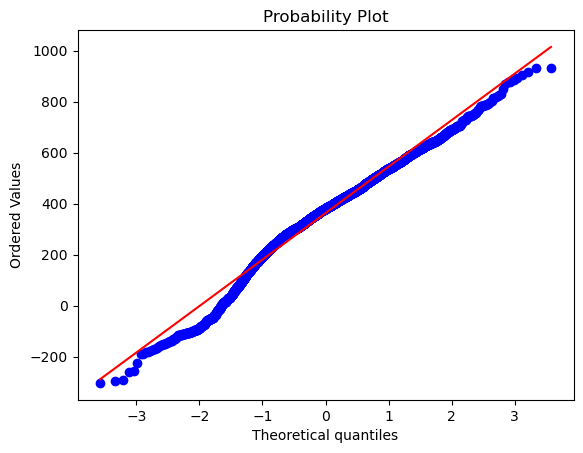

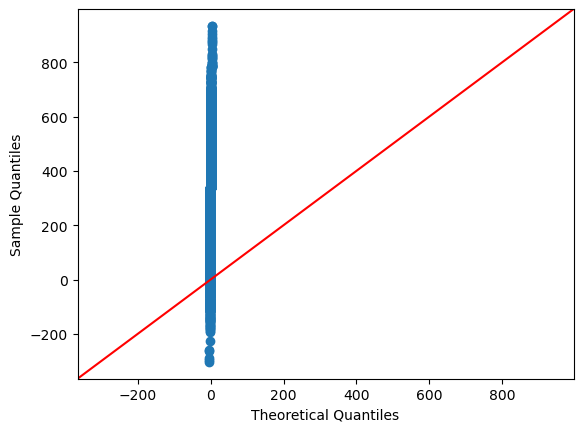

----------
Statistical test for normality of residuals:
----------

D'Agostino & Pearson:  NOT Normal
178.3180602658057

Jarque-Bera:           NOT Normal
207.40039235855545

Kolmogorov-Smirnov:    NOT Normal
0.059529167742021716

Lilliefors:            NOT Normal
0.059529167742021716

Shapiro-Wilk:          NOT Normal
0.9798002243041992

Anderson–Darling:      NOT Normal
25.07696896595735

Done!

----------------
KNN model...
Fold #1...
Fold #2...
Fold #3...
Fold #4...
Fold #5...
Fold #6...
Fold #7...
Fold #8...
Fold #9...
Fold #10...


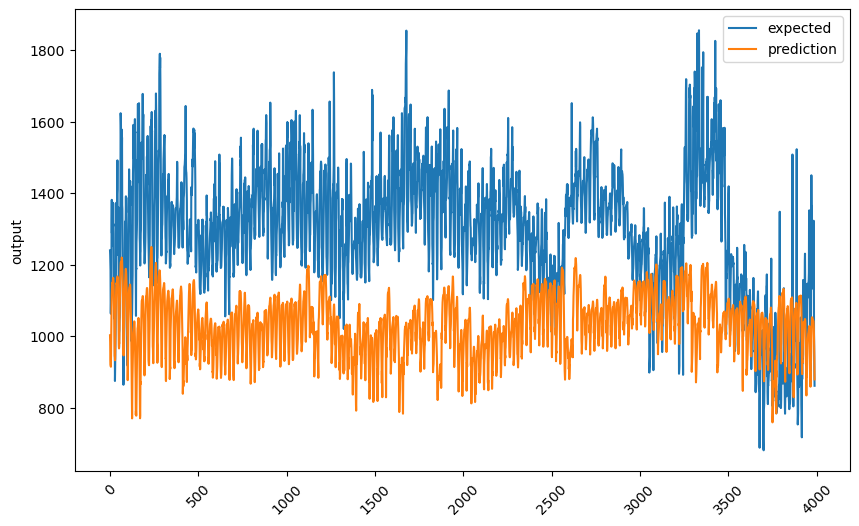

Last 300 values:


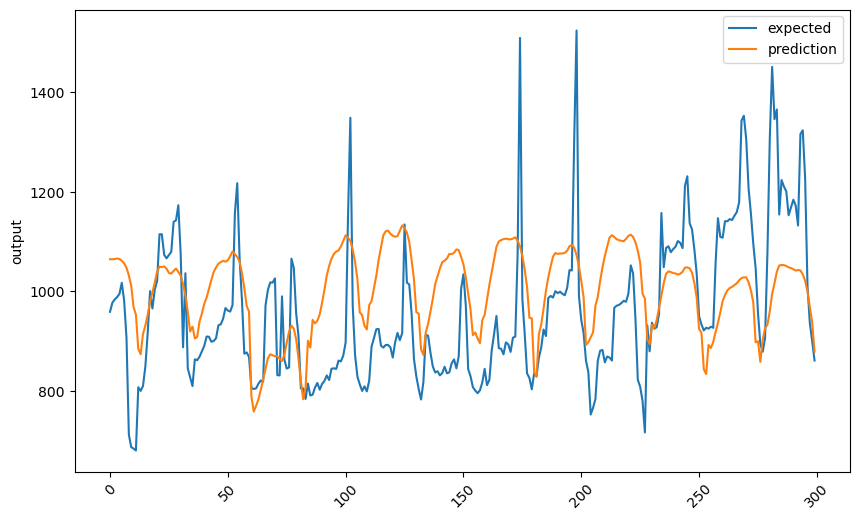

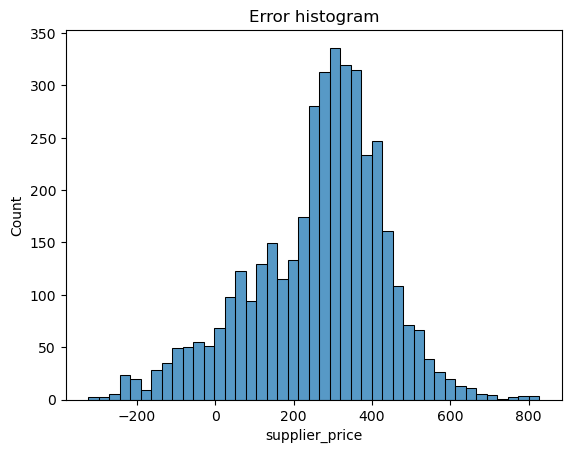

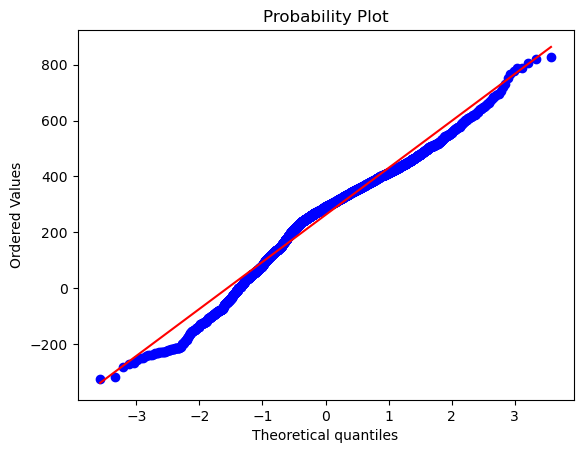

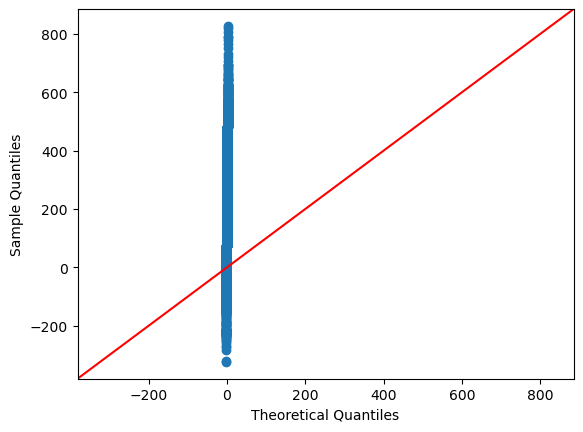

----------
Statistical test for normality of residuals:
----------

D'Agostino & Pearson:  NOT Normal
198.93323051047113

Jarque-Bera:           NOT Normal
230.25316029489883

Kolmogorov-Smirnov:    NOT Normal
0.09014542396292197

Lilliefors:            NOT Normal
0.09014542396292197

Shapiro-Wilk:          NOT Normal
0.9725201725959778

Anderson–Darling:      NOT Normal
42.59496917053002

Done!

----------------
CART model...
Fold #1...
Fold #2...
Fold #3...
Fold #4...
Fold #5...
Fold #6...
Fold #7...
Fold #8...
Fold #9...
Fold #10...


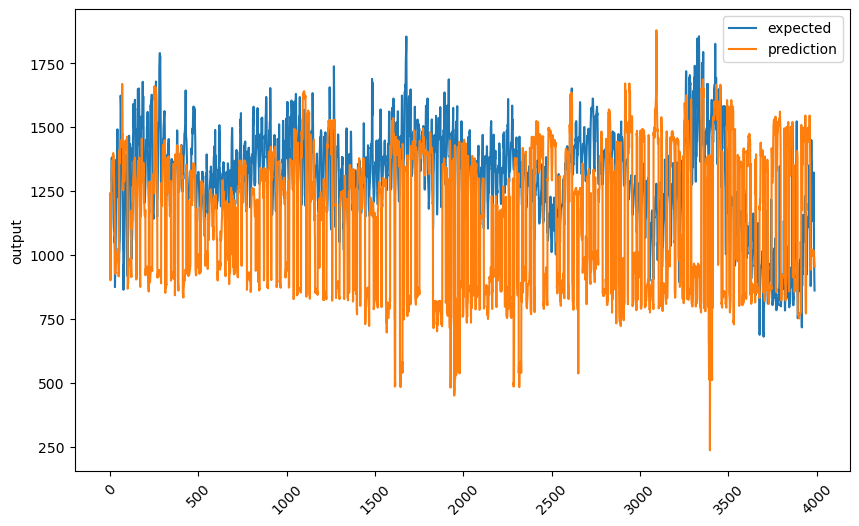

Last 300 values:


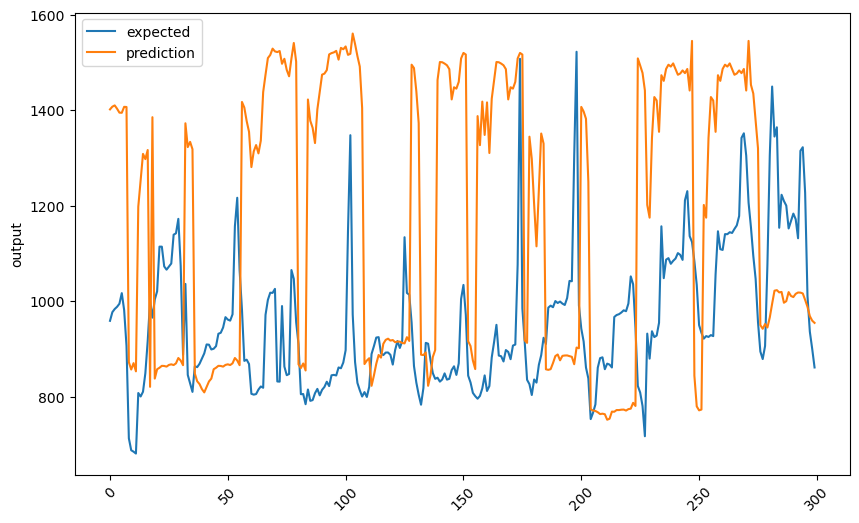

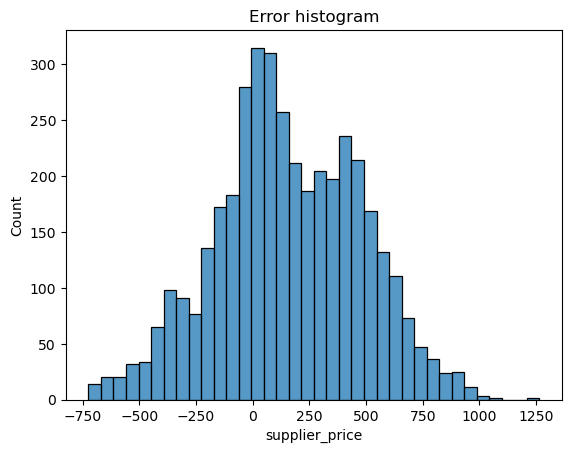

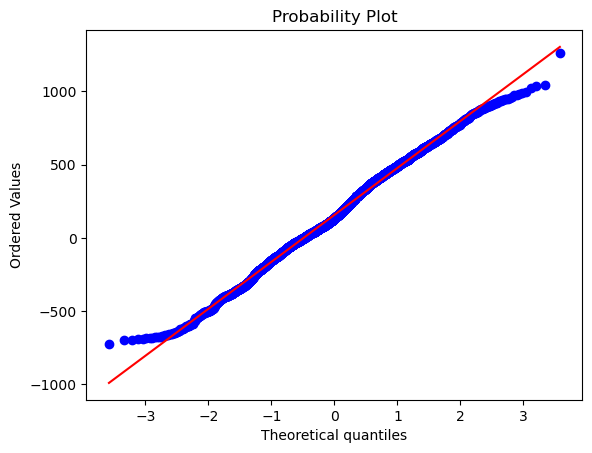

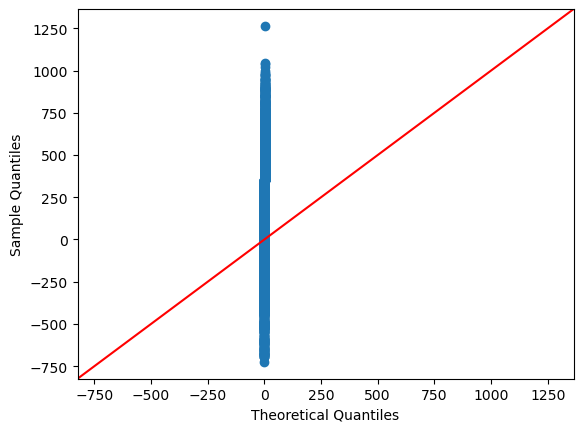

----------
Statistical test for normality of residuals:
----------

D'Agostino & Pearson:  NOT Normal
21.915677989955586

Jarque-Bera:           NOT Normal
16.117900687252014

Kolmogorov-Smirnov:    NOT Normal
0.030622809287486008

Lilliefors:            NOT Normal
0.030622809287486008

Shapiro-Wilk:          NOT Normal
0.9963813424110413

Anderson–Darling:      NOT Normal
4.650165495511828

Done!

----------------
RF model...
Fold #1...


C:\Users\dexp\AppData\Local\Temp\ipykernel_12640\3214319755.py:27: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(x_train, y_train)


Fold #2...


C:\Users\dexp\AppData\Local\Temp\ipykernel_12640\3214319755.py:27: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(x_train, y_train)


Fold #3...


C:\Users\dexp\AppData\Local\Temp\ipykernel_12640\3214319755.py:27: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(x_train, y_train)


Fold #4...


C:\Users\dexp\AppData\Local\Temp\ipykernel_12640\3214319755.py:27: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(x_train, y_train)


Fold #5...


C:\Users\dexp\AppData\Local\Temp\ipykernel_12640\3214319755.py:27: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(x_train, y_train)


Fold #6...


C:\Users\dexp\AppData\Local\Temp\ipykernel_12640\3214319755.py:27: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(x_train, y_train)


Fold #7...


C:\Users\dexp\AppData\Local\Temp\ipykernel_12640\3214319755.py:27: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(x_train, y_train)


Fold #8...


C:\Users\dexp\AppData\Local\Temp\ipykernel_12640\3214319755.py:27: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(x_train, y_train)


Fold #9...


C:\Users\dexp\AppData\Local\Temp\ipykernel_12640\3214319755.py:27: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(x_train, y_train)


Fold #10...


C:\Users\dexp\AppData\Local\Temp\ipykernel_12640\3214319755.py:27: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(x_train, y_train)


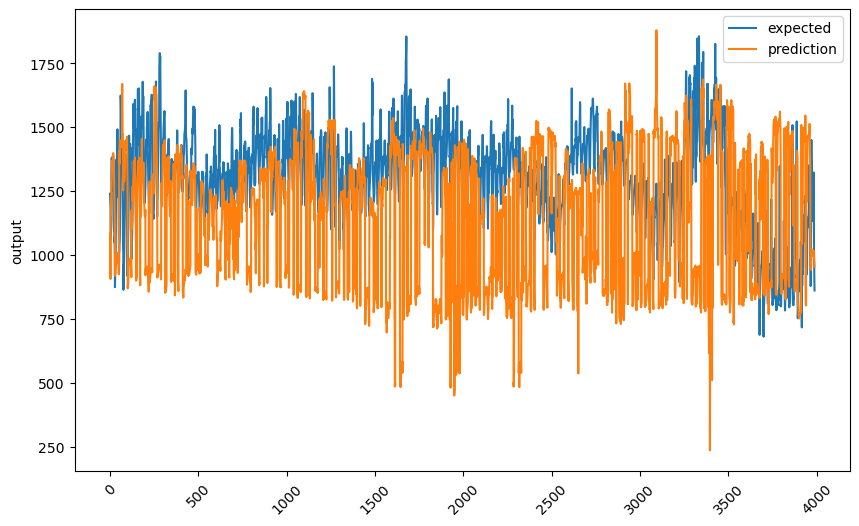

Last 300 values:


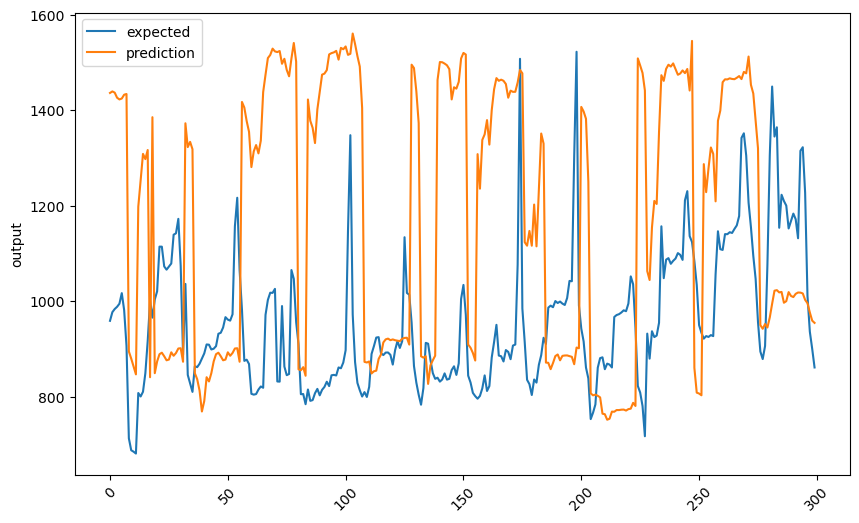

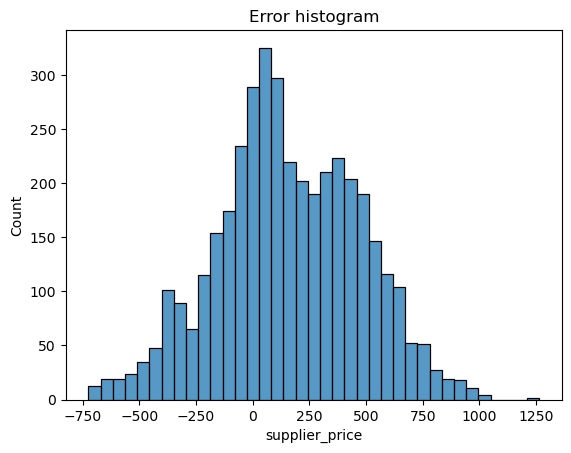

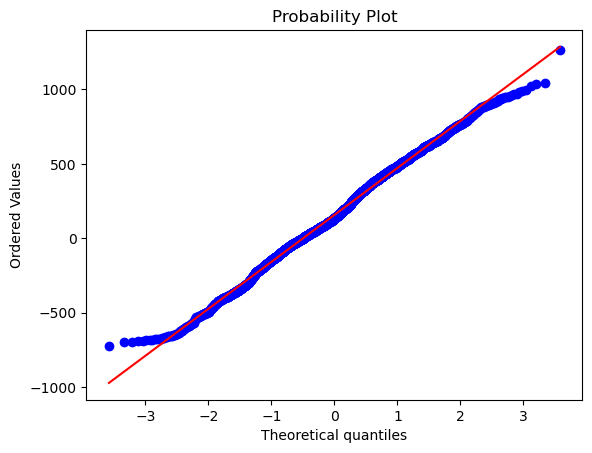

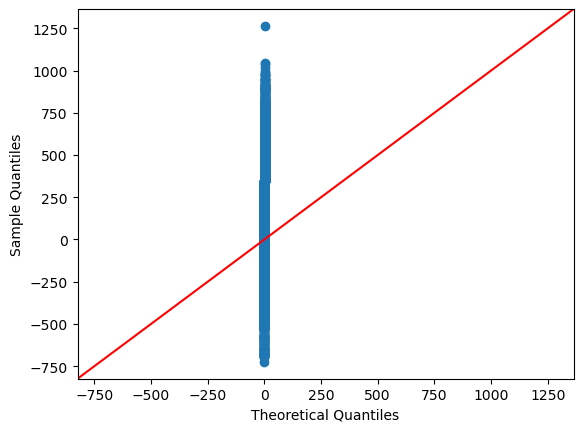

----------
Statistical test for normality of residuals:
----------

D'Agostino & Pearson:  NOT Normal
14.760971038677337

Jarque-Bera:           NOT Normal
11.690098674650676

Kolmogorov-Smirnov:    NOT Normal
0.030002406231496026

Lilliefors:            NOT Normal
0.030002406231496026

Shapiro-Wilk:          NOT Normal
0.9966728687286377

Anderson–Darling:      NOT Normal
4.445621356820084

Done!

----------------
RF w/Bootstrap model...
Fold #1...


C:\Users\dexp\AppData\Local\Temp\ipykernel_12640\3214319755.py:27: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(x_train, y_train)


Fold #2...


C:\Users\dexp\AppData\Local\Temp\ipykernel_12640\3214319755.py:27: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(x_train, y_train)


Fold #3...


C:\Users\dexp\AppData\Local\Temp\ipykernel_12640\3214319755.py:27: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(x_train, y_train)


Fold #4...


C:\Users\dexp\AppData\Local\Temp\ipykernel_12640\3214319755.py:27: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(x_train, y_train)


Fold #5...


C:\Users\dexp\AppData\Local\Temp\ipykernel_12640\3214319755.py:27: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(x_train, y_train)


Fold #6...


C:\Users\dexp\AppData\Local\Temp\ipykernel_12640\3214319755.py:27: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(x_train, y_train)


Fold #7...


C:\Users\dexp\AppData\Local\Temp\ipykernel_12640\3214319755.py:27: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(x_train, y_train)


Fold #8...


C:\Users\dexp\AppData\Local\Temp\ipykernel_12640\3214319755.py:27: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(x_train, y_train)


Fold #9...


C:\Users\dexp\AppData\Local\Temp\ipykernel_12640\3214319755.py:27: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(x_train, y_train)


Fold #10...


C:\Users\dexp\AppData\Local\Temp\ipykernel_12640\3214319755.py:27: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(x_train, y_train)


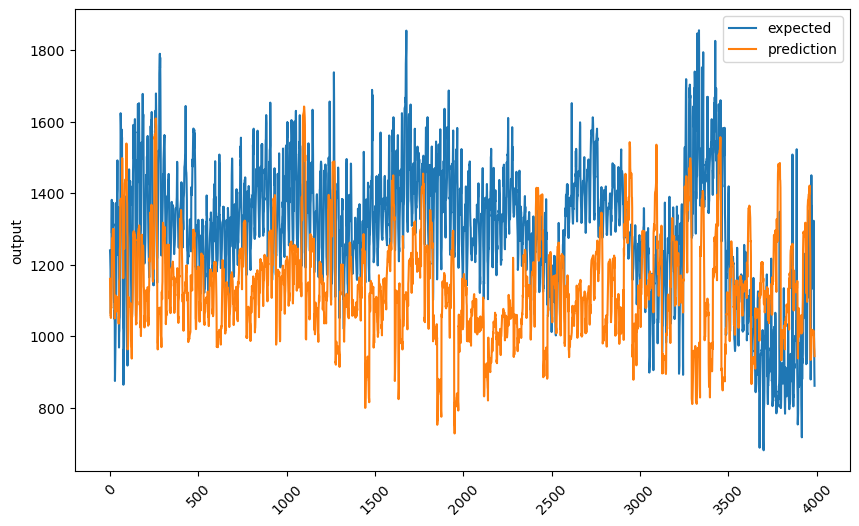

Last 300 values:


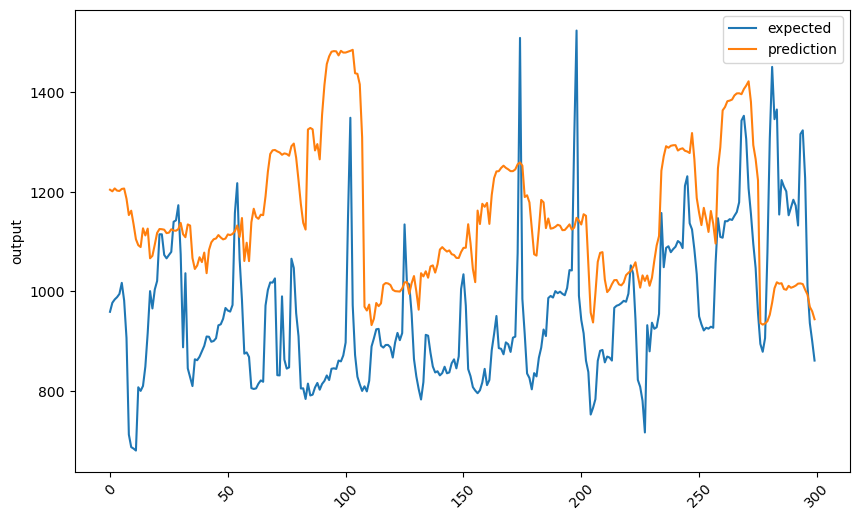

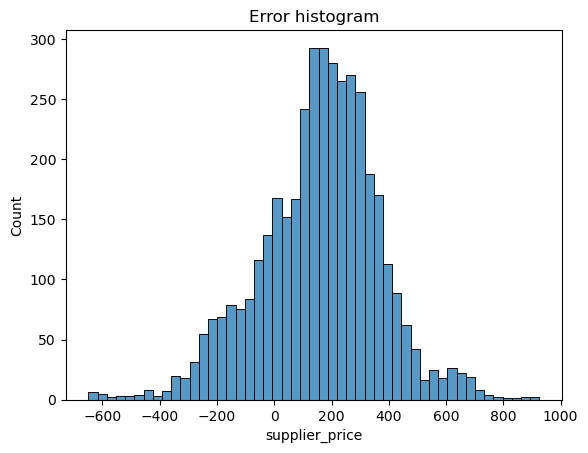

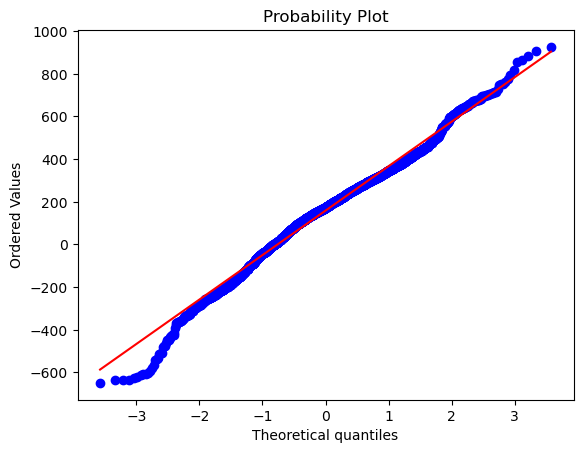

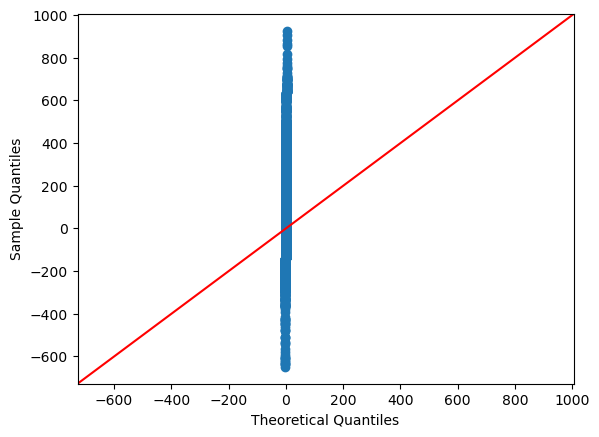

----------
Statistical test for normality of residuals:
----------

D'Agostino & Pearson:  NOT Normal
101.64192988577912

Jarque-Bera:           NOT Normal
141.5365514952449

Kolmogorov-Smirnov:    NOT Normal
0.0518156227239408

Lilliefors:            NOT Normal
0.0518156227239408

Shapiro-Wilk:          NOT Normal
0.9882500171661377

Anderson–Darling:      NOT Normal
15.782204331142111

Done!

----------------
XT model...
Fold #1...


C:\Users\dexp\AppData\Local\Temp\ipykernel_12640\3214319755.py:27: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(x_train, y_train)


Fold #2...


C:\Users\dexp\AppData\Local\Temp\ipykernel_12640\3214319755.py:27: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(x_train, y_train)


Fold #3...


C:\Users\dexp\AppData\Local\Temp\ipykernel_12640\3214319755.py:27: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(x_train, y_train)


Fold #4...


C:\Users\dexp\AppData\Local\Temp\ipykernel_12640\3214319755.py:27: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(x_train, y_train)


Fold #5...


C:\Users\dexp\AppData\Local\Temp\ipykernel_12640\3214319755.py:27: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(x_train, y_train)


Fold #6...


C:\Users\dexp\AppData\Local\Temp\ipykernel_12640\3214319755.py:27: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(x_train, y_train)


Fold #7...


C:\Users\dexp\AppData\Local\Temp\ipykernel_12640\3214319755.py:27: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(x_train, y_train)


Fold #8...


C:\Users\dexp\AppData\Local\Temp\ipykernel_12640\3214319755.py:27: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(x_train, y_train)


Fold #9...


C:\Users\dexp\AppData\Local\Temp\ipykernel_12640\3214319755.py:27: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(x_train, y_train)


Fold #10...


C:\Users\dexp\AppData\Local\Temp\ipykernel_12640\3214319755.py:27: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(x_train, y_train)


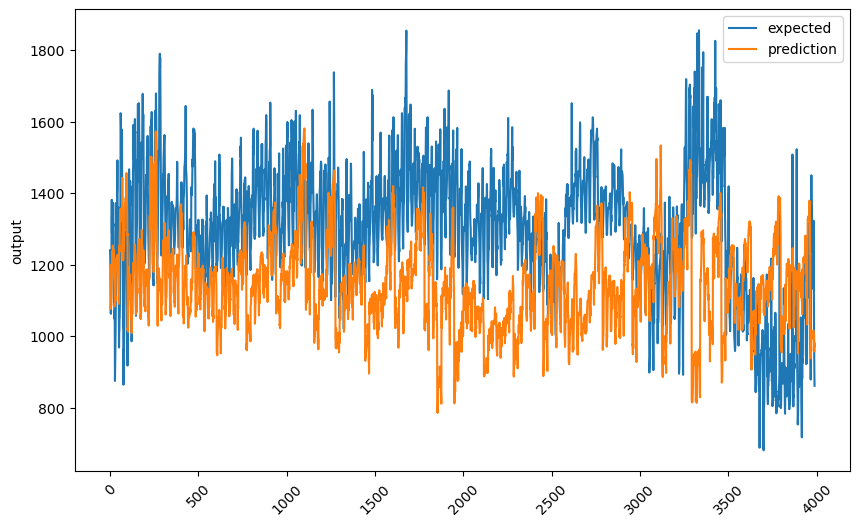

Last 300 values:


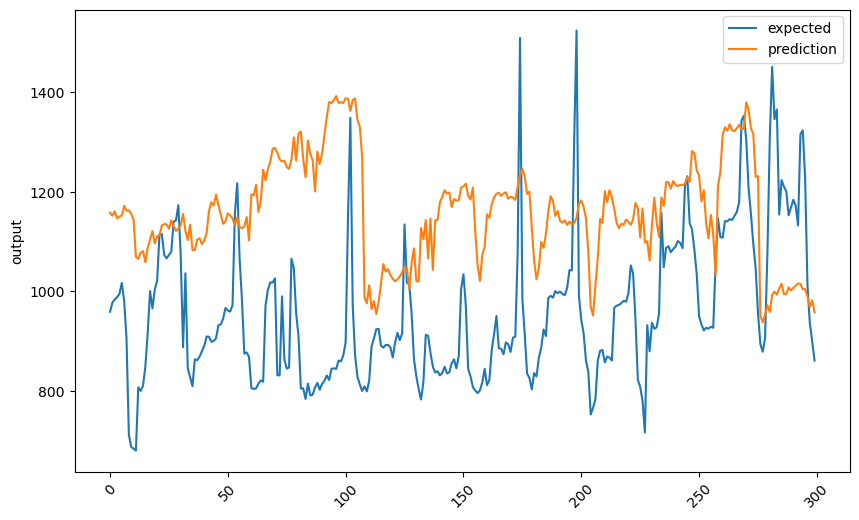

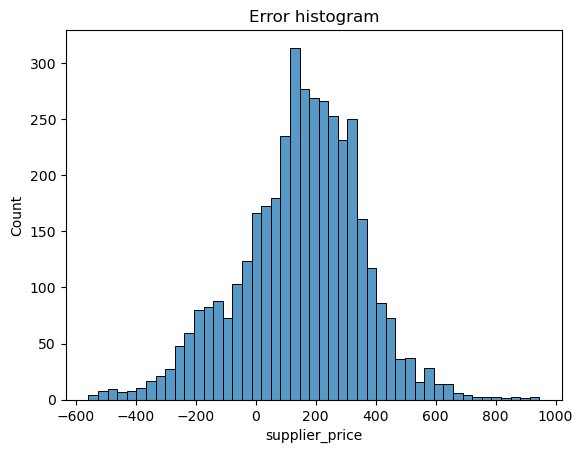

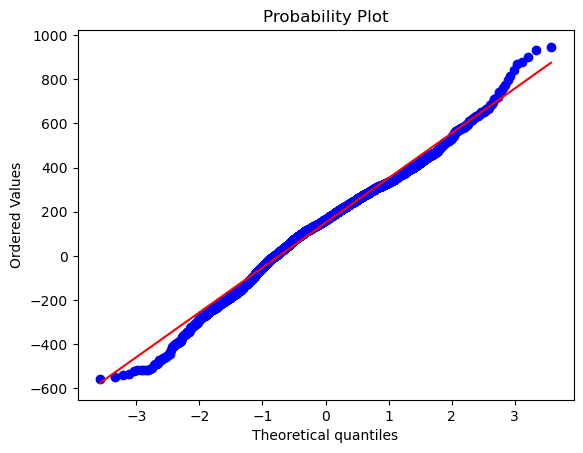

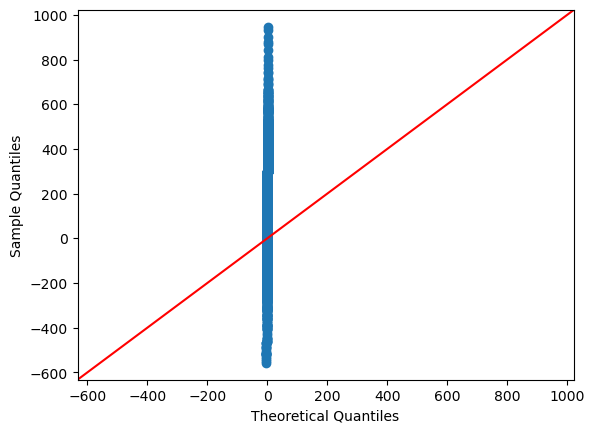

----------
Statistical test for normality of residuals:
----------

D'Agostino & Pearson:  NOT Normal
86.83626120158553

Jarque-Bera:           NOT Normal
105.41978715959023

Kolmogorov-Smirnov:    NOT Normal
0.0519905265713127

Lilliefors:            NOT Normal
0.0519905265713127

Shapiro-Wilk:          NOT Normal
0.9892256259918213

Anderson–Darling:      NOT Normal
14.872459413564684

Done!

----------------
XT w/Bootstrap model...
Fold #1...


C:\Users\dexp\AppData\Local\Temp\ipykernel_12640\3214319755.py:27: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(x_train, y_train)


Fold #2...


C:\Users\dexp\AppData\Local\Temp\ipykernel_12640\3214319755.py:27: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(x_train, y_train)


Fold #3...


C:\Users\dexp\AppData\Local\Temp\ipykernel_12640\3214319755.py:27: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(x_train, y_train)


Fold #4...


C:\Users\dexp\AppData\Local\Temp\ipykernel_12640\3214319755.py:27: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(x_train, y_train)


Fold #5...


C:\Users\dexp\AppData\Local\Temp\ipykernel_12640\3214319755.py:27: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(x_train, y_train)


Fold #6...


C:\Users\dexp\AppData\Local\Temp\ipykernel_12640\3214319755.py:27: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(x_train, y_train)


Fold #7...


C:\Users\dexp\AppData\Local\Temp\ipykernel_12640\3214319755.py:27: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(x_train, y_train)


Fold #8...


C:\Users\dexp\AppData\Local\Temp\ipykernel_12640\3214319755.py:27: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(x_train, y_train)


Fold #9...


C:\Users\dexp\AppData\Local\Temp\ipykernel_12640\3214319755.py:27: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(x_train, y_train)


Fold #10...


C:\Users\dexp\AppData\Local\Temp\ipykernel_12640\3214319755.py:27: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(x_train, y_train)


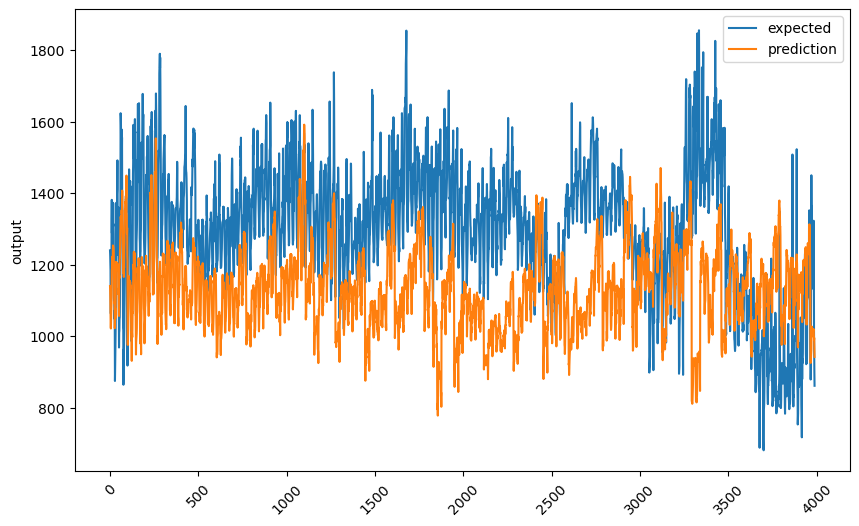

Last 300 values:


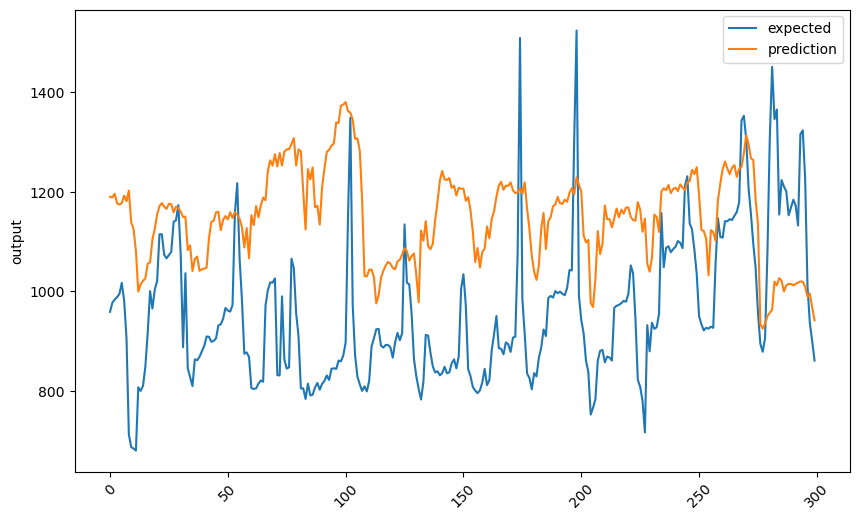

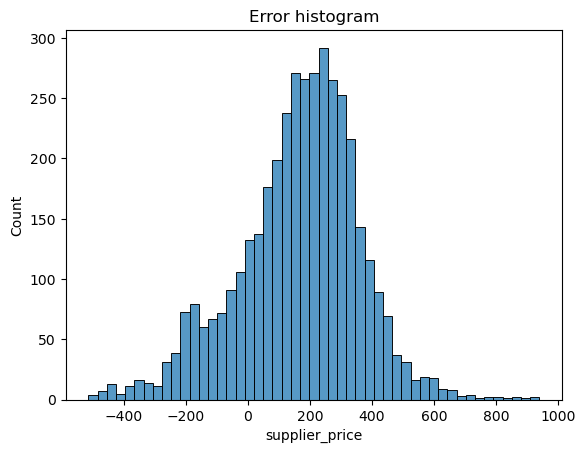

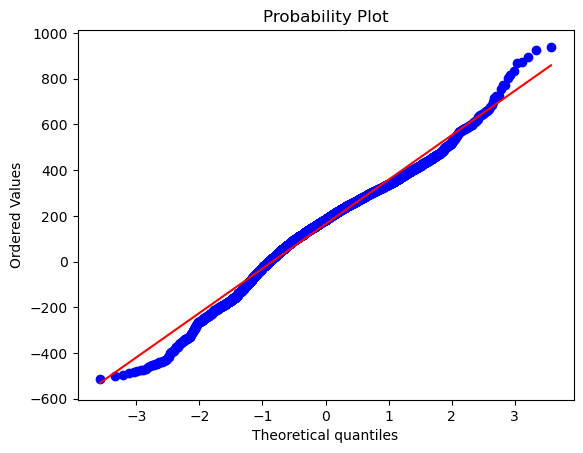

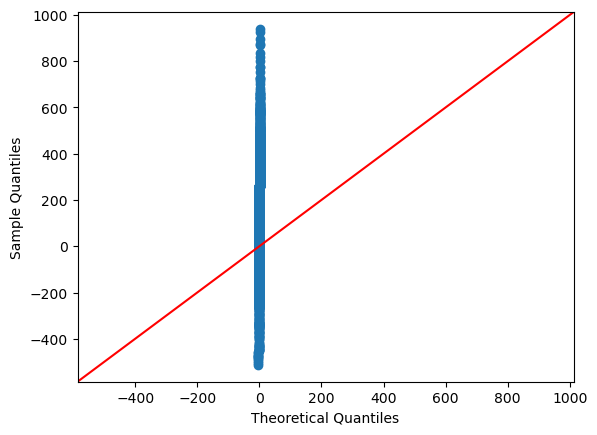

----------
Statistical test for normality of residuals:
----------

D'Agostino & Pearson:  NOT Normal
129.70678842882694

Jarque-Bera:           NOT Normal
162.15342178027973

Kolmogorov-Smirnov:    NOT Normal
0.05463730068872069

Lilliefors:            NOT Normal
0.05463730068872069

Shapiro-Wilk:          NOT Normal
0.9835306406021118

Anderson–Darling:      NOT Normal
22.883451631882053

Done!

----------------
BAG model...
Fold #1...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\ensemble\_bagging.py:508: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return column_or_1d(y, warn=True)


Fold #2...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\ensemble\_bagging.py:508: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return column_or_1d(y, warn=True)


Fold #3...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\ensemble\_bagging.py:508: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return column_or_1d(y, warn=True)


Fold #4...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\ensemble\_bagging.py:508: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return column_or_1d(y, warn=True)


Fold #5...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\ensemble\_bagging.py:508: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return column_or_1d(y, warn=True)


Fold #6...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\ensemble\_bagging.py:508: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return column_or_1d(y, warn=True)


Fold #7...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\ensemble\_bagging.py:508: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return column_or_1d(y, warn=True)


Fold #8...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\ensemble\_bagging.py:508: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return column_or_1d(y, warn=True)


Fold #9...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\ensemble\_bagging.py:508: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return column_or_1d(y, warn=True)


Fold #10...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\ensemble\_bagging.py:508: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return column_or_1d(y, warn=True)


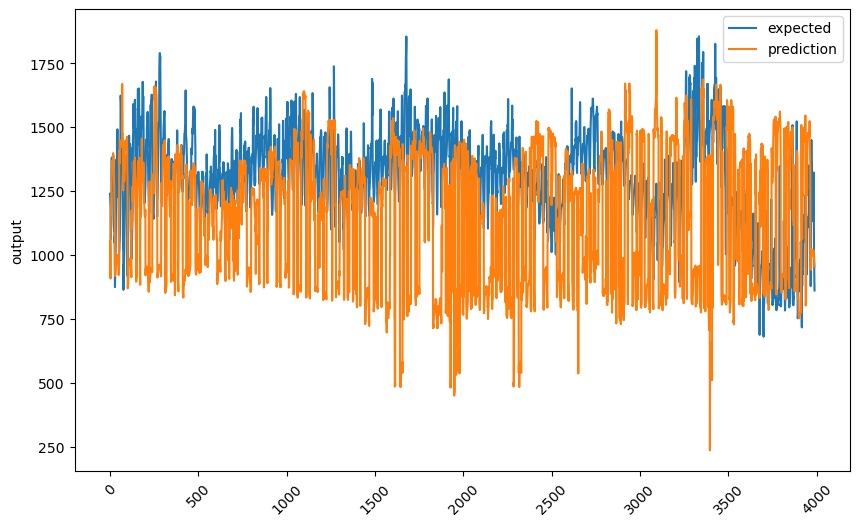

Last 300 values:


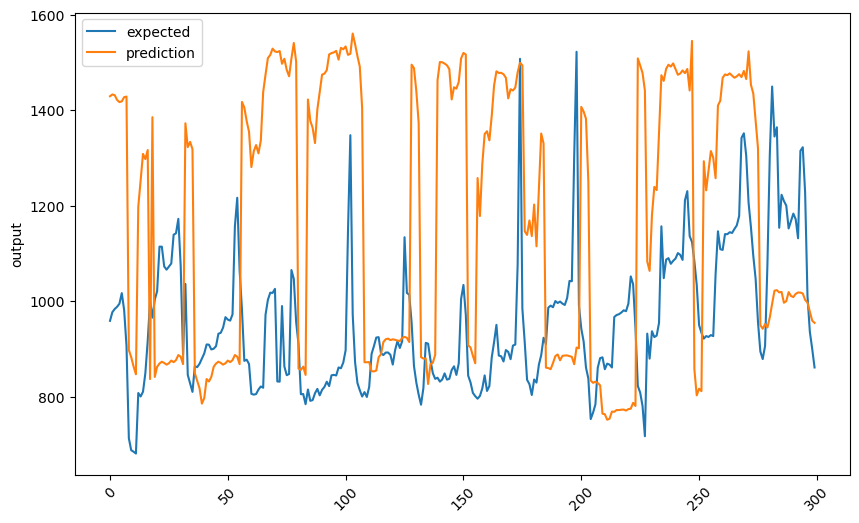

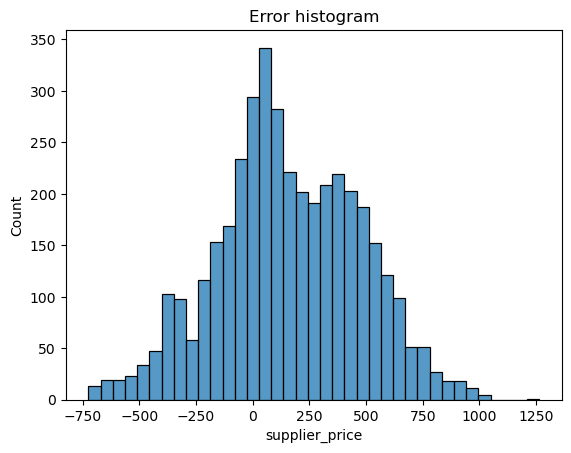

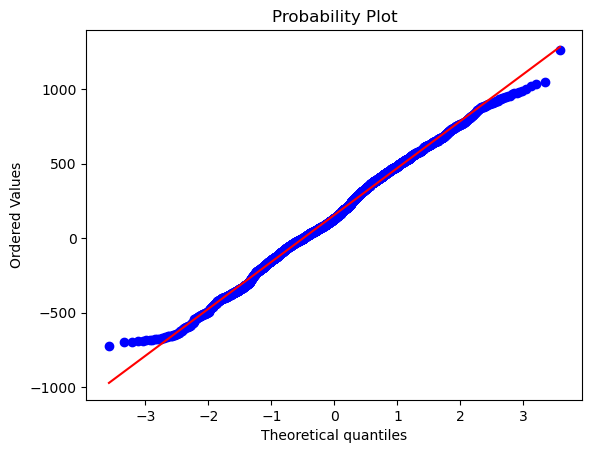

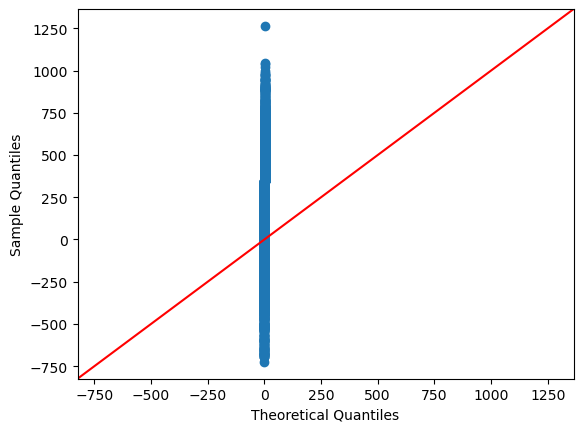

----------
Statistical test for normality of residuals:
----------

D'Agostino & Pearson:  NOT Normal
15.408615224190099

Jarque-Bera:           NOT Normal
12.066019178359008

Kolmogorov-Smirnov:    NOT Normal
0.03077516460656815

Lilliefors:            NOT Normal
0.03077516460656815

Shapiro-Wilk:          NOT Normal
0.9964855313301086

Anderson–Darling:      NOT Normal
4.859556697145308

Done!

----------------
BAG w/Bootstrap model...
Fold #1...
Fold #2...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\ensemble\_bagging.py:508: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return column_or_1d(y, warn=True)
C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\ensemble\_bagging.py:508: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return column_or_1d(y, warn=True)


Fold #3...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\ensemble\_bagging.py:508: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return column_or_1d(y, warn=True)


Fold #4...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\ensemble\_bagging.py:508: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return column_or_1d(y, warn=True)


Fold #5...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\ensemble\_bagging.py:508: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return column_or_1d(y, warn=True)


Fold #6...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\ensemble\_bagging.py:508: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return column_or_1d(y, warn=True)


Fold #7...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\ensemble\_bagging.py:508: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return column_or_1d(y, warn=True)


Fold #8...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\ensemble\_bagging.py:508: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return column_or_1d(y, warn=True)


Fold #9...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\ensemble\_bagging.py:508: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return column_or_1d(y, warn=True)


Fold #10...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\ensemble\_bagging.py:508: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return column_or_1d(y, warn=True)


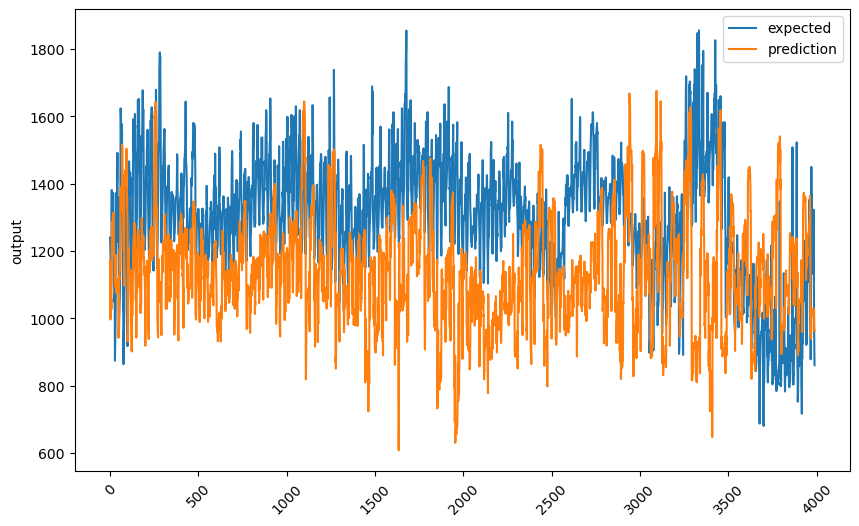

Last 300 values:


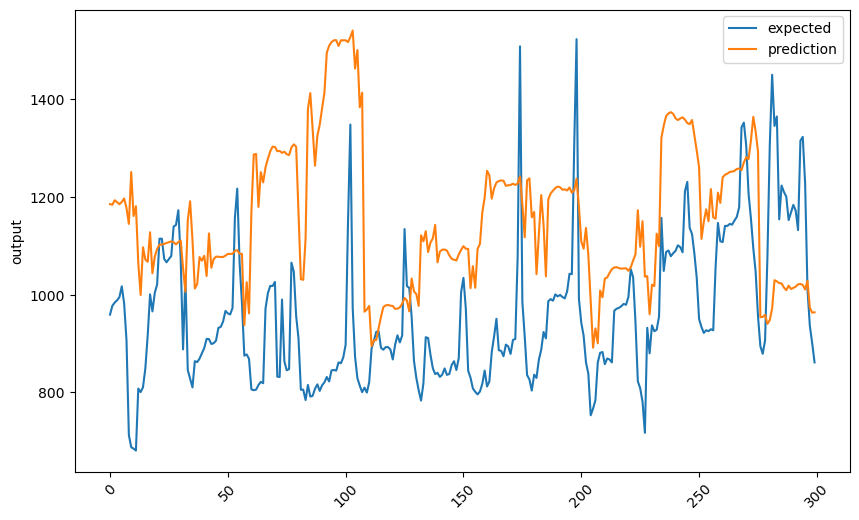

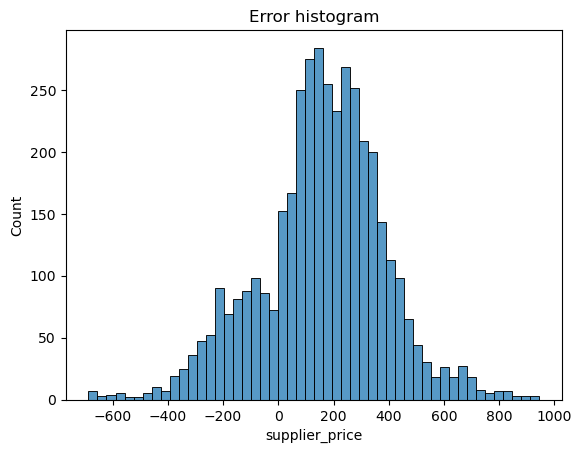

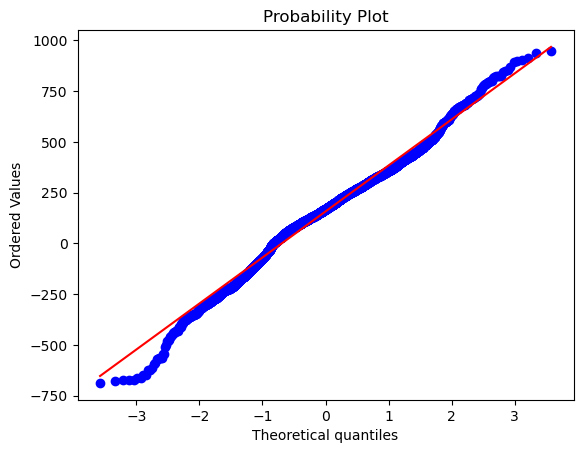

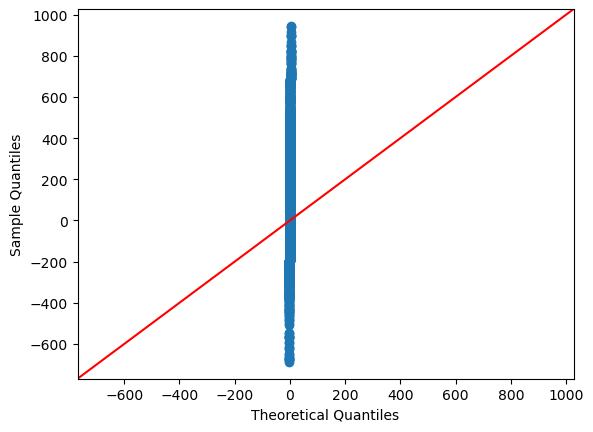

----------
Statistical test for normality of residuals:
----------

D'Agostino & Pearson:  NOT Normal
84.07422127096262

Jarque-Bera:           NOT Normal
119.59897988860155

Kolmogorov-Smirnov:    NOT Normal
0.058765986697068895

Lilliefors:            NOT Normal
0.058765986697068895

Shapiro-Wilk:          NOT Normal
0.9878333210945129

Anderson–Darling:      NOT Normal
17.894707872084837

Done!

----------------
ADA model...
Fold #1...
Fold #2...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Fold #3...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Fold #4...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Fold #5...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Fold #6...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Fold #7...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Fold #8...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Fold #9...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Fold #10...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


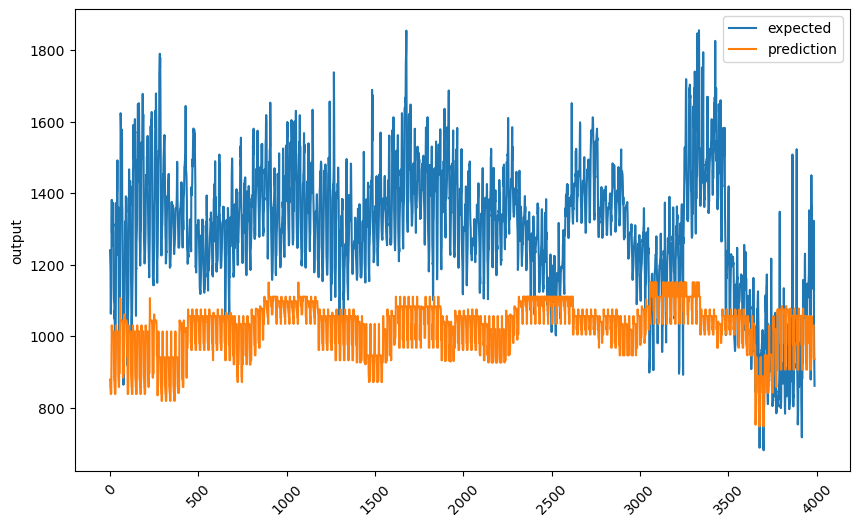

Last 300 values:


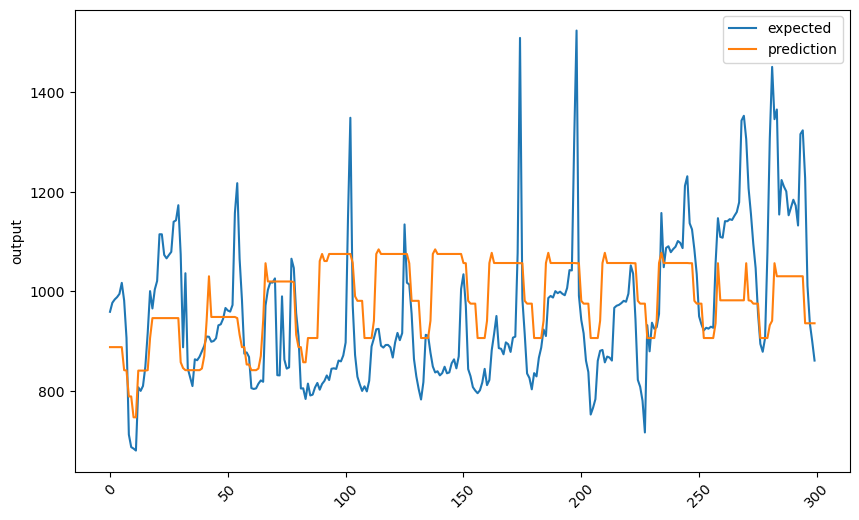

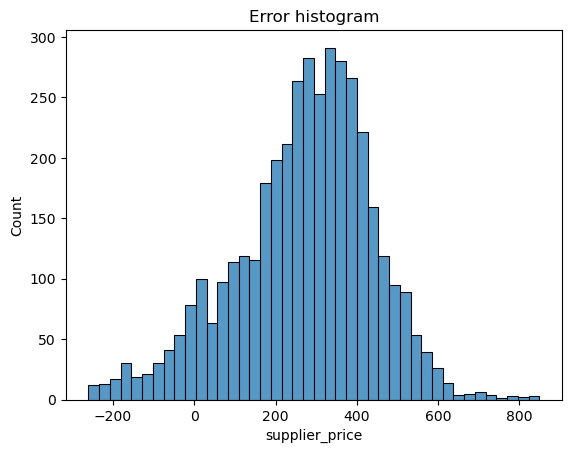

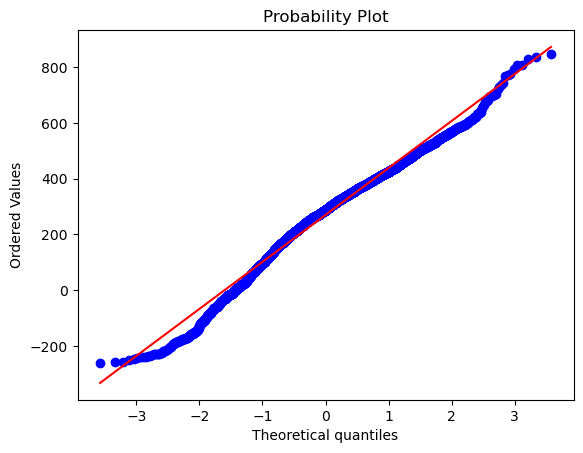

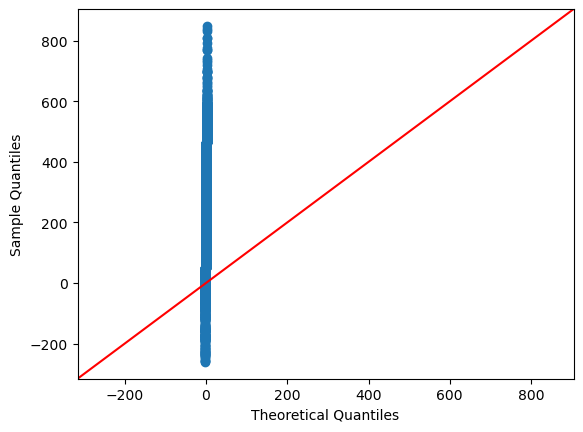

----------
Statistical test for normality of residuals:
----------

D'Agostino & Pearson:  NOT Normal
129.59923102947297

Jarque-Bera:           NOT Normal
142.75852132037193

Kolmogorov-Smirnov:    NOT Normal
0.05685238912617668

Lilliefors:            NOT Normal
0.05685238912617668

Shapiro-Wilk:          NOT Normal
0.9836874008178711

Anderson–Darling:      NOT Normal
22.0629391675061

Done!

----------------
HGBoost model...
Fold #1...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Fold #2...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Fold #3...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Fold #4...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Fold #5...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Fold #6...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Fold #7...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Fold #8...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Fold #9...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Fold #10...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


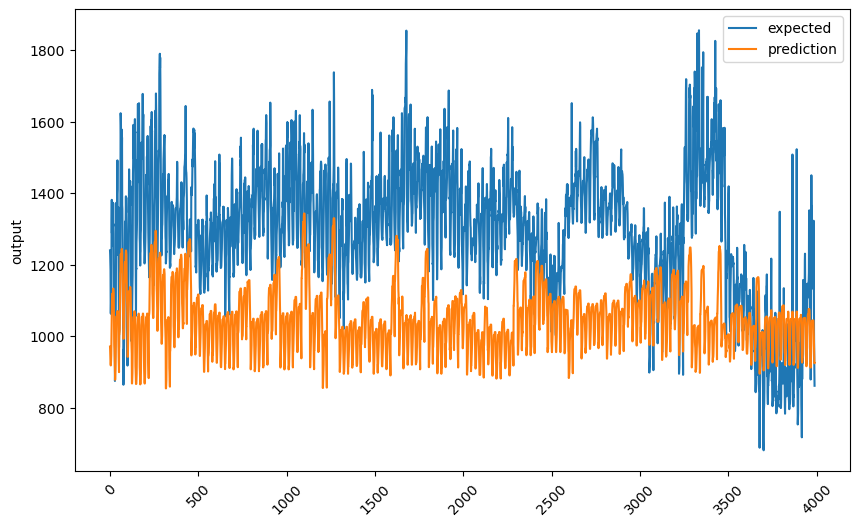

Last 300 values:


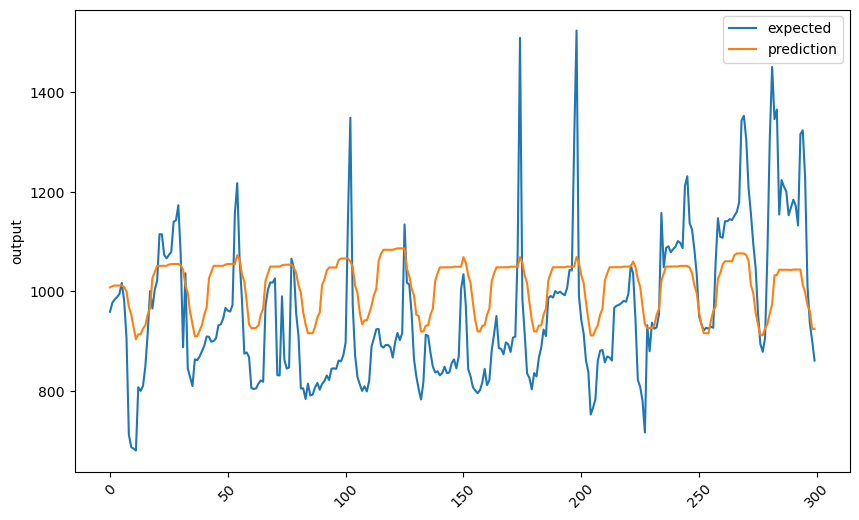

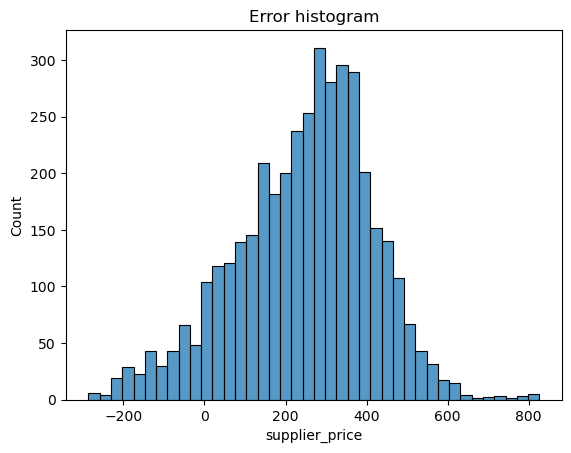

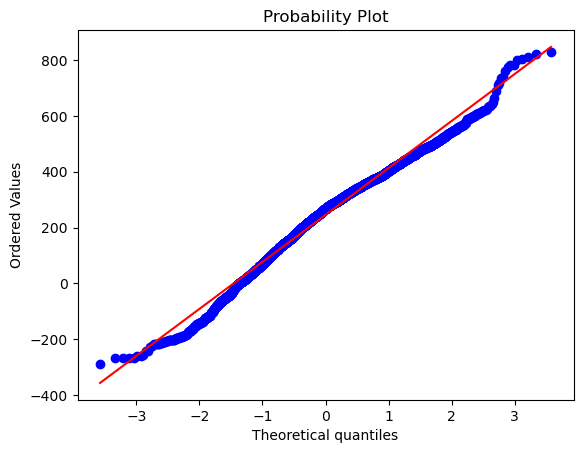

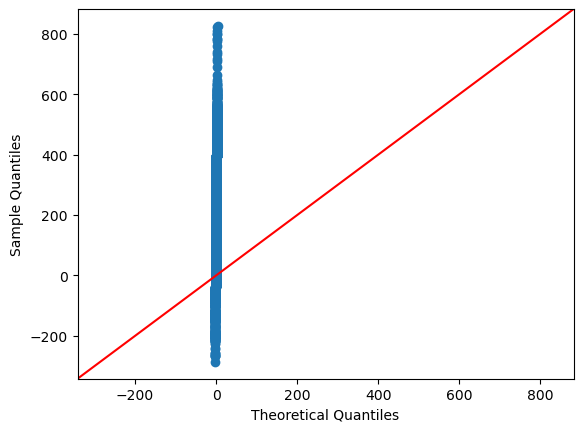

----------
Statistical test for normality of residuals:
----------

D'Agostino & Pearson:  NOT Normal
90.2549583039209

Jarque-Bera:           NOT Normal
95.90241866199156

Kolmogorov-Smirnov:    NOT Normal
0.05394004826301452

Lilliefors:            NOT Normal
0.05394004826301452

Shapiro-Wilk:          NOT Normal
0.9866566061973572

Anderson–Darling:      NOT Normal
18.059952306792184

Done!

----------------
XGBoost model...
Fold #1...
Fold #2...
Fold #3...
Fold #4...
Fold #5...
Fold #6...
Fold #7...
Fold #8...
Fold #9...
Fold #10...


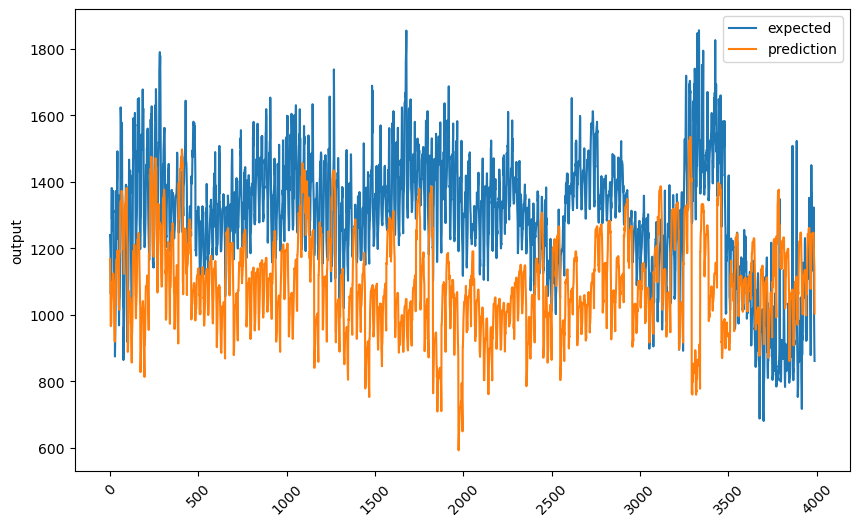

Last 300 values:


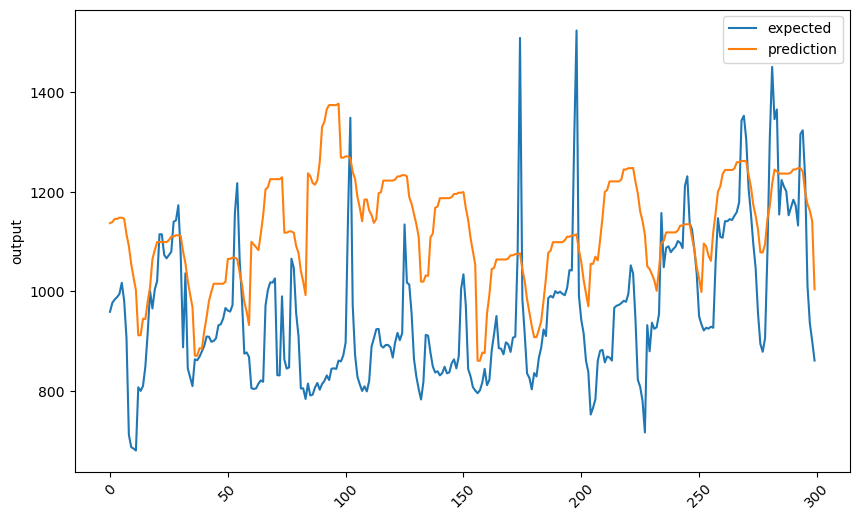

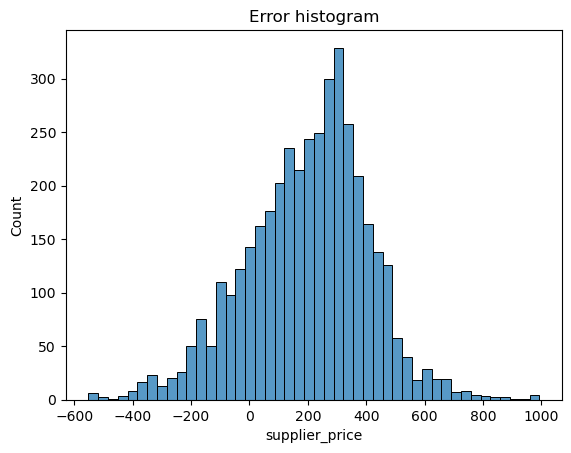

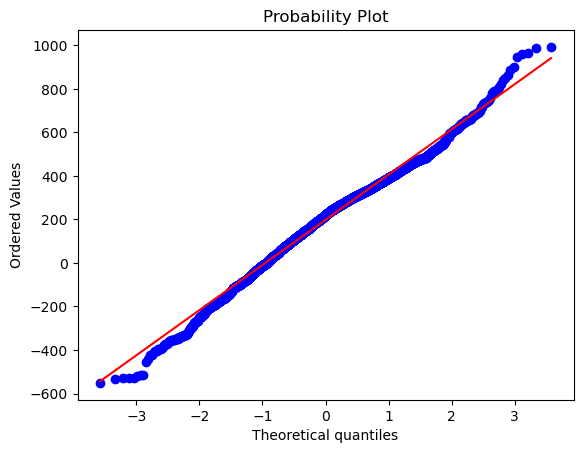

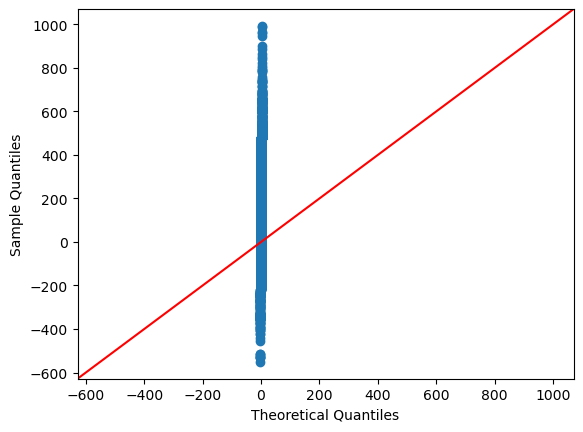

----------
Statistical test for normality of residuals:
----------

D'Agostino & Pearson:  NOT Normal
64.51866939803897

Jarque-Bera:           NOT Normal
74.4656466194083

Kolmogorov-Smirnov:    NOT Normal
0.04796065521694992

Lilliefors:            NOT Normal
0.04796065521694992

Shapiro-Wilk:          NOT Normal
0.9910095930099487

Anderson–Darling:      NOT Normal
12.531814401850625

Done!

----------------
CatBoost model...
Fold #1...


Default metric period is 5 because MAE is/are not implemented for GPU


Fold #2...


Default metric period is 5 because MAE is/are not implemented for GPU


Fold #3...


Default metric period is 5 because MAE is/are not implemented for GPU


Fold #4...


Default metric period is 5 because MAE is/are not implemented for GPU


Fold #5...


Default metric period is 5 because MAE is/are not implemented for GPU


Fold #6...


Default metric period is 5 because MAE is/are not implemented for GPU


Fold #7...


Default metric period is 5 because MAE is/are not implemented for GPU


Fold #8...


Default metric period is 5 because MAE is/are not implemented for GPU


Fold #9...


Default metric period is 5 because MAE is/are not implemented for GPU


Fold #10...


Default metric period is 5 because MAE is/are not implemented for GPU


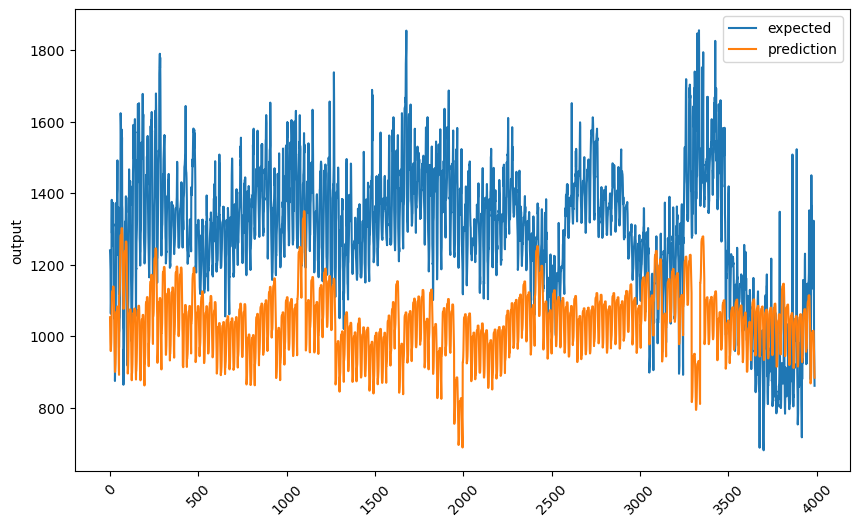

Last 300 values:


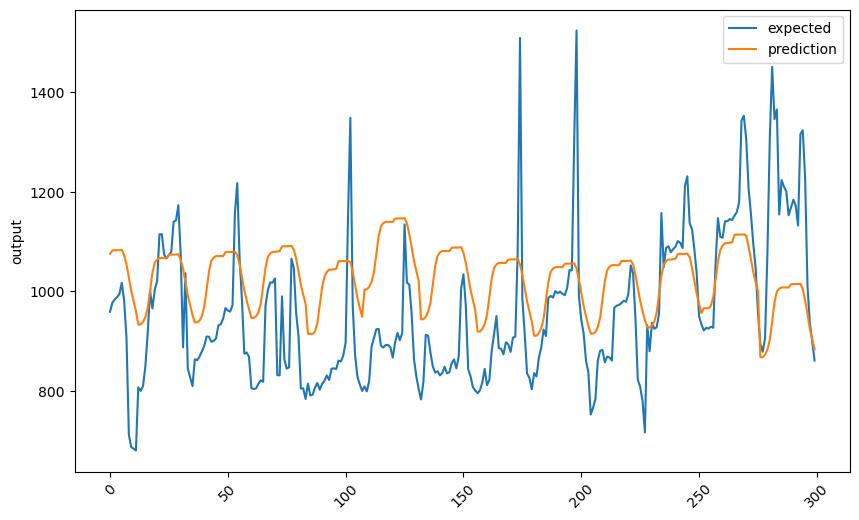

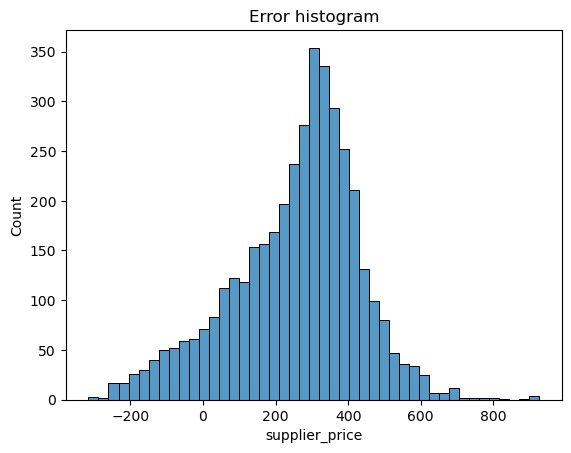

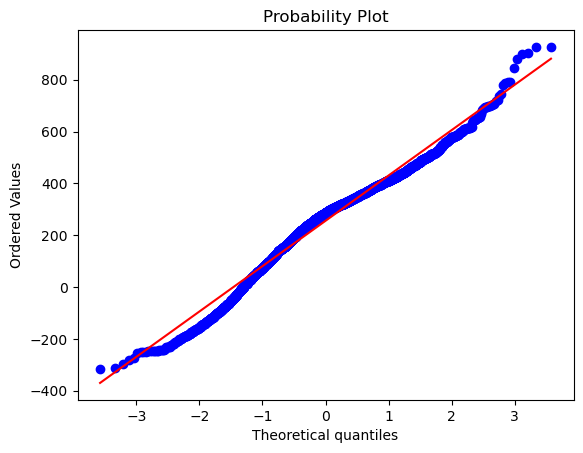

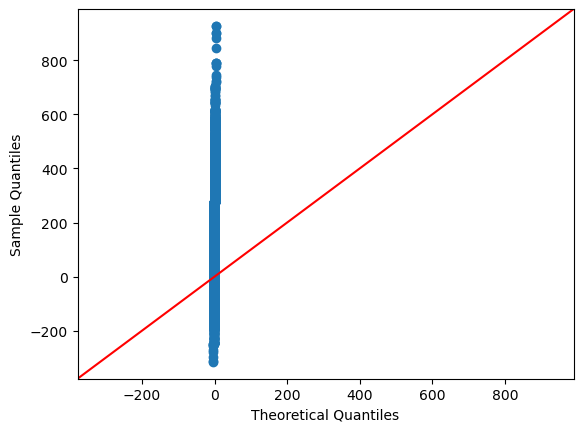

----------
Statistical test for normality of residuals:
----------

D'Agostino & Pearson:  NOT Normal
140.31118857020158

Jarque-Bera:           NOT Normal
158.10632454106064

Kolmogorov-Smirnov:    NOT Normal
0.07712839199882654

Lilliefors:            NOT Normal
0.07712839199882654

Shapiro-Wilk:          NOT Normal
0.9769556522369385

Anderson–Darling:      NOT Normal
35.95871677551804

Done!



In [61]:
names = []
for name, model in models:
    names.append(name)
    print('----------------')
    print(f'{name} model...')
    model_results = {
        'r2' : [],
        'mse' : [],
        'rmse' : [],
        'mae' : [],
        'mape' : [],
        'smape' : []
    }
    fold_num = 1
    timeFold = TimeSeriesSplit(n_splits = NUM_OF_SPLITS)
    for train_range, test_range in timeFold.split(df_train):
        print(f'Fold #{fold_num}...')
        train = df_train.iloc[train_range]
        test = df_train.iloc[test_range]
        scaler = StandardScaler()
        train_scaled = scaler.fit_transform(train)
        train_scaled = pd.DataFrame(train_scaled, columns = train.columns, index = train.index)
        test_scaled = scaler.transform(test)
        test_scaled = pd.DataFrame(test_scaled, columns = test.columns, index = test.index)
        x_train, y_train = train_scaled.drop(columns = TARGET_COLUMN), train_scaled[[TARGET_COLUMN]]
        x_test, y_test = test_scaled.drop(columns = TARGET_COLUMN), test_scaled[[TARGET_COLUMN]]
        model.fit(x_train, y_train)
        y_pred = model.predict(x_test)
        pred = x_test.copy()
        pred[TARGET_COLUMN] = y_pred
        pred = scaler.inverse_transform(pred)
        pred = pd.DataFrame(pred, columns = test.columns, index = test.index)
        y_pred = pred[TARGET_COLUMN]
        y_test = test[TARGET_COLUMN]
        mse_result = mse(y_test, y_pred)
        model_results['r2'].append(r2(y_test, y_pred))
        model_results['mse'].append(mse_result)
        model_results['rmse'].append(np.sqrt(mse_result))
        model_results['mae'].append(mae(y_test, y_pred))
        model_results['mape'].append(mape(y_test, y_pred) * 100.0)
        model_results['smape'].append(smape(y_test, y_pred))
        if fold_num == NUM_OF_SPLITS:
            show_regression_chart(y_test, y_pred, sort = False)
            print(f'Last {LATEST_PRED_AMOUNT} values:')
            show_regression_chart(y_test[-LATEST_PRED_AMOUNT:], y_pred[-LATEST_PRED_AMOUNT:], sort = False)
            show_error_histogram(y_test, y_pred)
            resudials = y_test - y_pred
            show_probability_plot(resudials)
            show_quantile_quantile_plot(resudials)
            print('-' * 10)
            print('Statistical test for normality of residuals:')
            print('-' * 10)
            print()
            run_tests_for_normality(resudials)
        fold_num += 1
    for model_result_key, model_result_value in model_results.items():
        results[model_result_key].append(model_result_value)
    print('Done!')
    print()

### DL models

In [69]:
df_train = df_sup.copy()
df_train = df_train.drop(columns = ['year'])
df_train

,quarter,month,week_of_year,day_of_year,day_of_week,day,hour,supplier_price
date,,,,,,,,
2019-05-27 00:00:00+00:00,2,5,22,147,0,27,0,949.90
2019-05-27 01:00:00+00:00,2,5,22,147,0,27,1,942.20
2019-05-27 02:00:00+00:00,2,5,22,147,0,27,2,952.14
2019-05-27 03:00:00+00:00,2,5,22,147,0,27,3,944.93
2019-05-27 04:00:00+00:00,2,5,22,147,0,27,4,966.00
...,...,...,...,...,...,...,...,...
2024-05-27 19:00:00+00:00,2,5,22,148,0,27,19,1227.36
2024-05-27 20:00:00+00:00,2,5,22,148,0,27,20,1010.99
2024-05-27 21:00:00+00:00,2,5,22,148,0,27,21,936.12


In [ ]:
dl_models = []
dl_models.append(('FFNN-10-1', get_perceptron_4))
dl_models.append(('FFNN-10-5-1', get_perceptron_5))
dl_models.append(('FFNN-10-5-2-1', get_perceptron_1))
dl_models.append(('FFNN-20-10-5-1', get_perceptron_2))
dl_models.append(('FFNN-20-10-5-2-1', get_perceptron_3))

----------------
FFNN-10-1 model...
Fold #1...
Fold #2...
Fold #3...
Fold #4...
Fold #5...
Fold #6...
Fold #7...
Fold #8...
Fold #9...
Fold #10...


<Figure size 700x600 with 0 Axes>

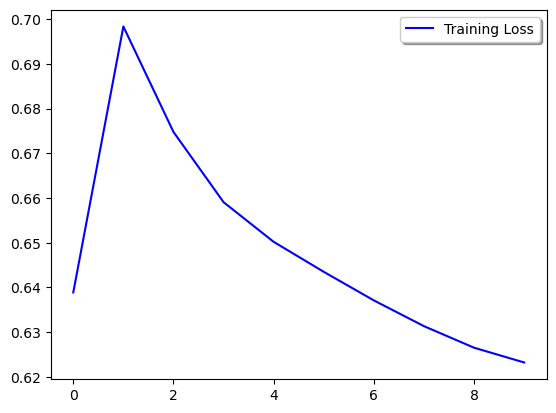

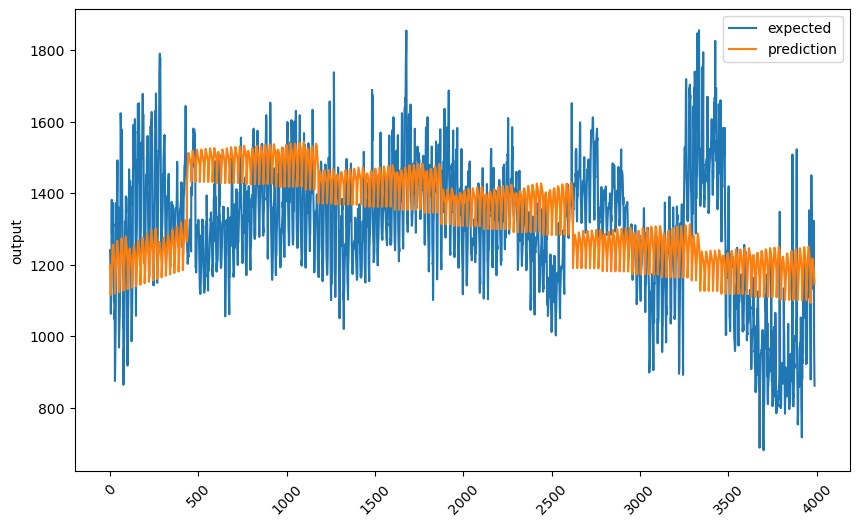

Last 300 values:


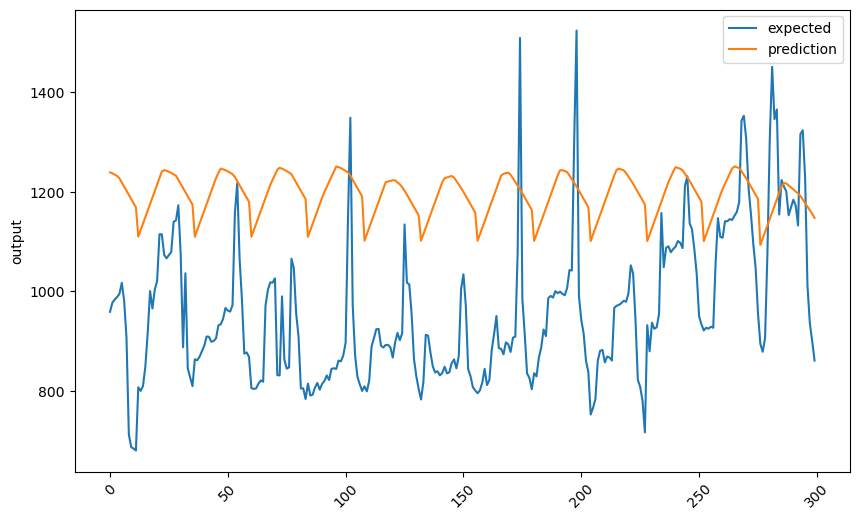

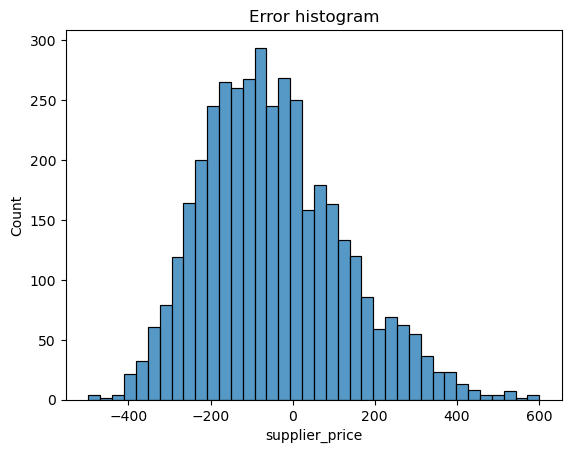

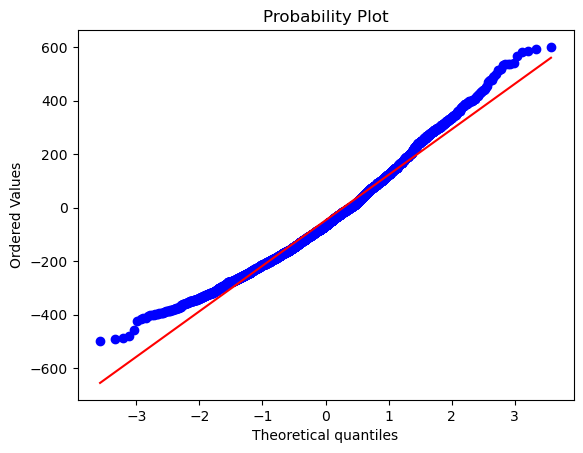

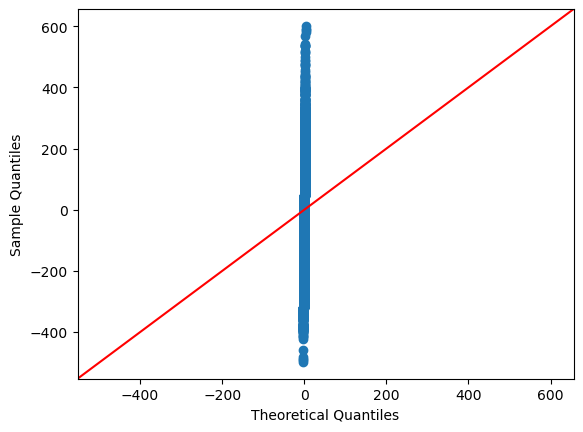

----------
Statistical test for normality of residuals:
----------

D'Agostino & Pearson:  NOT Normal
175.05091008159192

Jarque-Bera:           NOT Normal
197.64709304149955

Kolmogorov-Smirnov:    NOT Normal
0.046252576754644614

Lilliefors:            NOT Normal
0.046252576754644614

Shapiro-Wilk:          NOT Normal
0.9814593195915222

Anderson–Darling:      NOT Normal
18.76866226175298

Done!

----------------
FFNN-10-5-1 model...
Fold #1...
Fold #2...
Fold #3...
Fold #4...
Fold #5...
Fold #6...
Fold #7...
Fold #8...
Fold #9...
Fold #10...


<Figure size 700x600 with 0 Axes>

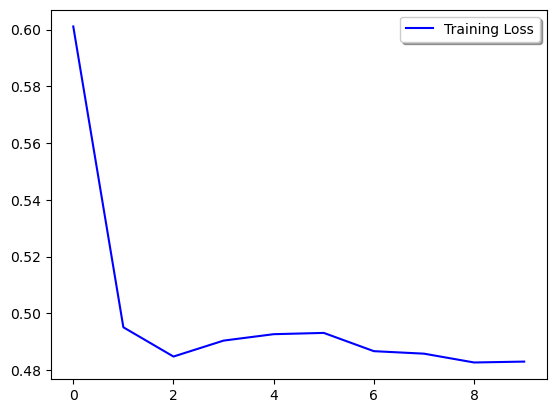

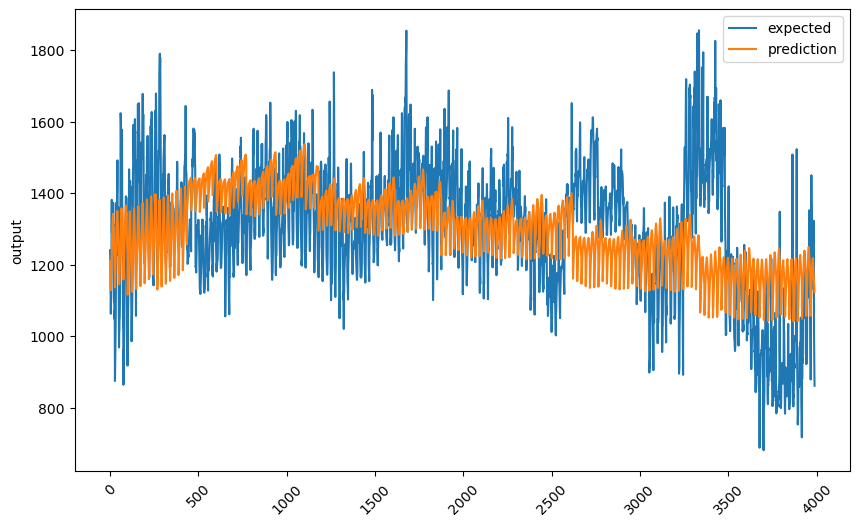

Last 300 values:


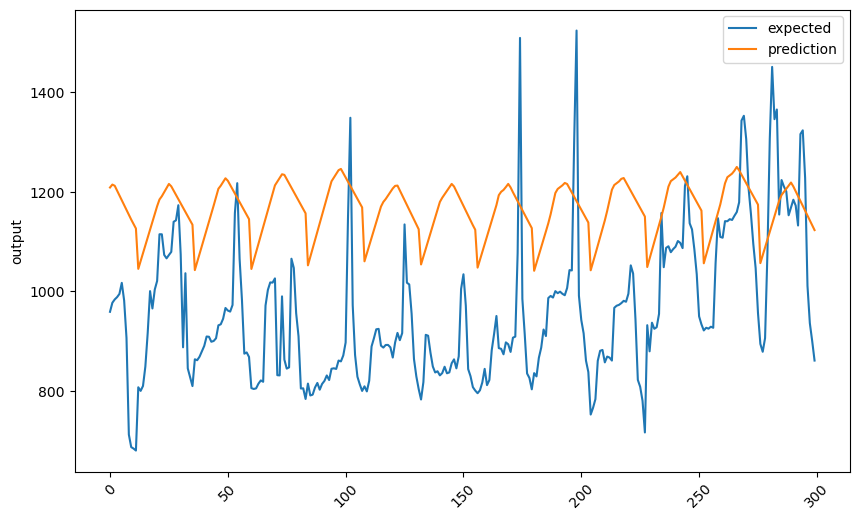

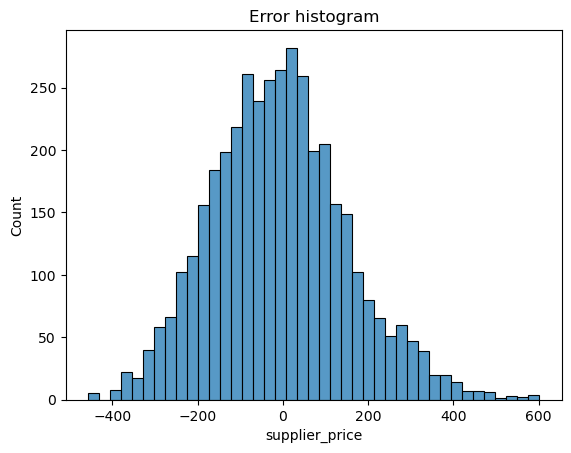

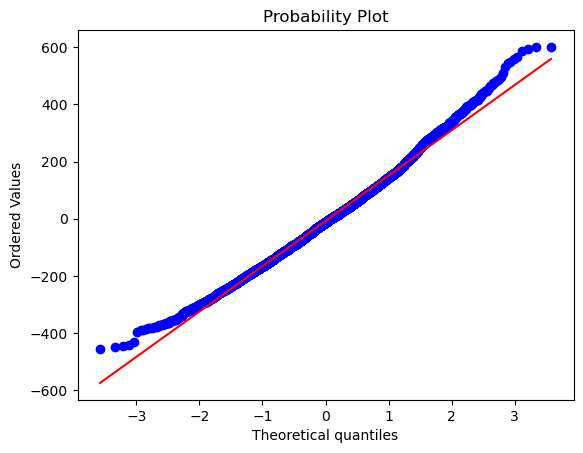

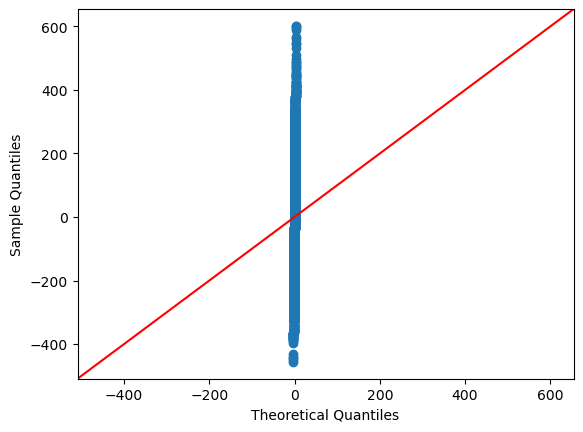

----------
Statistical test for normality of residuals:
----------

D'Agostino & Pearson:  NOT Normal
81.7755813549549

Jarque-Bera:           NOT Normal
87.03790274832737

Kolmogorov-Smirnov:    NOT Normal
0.02647084605172223

Lilliefors:            NOT Normal
0.02647084605172223

Shapiro-Wilk:          NOT Normal
0.9929108619689941

Anderson–Darling:      NOT Normal
5.269517799209098

Done!

----------------
FFNN-10-5-2-1 model...
Fold #1...
Fold #2...
Fold #3...
Fold #4...
Fold #5...
Fold #6...
Fold #7...
Fold #8...
Fold #9...
Fold #10...


<Figure size 700x600 with 0 Axes>

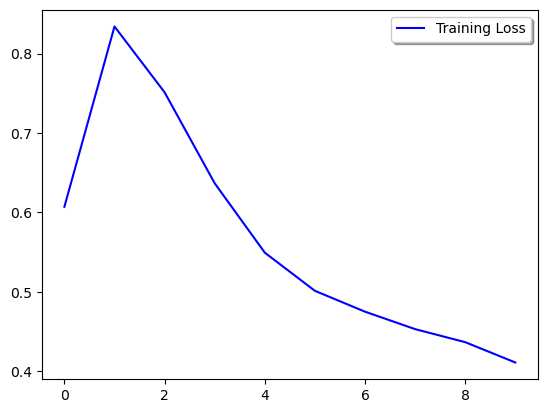

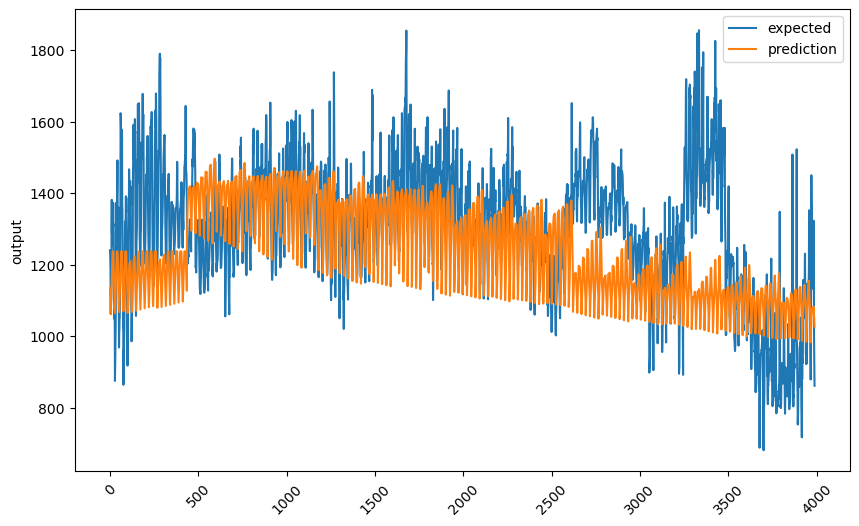

Last 300 values:


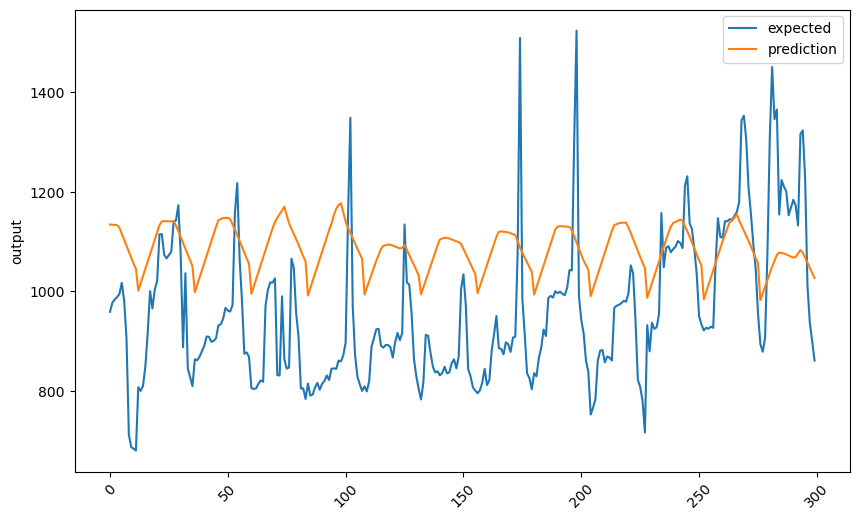

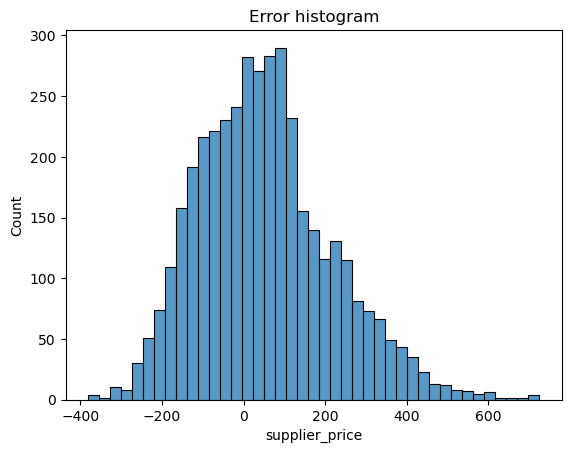

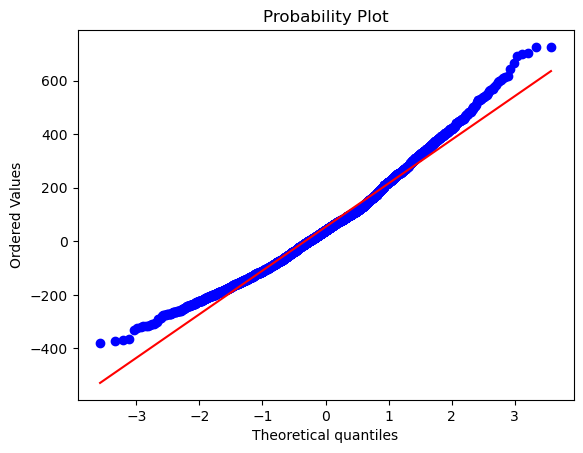

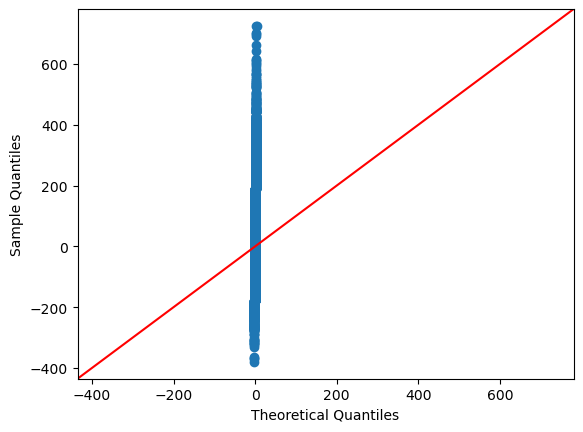

----------
Statistical test for normality of residuals:
----------

D'Agostino & Pearson:  NOT Normal
185.22207569364517

Jarque-Bera:           NOT Normal
211.49675219617527

Kolmogorov-Smirnov:    NOT Normal
0.04816151052878859

Lilliefors:            NOT Normal
0.04816151052878859

Shapiro-Wilk:          NOT Normal
0.9826132655143738

Anderson–Darling:      NOT Normal
15.921955399968738

Done!

----------------
FFNN-20-10-5-1 model...
Fold #1...
Fold #2...
Fold #3...
Fold #4...
Fold #5...
Fold #6...
Fold #7...
Fold #8...
Fold #9...
Fold #10...


<Figure size 700x600 with 0 Axes>

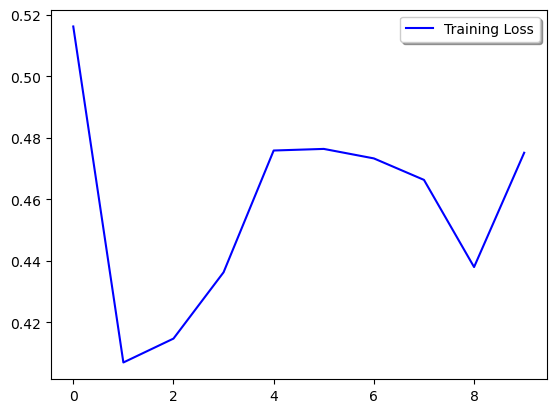

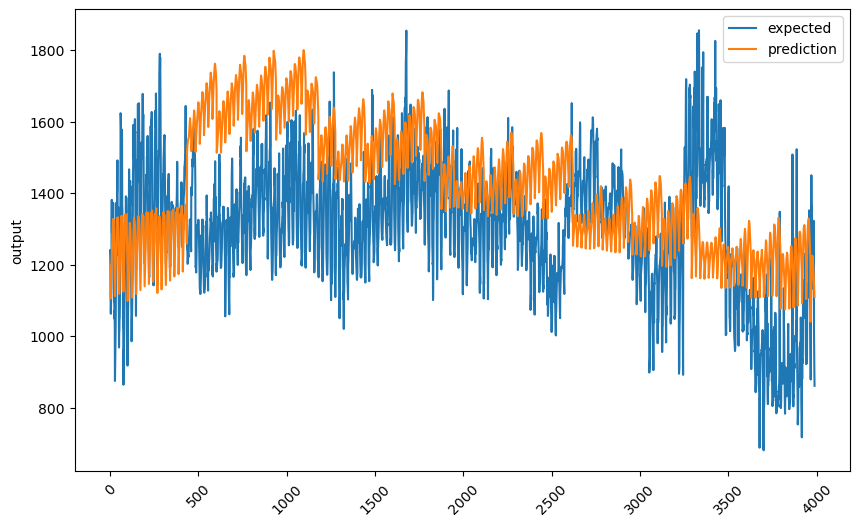

Last 300 values:


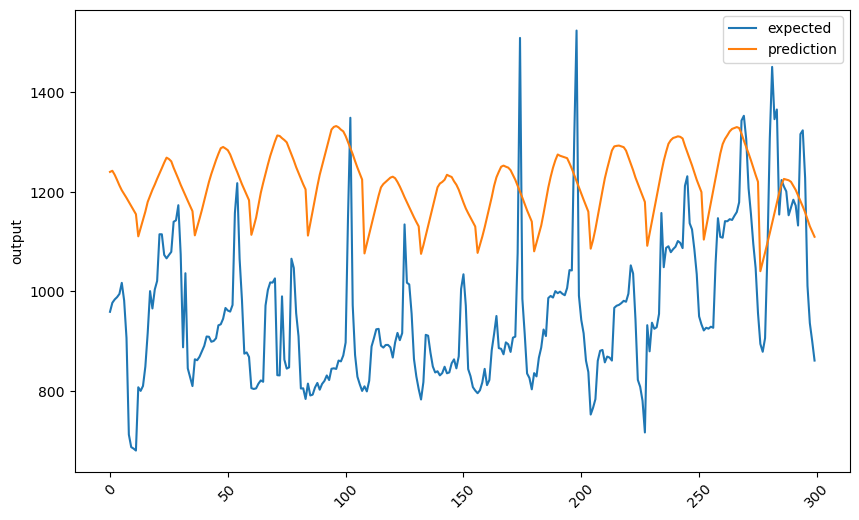

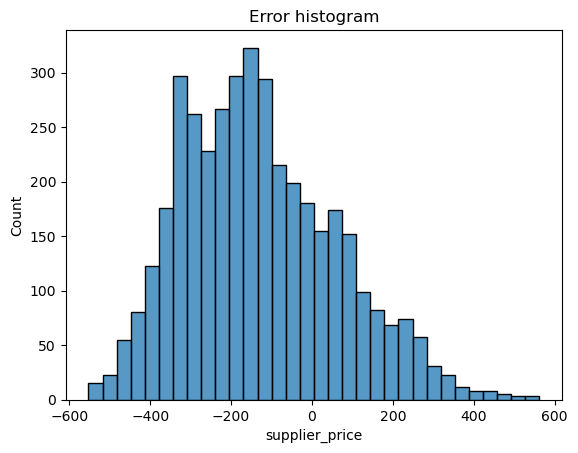

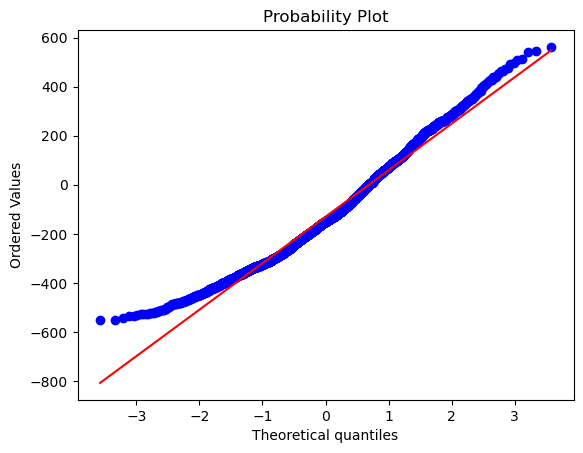

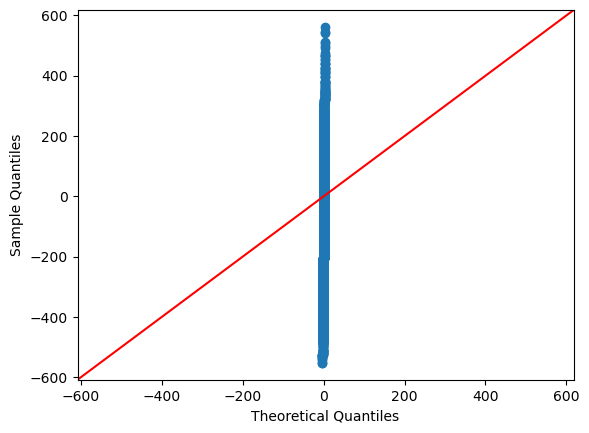

----------
Statistical test for normality of residuals:
----------

D'Agostino & Pearson:  NOT Normal
150.7085755579469

Jarque-Bera:           NOT Normal
166.75747383792663

Kolmogorov-Smirnov:    NOT Normal
0.05332660773110354

Lilliefors:            NOT Normal
0.05332660773110354

Shapiro-Wilk:          NOT Normal
0.980085015296936

Anderson–Darling:      NOT Normal
21.41328369954681

Done!

----------------
FFNN-20-10-5-2-1 model...
Fold #1...
Fold #2...
Fold #3...
Fold #4...
Fold #5...
Fold #6...
Fold #7...
Fold #8...
Fold #9...
Fold #10...


<Figure size 700x600 with 0 Axes>

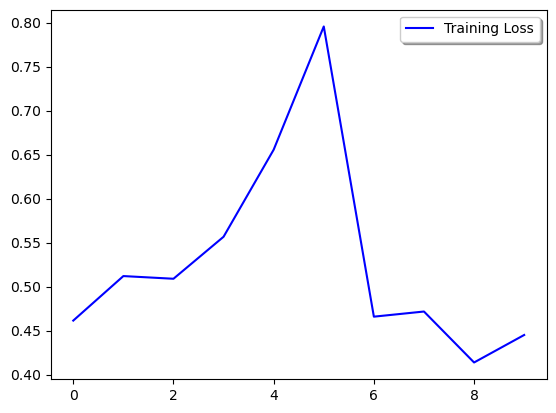

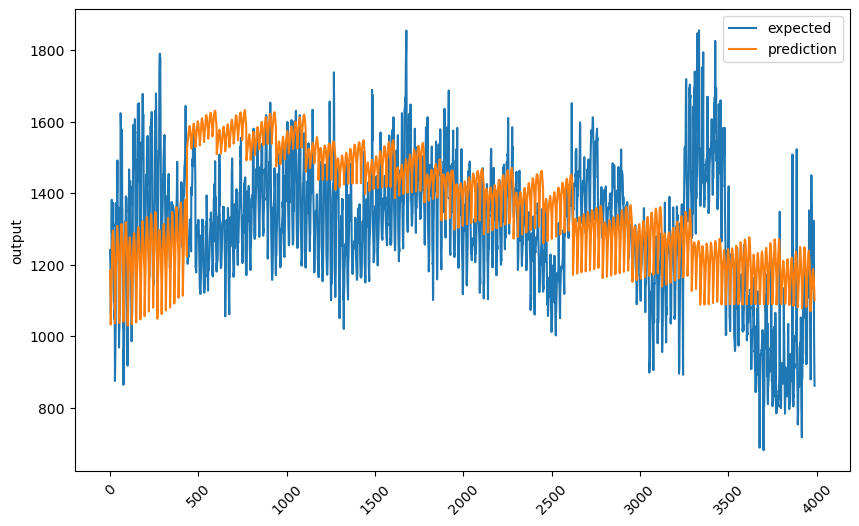

Last 300 values:


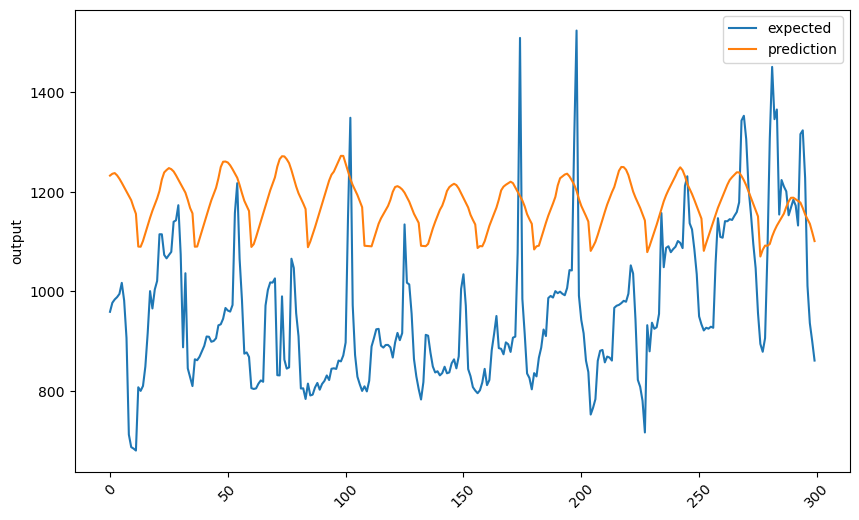

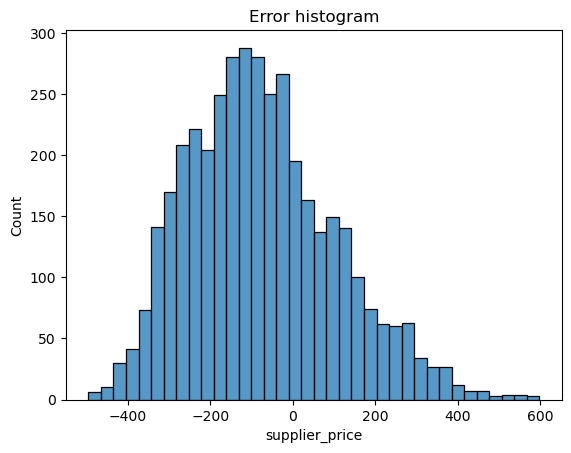

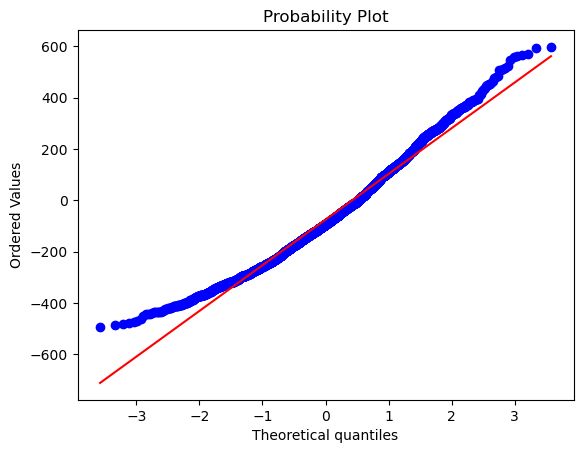

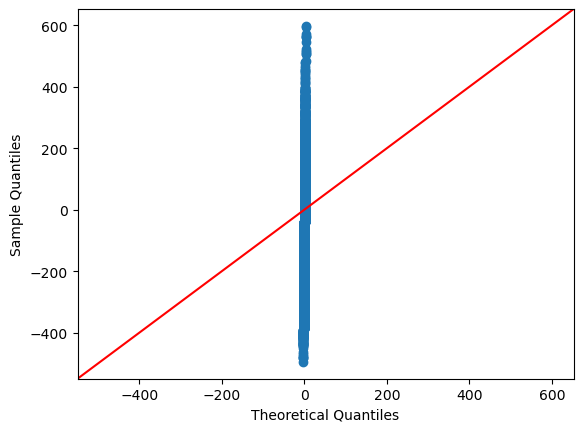

----------
Statistical test for normality of residuals:
----------

D'Agostino & Pearson:  NOT Normal
159.2378161393347

Jarque-Bera:           NOT Normal
178.23301139787137

Kolmogorov-Smirnov:    NOT Normal
0.04351215053516644

Lilliefors:            NOT Normal
0.04351215053516644

Shapiro-Wilk:          NOT Normal
0.9814884066581726

Anderson–Darling:      NOT Normal
17.414333358417025

Done!



In [71]:
for name, model_function in dl_models:
    names.append(name)
    print('----------------')
    print(f'{name} model...')
    model_results = {
        'r2' : [],
        'mse' : [],
        'rmse' : [],
        'mae' : [],
        'mape' : [],
        'smape': []
    }
    fold_num = 1
    timeFold = TimeSeriesSplit(n_splits = NUM_OF_SPLITS)
    for train_range, test_range in timeFold.split(df_train):
        print(f'Fold #{fold_num}...')
        train = df_train.iloc[train_range]
        test = df_train.iloc[test_range]
        scaler = StandardScaler()
        train_scaled = scaler.fit_transform(train)
        train_scaled = pd.DataFrame(train_scaled, columns = train.columns, index = train.index)
        test_scaled = scaler.transform(test)
        test_scaled = pd.DataFrame(test_scaled, columns = test.columns, index = test.index)
        x_train, y_train = train_scaled.drop(columns = TARGET_COLUMN), train_scaled[[TARGET_COLUMN]]
        x_test, y_test = test_scaled.drop(columns = TARGET_COLUMN), test_scaled[[TARGET_COLUMN]]
        model = model_function(INPUT_SHAPE_FF)
        train_history = model.fit(
            x = x_train,
            y = y_train,
            batch_size = BATCH_SIZE,
            epochs = EPOCHS,
            shuffle = False,
            verbose = 0).history
        y_pred = model.predict(x_test, verbose = 0)
        pred = x_test.copy()
        pred[TARGET_COLUMN] = y_pred
        pred = scaler.inverse_transform(pred)
        pred = pd.DataFrame(pred, columns = test.columns, index = test.index)
        y_pred = pred[TARGET_COLUMN]
        y_test = test[TARGET_COLUMN]
        mse_result = mse(y_test, y_pred)
        model_results['r2'].append(r2(y_test, y_pred))
        model_results['mse'].append(mse_result)
        model_results['rmse'].append(np.sqrt(mse_result))
        model_results['mae'].append(mae(y_test, y_pred))
        model_results['mape'].append(mape(y_test, y_pred) * 100.0)
        model_results['smape'].append(smape(y_test, y_pred))
        if fold_num == NUM_OF_SPLITS:
            show_training_history(train_history, ['loss'], ['Loss'])                                                                    
            show_regression_chart(y_test, y_pred, sort = False)
            print(f'Last {LATEST_PRED_AMOUNT} values:')
            show_regression_chart(y_test[-LATEST_PRED_AMOUNT:], y_pred[-LATEST_PRED_AMOUNT:], sort = False)
            show_error_histogram(y_test, y_pred)
            resudials = y_test - y_pred
            show_probability_plot(resudials)
            show_quantile_quantile_plot(resudials)
            print('-' * 10)
            print('Statistical test for normality of residuals:')
            print('-' * 10)
            print()
            run_tests_for_normality(resudials)
        fold_num += 1
    for model_result_key, model_result_value in model_results.items():
        results[model_result_key].append(model_result_value)
    print('Done!')
    print()

### Results

In [72]:
results_table = pd.DataFrame(results)
results_table = results_table.applymap(lambda x: np.median(x))
results_table = results_table.applymap(lambda x: round(x, ndigits = 2))
results_table.index = names
results_table

,r2,mse,rmse,mae,mape,smape
Naive,-0.92,36379.80,190.49,145.65,21.20,16.23
Drift,-0.79,40376.44,200.94,158.67,17.67,16.94
Average,-1.68,48839.86,220.69,197.71,25.85,21.53
LR,-1.56,53558.03,231.42,196.57,27.41,21.43
Bayesian R.,-1.57,53907.40,232.18,197.21,27.41,21.51
PAR,-3.17,102446.24,319.79,263.20,32.80,32.06
SGD,-3.18,71101.62,264.51,238.12,35.12,26.66
SVR,-5.76,175125.86,418.33,374.60,40.34,46.09
Lin. SVR,-1.54,52864.11,229.88,195.87,28.45,21.28
KNN,-2.02,51732.46,227.02,193.56,24.85,21.39


In [73]:
methods = []
errors = []
print('Minimal errors:')
print()
for column in results_table:
    if column == 'r2':
        index_of_max = results_table[column].idxmax()
        methods.append(index_of_max)
        errors.append(results_table[column][index_of_max])
    else:
        index_of_min = results_table[column].idxmin()
        methods.append(index_of_min)
        errors.append(results_table[column][index_of_min])
min_errors = pd.DataFrame(data = {'Methods': methods, 'Errors': errors}, index = results_table.columns)
min_errors

Minimal errors:



,Methods,Errors
r2,FFNN-10-1,-0.40
mse,FFNN-10-1,31414.84
rmse,FFNN-10-1,177.24
mae,Naive,145.65
mape,Drift,17.67
smape,FFNN-20-10-5-2-1,14.85


# Conclusions

Popular ML and DL models can't predict prices of Russian day-ahead wholesale electricity market accurately enough. 

Prediction tests without including of year feature shown to be less accurate than prediction when the year feature is included.

Further investigation of the topic is needed.